<a href="https://colab.research.google.com/github/Smar-na/Complete-Python-3-Bootcamp/blob/master/garch_and_sarima.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import pandas as pd

# Load the contract rates dataset
contract_data = pd.read_excel("/content/DAT Rates.xlsx")
spot_data = pd.read_excel("/content/DAT Rates_Spot.xlsx")

In [2]:
# Ensure YearMonth is in datetime format in both DataFrames
contract_data['YearMonth'] = pd.to_datetime(contract_data['YearMonth'], format='%Y%m')
spot_data['MonthYear'] = pd.to_datetime(spot_data['MonthYear'], format='%Y%m')

# Rename column 'MonthYear' to 'YearMonth' in spot_data to merge easily
spot_data.rename(columns={'MonthYear': 'YearMonth'}, inplace=True)

# Merge contract data and spot data on YearMonth and Lane-ID
merged_data = pd.merge(contract_data, spot_data, on=['Lane-ID', 'YearMonth'], how='inner')
merged_data = merged_data.drop(columns=['Lane-ID'])

# Filter the merged data to include only rows with 'mode_x' equal to 'TL'
merged_data = merged_data[merged_data['Mode_x'] == 'TL']

# Check the filtered merged data
merged_data.head()

,YearMonth,Mode_x,Ship From Zip_x,Ship To Zip_x,DAT Linehaul Cost,DAT Rate Per Mile,Mode_y,Ship From Zip_y,Ship To Zip_y,DAT Spot Linehaul Cost,Dt Spot RPM
0,2021-12-01,TL,30014,30336,345.00,9.86,TL,30014,30336,511.777000,14.622200
1,2021-12-01,TL,L7E4G7,T2C 5B1,4159.26,2.00,TL,L7E4G7,T2C 5B1,8283.167584,3.903472
2,2021-12-01,TL,60446,23231,2338.00,3.06,TL,60446,23231,3480.716400,4.361800
3,2021-12-01,TL,T2C5B1,T5S 0C4,607.32,3.37,TL,T2C5B1,T5S 0C4,728.026230,3.831717
4,2021-12-01,TL,43228,21237,1310.00,3.37,TL,43228,21237,2141.632500,5.367500


In [3]:
# Create Lane-ID by combining Ship From Zip_x and Ship To Zip_x
merged_data['Lane-ID'] = merged_data['Ship From Zip_x'].astype(str) + '-' + merged_data['Ship To Zip_x'].astype(str)

# Select the relevant columns and drop the unnecessary ones
df_cleaned = merged_data[['YearMonth', 'Lane-ID', 'DAT Rate Per Mile', 'Dt Spot RPM']]

# Display the cleaned DataFrame
df_cleaned.head()


,YearMonth,Lane-ID,DAT Rate Per Mile,Dt Spot RPM
0,2021-12-01,30014-30336,9.86,14.622200
1,2021-12-01,L7E4G7-T2C 5B1,2.00,3.903472
2,2021-12-01,60446-23231,3.06,4.361800
3,2021-12-01,T2C5B1-T5S 0C4,3.37,3.831717
4,2021-12-01,43228-21237,3.37,5.367500


In [4]:

dat_top100 = pd.read_excel("/content/Rateview Template Top 100 Lanes.csv-202410180807.combined.xlsx")


# Create Lane-ID by concatenating 'Orig Postal Code' and 'Dest Postal Code'
dat_top100['ID'] = dat_top100['Orig Postal Code'].astype(str) + '-' + dat_top100['Dest Postal Code'].astype(str)

top100_lanes = dat_top100['ID'].dropna()

top100_lanes.head()

merged_data_top100 = merged_data[merged_data['Lane-ID'].isin(top100_lanes.tolist())]

merged_data_top100.describe()

,YearMonth,DAT Linehaul Cost,DAT Rate Per Mile,DAT Spot Linehaul Cost,Dt Spot RPM
count,2881,2881.000000,2881.000000,2881.000000,2881.000000
mean,2023-05-17 10:33:46.796251648,1425.519931,2.889309,1404.701757,2.914614
min,2021-12-01 00:00:00,323.000000,1.230000,335.360000,0.720000
25%,2022-10-01 00:00:00,819.000000,1.970000,836.760000,1.780000
50%,2023-06-01 00:00:00,1316.000000,2.500000,1254.000000,2.410000
75%,2024-02-01 00:00:00,1822.000000,3.360000,1764.480000,3.390000
max,2024-09-01 00:00:00,5406.000000,8.090000,7305.111000,16.280000
std,NaN,780.141613,1.305310,785.222049,1.696198


In [5]:
# Select the relevant columns and drop the unnecessary ones
df_cleaned = merged_data_top100[['YearMonth', 'Lane-ID', 'DAT Rate Per Mile', 'Dt Spot RPM']]
print(df_cleaned)

        YearMonth      Lane-ID  DAT Rate Per Mile  Dt Spot RPM
17     2021-12-01  27410-28504               3.22       4.6443
80     2021-12-01  29842-28273               3.80       4.5652
96     2021-12-01  14424-48193               2.39       4.0002
160    2021-12-01  93308-92408               3.51       4.8138
181    2021-12-01  60446-92408               1.45       1.4690
...           ...          ...                ...          ...
179384 2024-09-01  60940-60090               5.74       4.8000
179420 2024-09-01  30014-30144               5.33       5.5000
179436 2024-09-01  60131-60940               6.66       8.6900
179452 2024-09-01  60940-60446               6.83       6.0800
179476 2024-09-01  90670-92408               7.98       7.3800

[2881 rows x 4 columns]


In [6]:
# Count the number of observations for each Lane-ID
lane_id_counts = df_cleaned['Lane-ID'].value_counts()

# Get the Lane-ID with the most observations
most_observed_lane_id = lane_id_counts.idxmax()
most_observed_count = lane_id_counts.max()

# Display the result
print(f"The Lane-ID with the most observations is {most_observed_lane_id} with {most_observed_count} observations.")

lane_id_counts


The Lane-ID with the most observations is 27410-28504 with 34 observations.


,count
Lane-ID,
27410-28504,34
76501-78130,34
30014-14424,34
30014-32063,34
30014-60446,34
...,...
33563-22841,21
33563-30601,21
75109-28147,17


In [7]:
contract_data.head()

,Lane-ID,YearMonth,Mode,Ship From Zip,Ship To Zip,DAT Linehaul Cost,DAT Rate Per Mile
0,202112-30014-30336-TL,2021-12-01,TL,30014,30336,345.00,9.86
1,202112-L7E4G7-T2C 5B1-TL,2021-12-01,TL,L7E4G7,T2C 5B1,4159.26,2.00
2,202112-93308-64153-TL,2021-12-01,TL,93308,64153,3492.00,2.20
3,202112-56560-R2C 1N1-TL,2021-12-01,TL,56560,R2C 1N1,648.00,2.91
4,202112-60446-23231-TL,2021-12-01,TL,60446,23231,2338.00,3.06


In [8]:
# Create Lane-ID by combining Ship From Zip_x and Ship To Zip_x
contract_data['Lane-ID'] = contract_data['Ship From Zip'].astype(str) + '-' + contract_data['Ship To Zip'].astype(str)

print(contract_data['Lane-ID'])


0            30014-30336
1         L7E4G7-T2C 5B1
2            93308-64153
3          56560-R2C 1N1
4            60446-23231
               ...      
290861       75110-93065
290862       95206-60525
290863       95206-78218
290864       95380-60525
290865    K0C2E0-B0M 1G0
Name: Lane-ID, Length: 290866, dtype: object


In [72]:
# Create Lane-ID by combining Ship From Zip_x and Ship To Zip_x
contract_data['Lane-ID'] = contract_data['Ship From Zip'].astype(str) + '-' + contract_data['Ship To Zip'].astype(str)


# Count the number of observations for each Lane-ID
#lane_id_contract = contract_data['Lane-ID'].value_counts()

# Get the top 10 Lane-IDs with the most observations
top_10_lane_ids = lane_id_counts.head(20).index

# Create a dictionary to store DataFrames for each of the top 10 Lane-IDs
top_10_dfs = {}

# Filter the DataFrame for each top Lane-ID and store in the dictionary
for lane_id in top_10_lane_ids:
    top_10_dfs[lane_id] = df_cleaned[df_cleaned['Lane-ID'] == lane_id]

# Display the Lane-ID with the most observations and the number of observations
for lane_id, data in top_10_dfs.items():
    print(f"Lane-ID: {lane_id}, Observations: {len(data)}")


Lane-ID: 27410-28504, Observations: 34
Lane-ID: 76501-78130, Observations: 34
Lane-ID: 30014-14424, Observations: 34
Lane-ID: 30014-32063, Observations: 34
Lane-ID: 30014-60446, Observations: 34
Lane-ID: 30014-60473, Observations: 34
Lane-ID: 60446-14424, Observations: 34
Lane-ID: 60446-30014, Observations: 34
Lane-ID: 60446-76501, Observations: 34
Lane-ID: 72104-18202, Observations: 34
Lane-ID: 76501-60446, Observations: 34
Lane-ID: 95206-92408, Observations: 34
Lane-ID: 29842-30014, Observations: 34
Lane-ID: 76501-66106, Observations: 34
Lane-ID: 27410-31788, Observations: 34
Lane-ID: 30014-92408, Observations: 34
Lane-ID: 76501-92408, Observations: 34
Lane-ID: 79603-92408, Observations: 34
Lane-ID: 92408-85043, Observations: 34
Lane-ID: 27410-45040, Observations: 34


In [10]:
# Drop duplicates from each of the top 10 DataFrames
for lane_id in top_10_dfs:
    top_10_dfs[lane_id] = top_10_dfs[lane_id].drop_duplicates()
    print(top_10_dfs[lane_id])

        YearMonth      Lane-ID  DAT Rate Per Mile  Dt Spot RPM
17     2021-12-01  27410-28504               3.22       4.6443
3094   2022-01-01  27410-28504               3.21       4.7121
5115   2022-02-01  27410-28504               3.26       4.9494
7138   2022-03-01  27410-28504               3.34       4.4861
9820   2022-04-01  27410-28504               3.44       4.3844
12081  2022-05-01  27410-28504               3.55       4.2940
14022  2022-06-01  27410-28504               3.70       4.0800
15152  2022-07-01  27410-28504               3.70       4.0600
17976  2022-08-01  27410-28504               3.64       4.2800
21337  2022-09-01  27410-28504               3.66       3.4500
24738  2022-10-01  27410-28504               3.73       3.7800
30899  2022-11-01  27410-28504               3.79       3.5700
36642  2022-12-01  27410-28504               3.76       3.5300
39384  2023-01-01  27410-28504               3.75       3.8500
41858  2023-02-01  27410-28504               3.71      

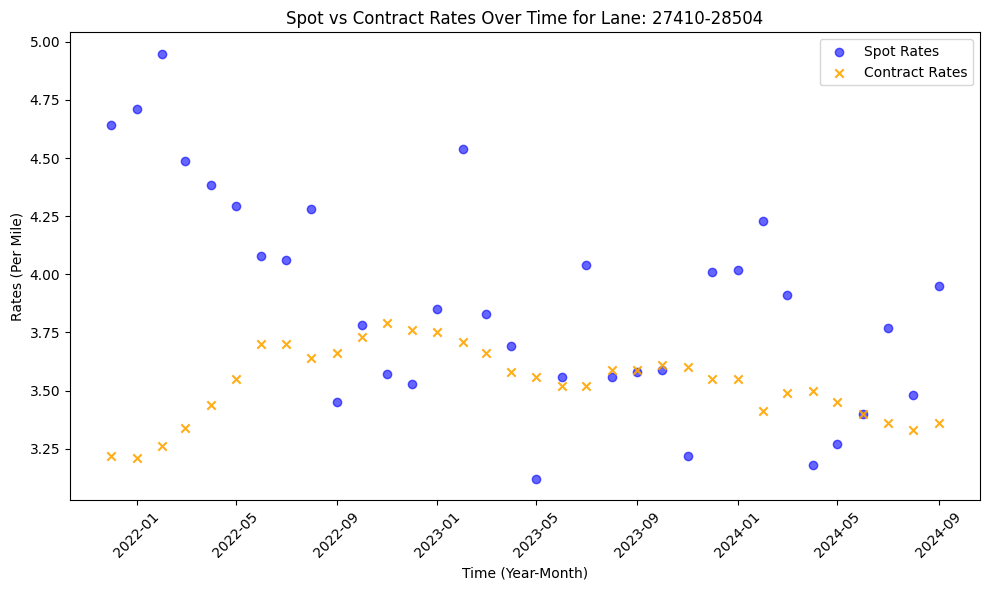

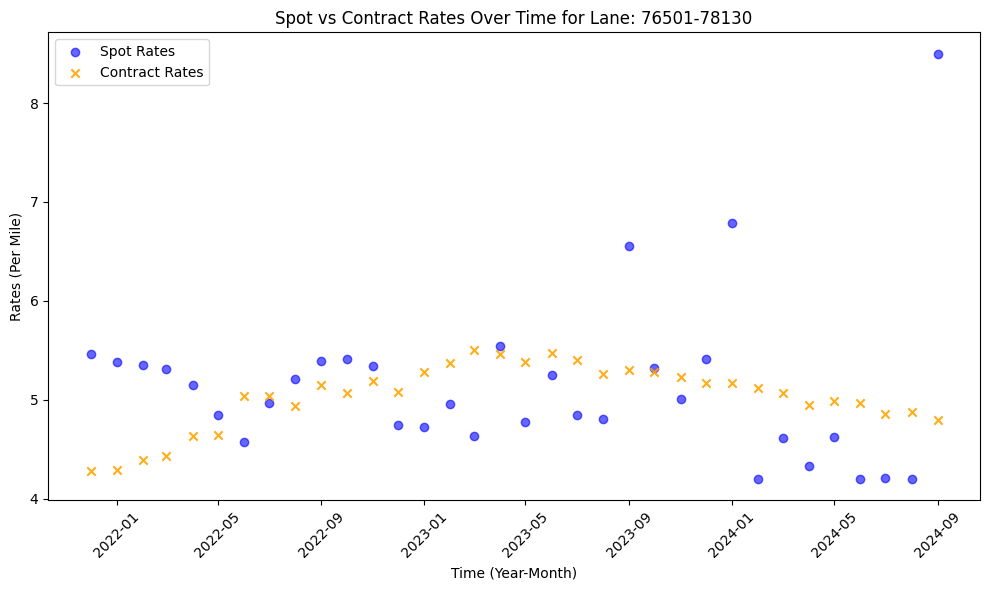

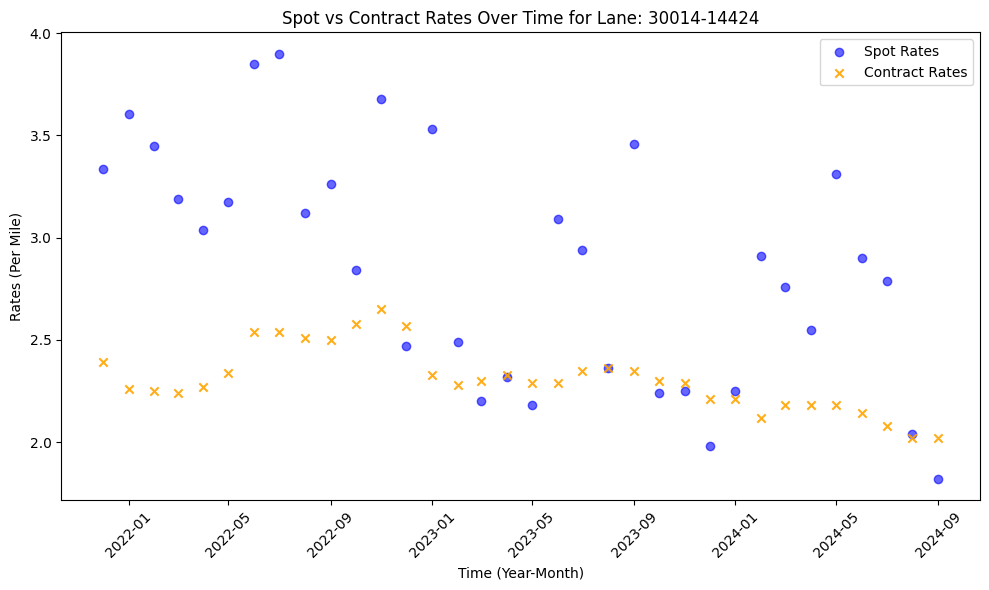

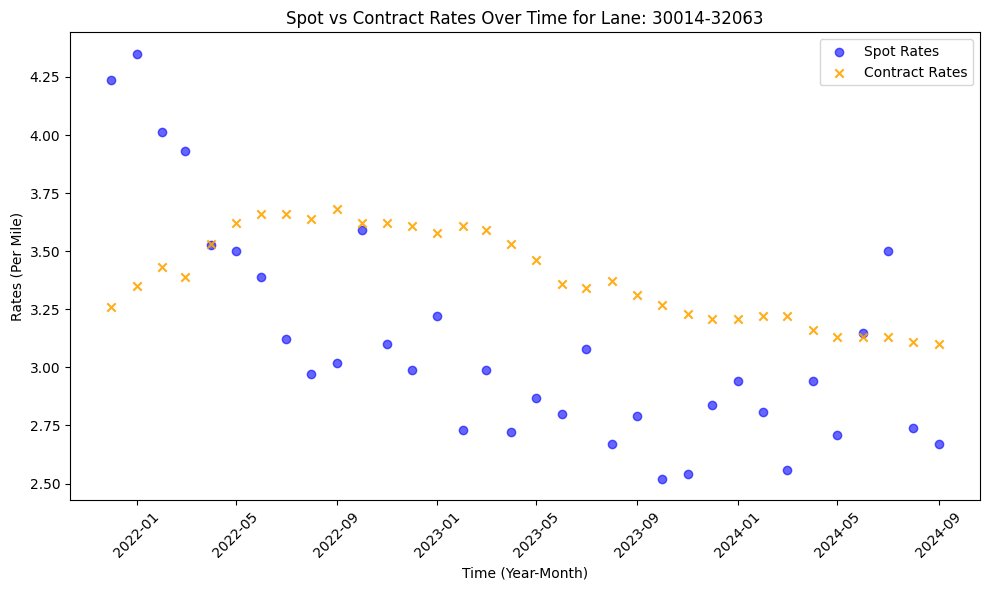

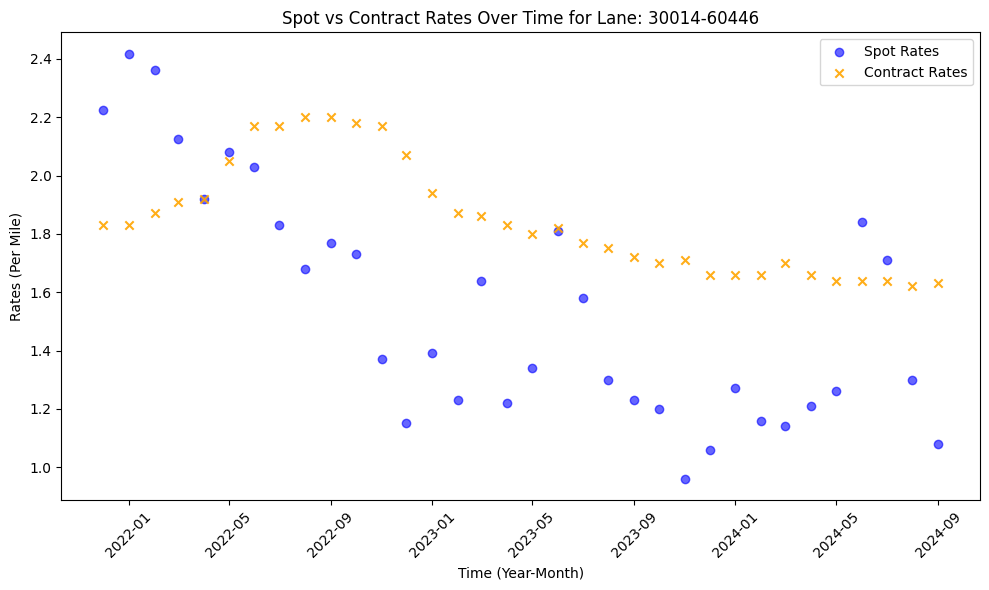

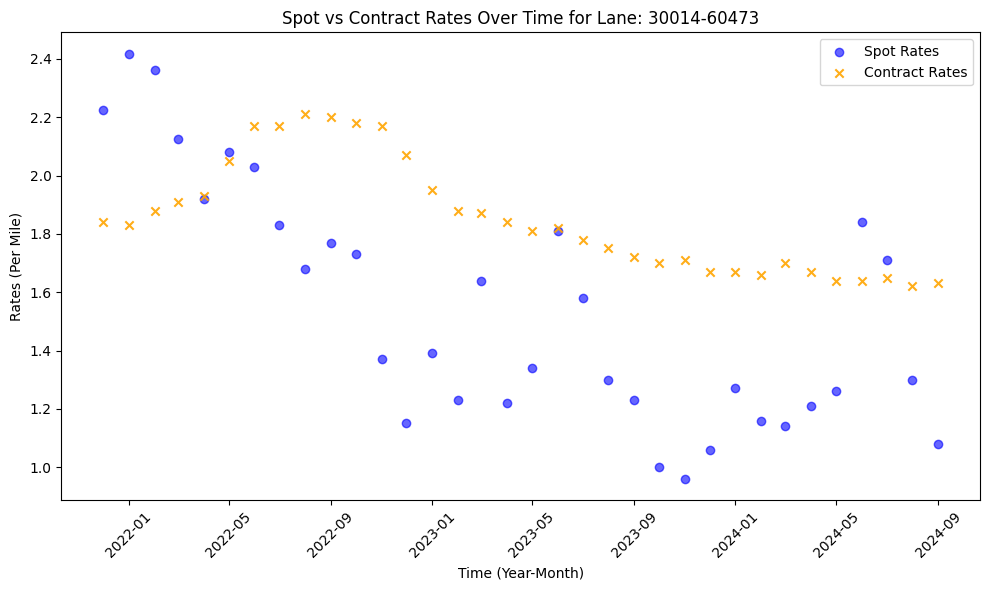

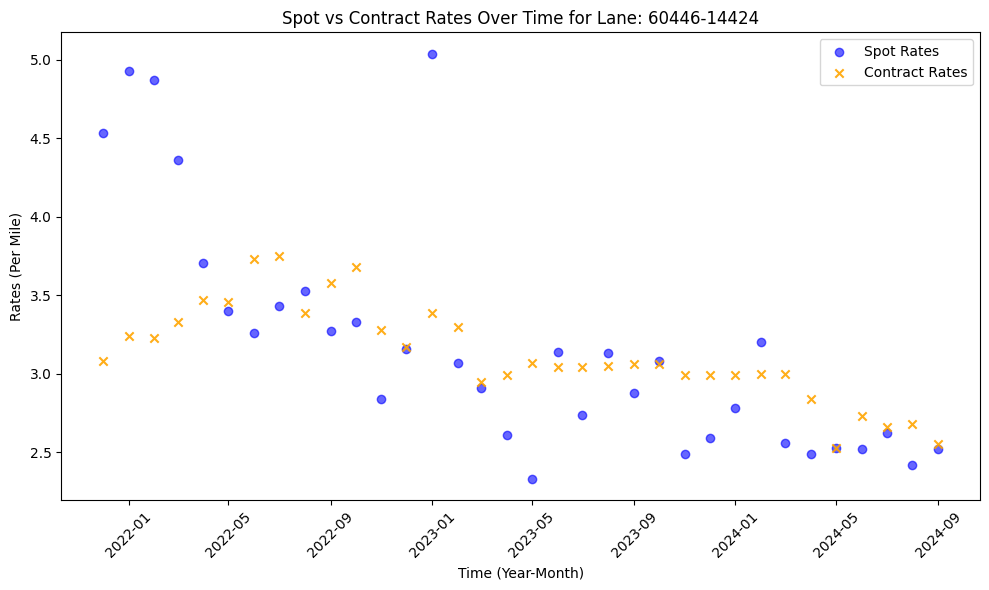

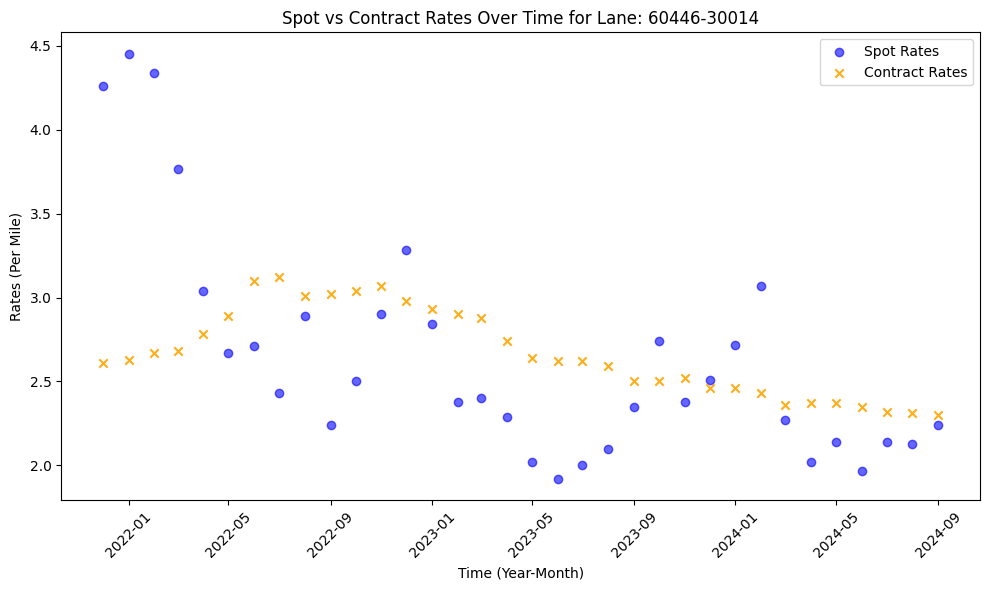

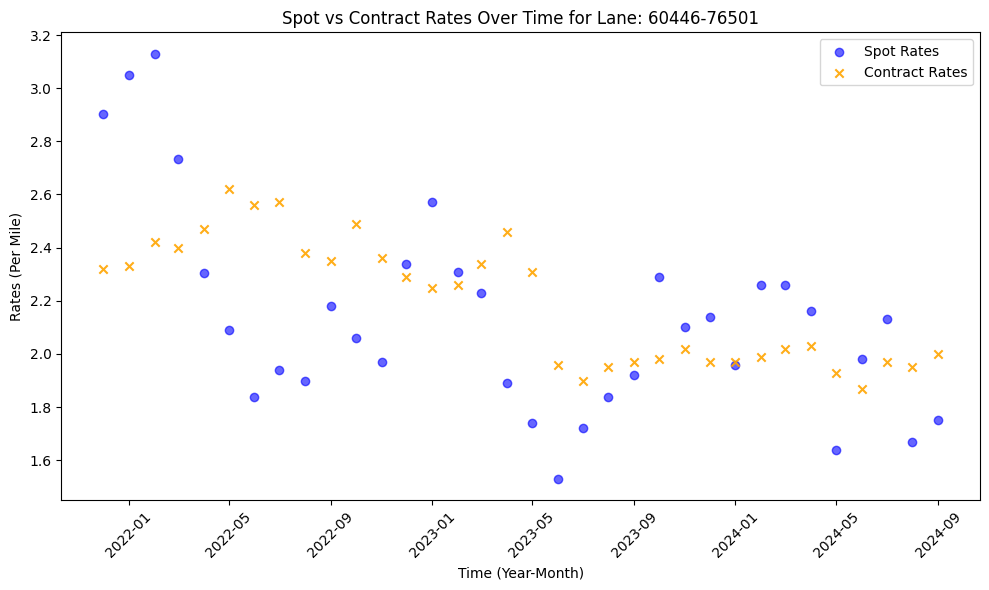

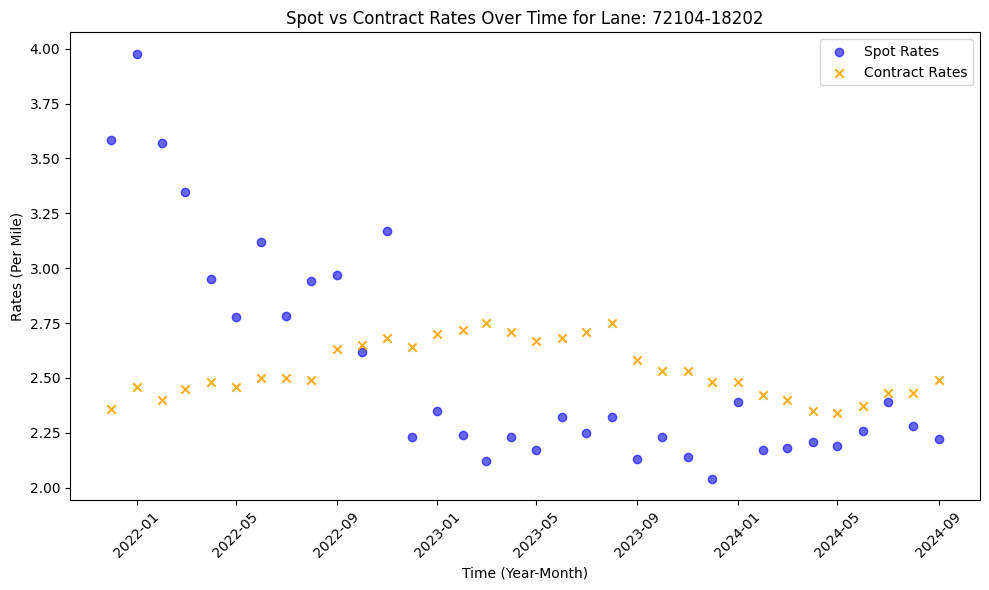

In [11]:
import matplotlib.pyplot as plt

# Ensure the 'YearMonth' column is in datetime format
merged_data['YearMonth'] = pd.to_datetime(merged_data['YearMonth'])

# Filter the DataFrame for the top 10 lanes
top_10_lanes = merged_data[merged_data['Lane-ID'].isin(top_10_dfs.keys())]

# Loop through each lane and create a separate plot
for lane_id in top_10_dfs.keys():
    # Filter data for the specific lane
    lane_data = top_10_lanes[top_10_lanes['Lane-ID'] == lane_id]

    # Create the scatter plot
    plt.figure(figsize=(10, 6))
    plt.scatter(
        lane_data['YearMonth'],
        lane_data['Dt Spot RPM'],
        label='Spot Rates',
        color='blue',
        alpha=0.6,
        marker='o'
    )
    plt.scatter(
        lane_data['YearMonth'],
        lane_data['DAT Rate Per Mile'],
        label='Contract Rates',
        color='orange',
        alpha=0.9,
        marker='x'
    )

    # Add labels, title, and legend
    plt.xlabel('Time (Year-Month)')
    plt.ylabel('Rates (Per Mile)')
    plt.title(f'Spot vs Contract Rates Over Time for Lane: {lane_id}')
    plt.legend()
    plt.xticks(rotation=45)

    # Display the plot
    plt.tight_layout()
    plt.show()


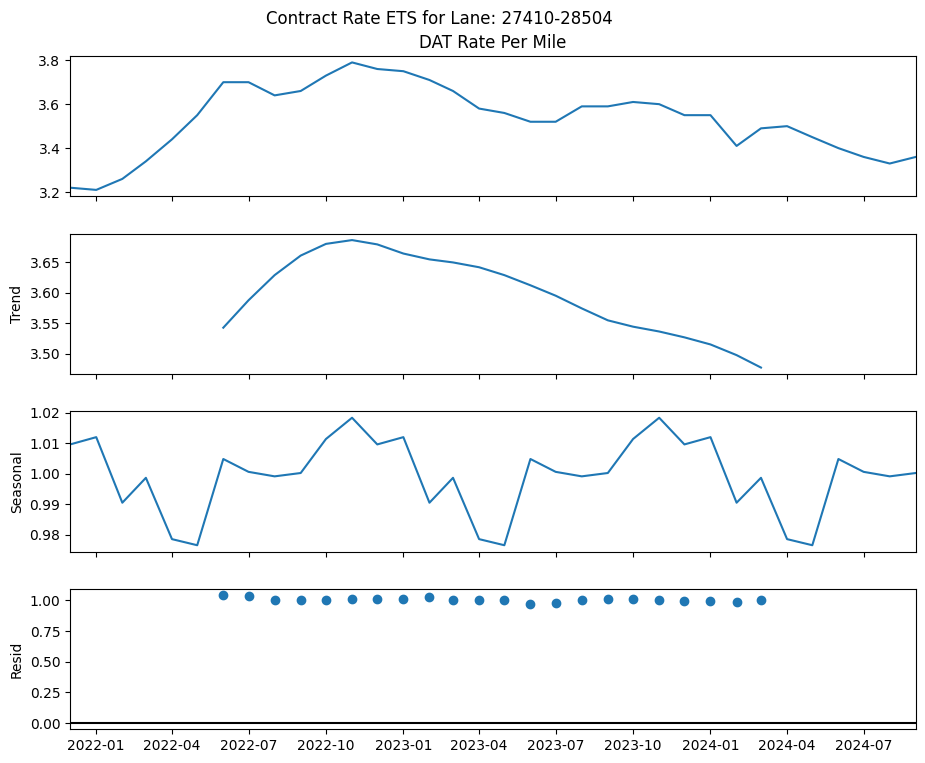

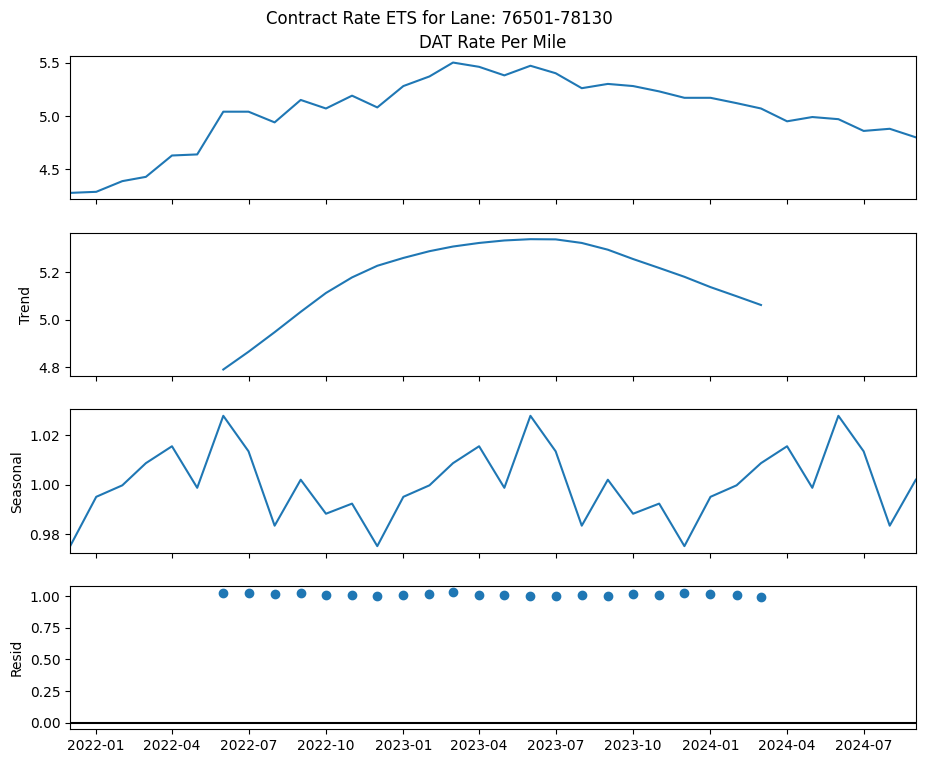

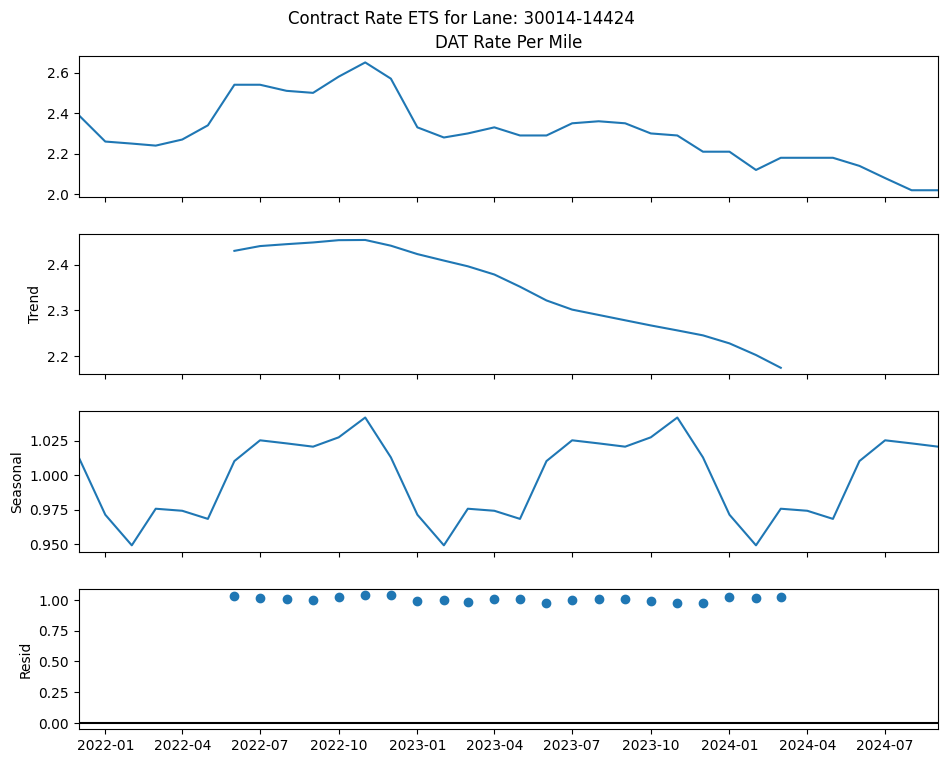

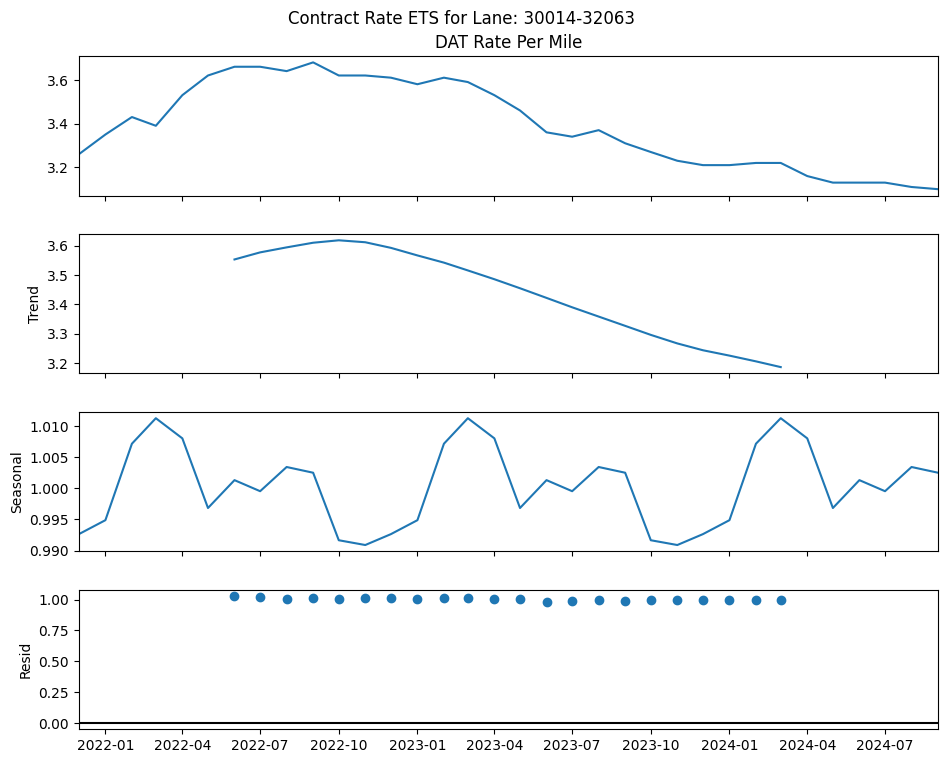

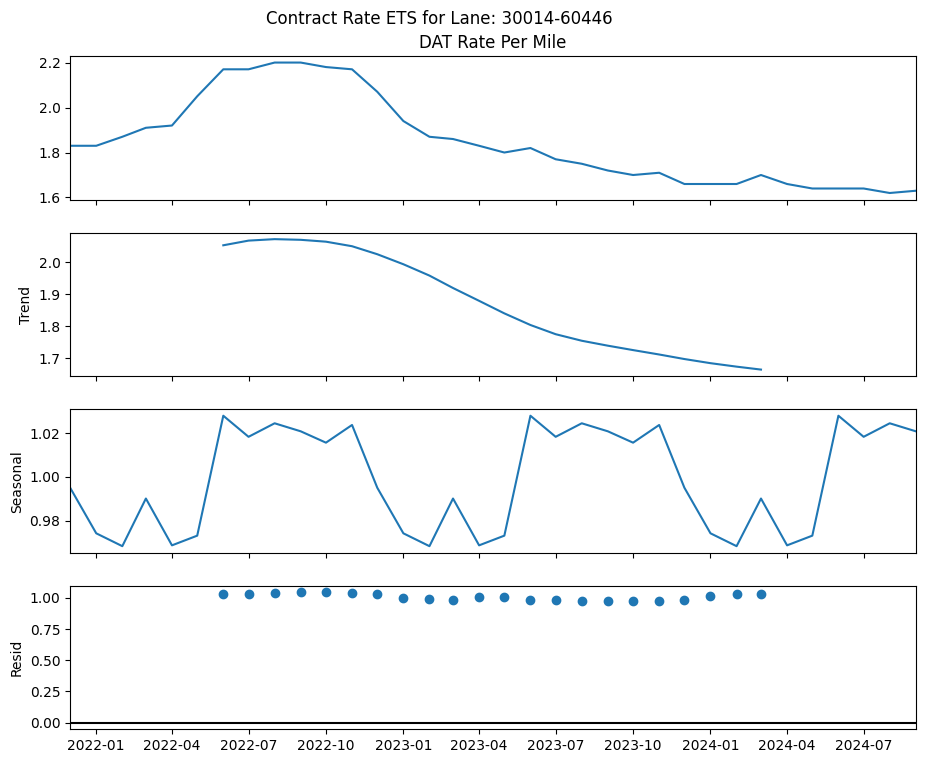

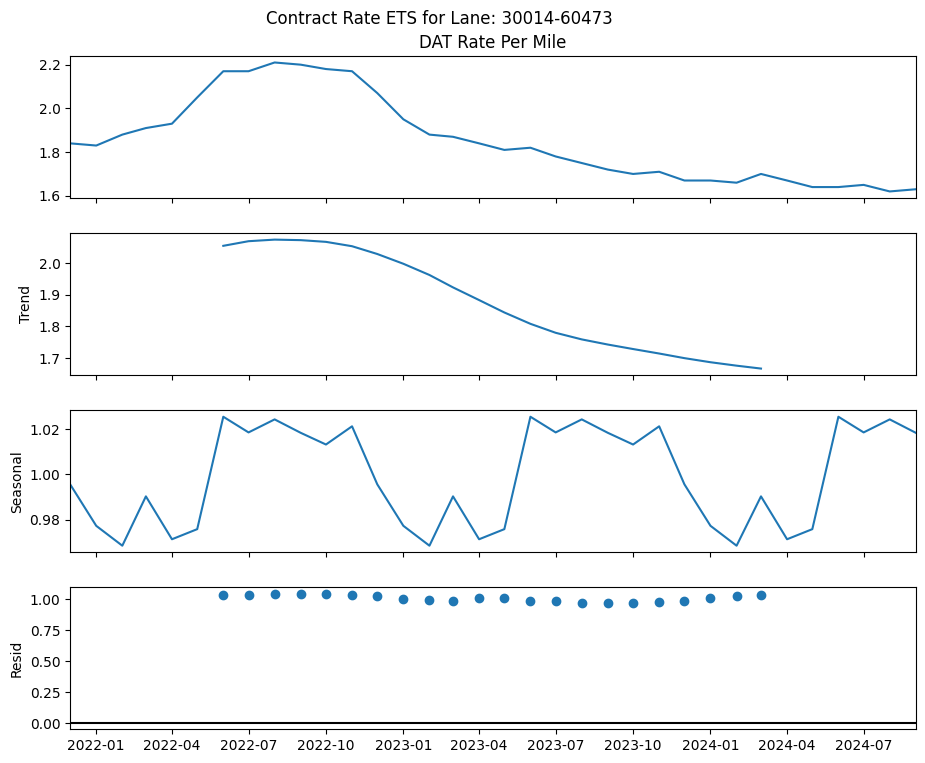

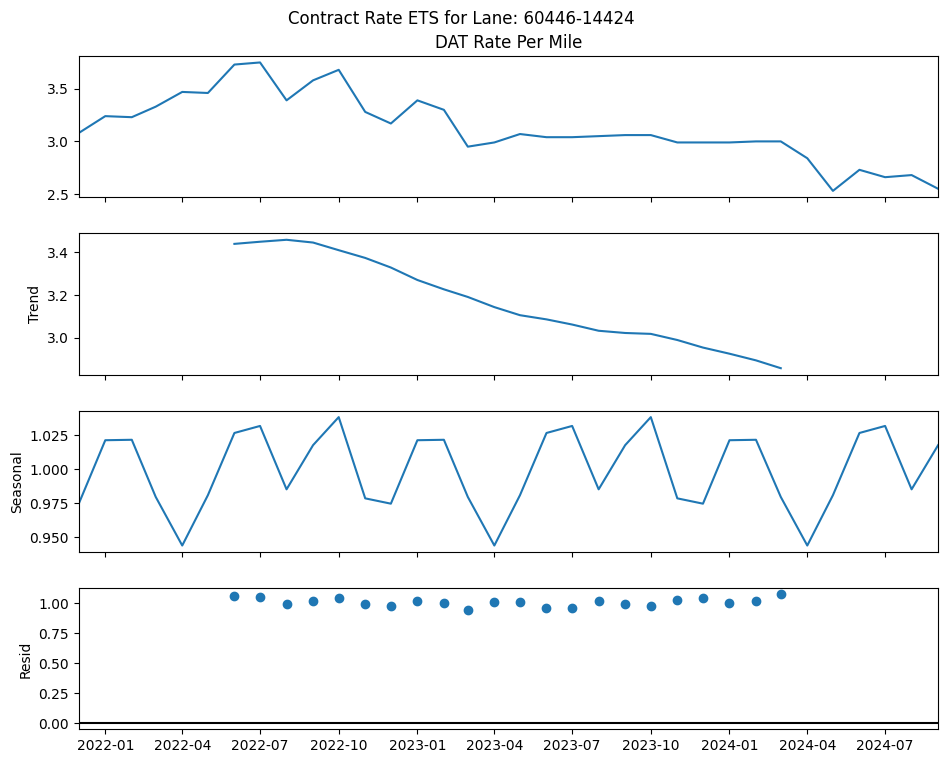

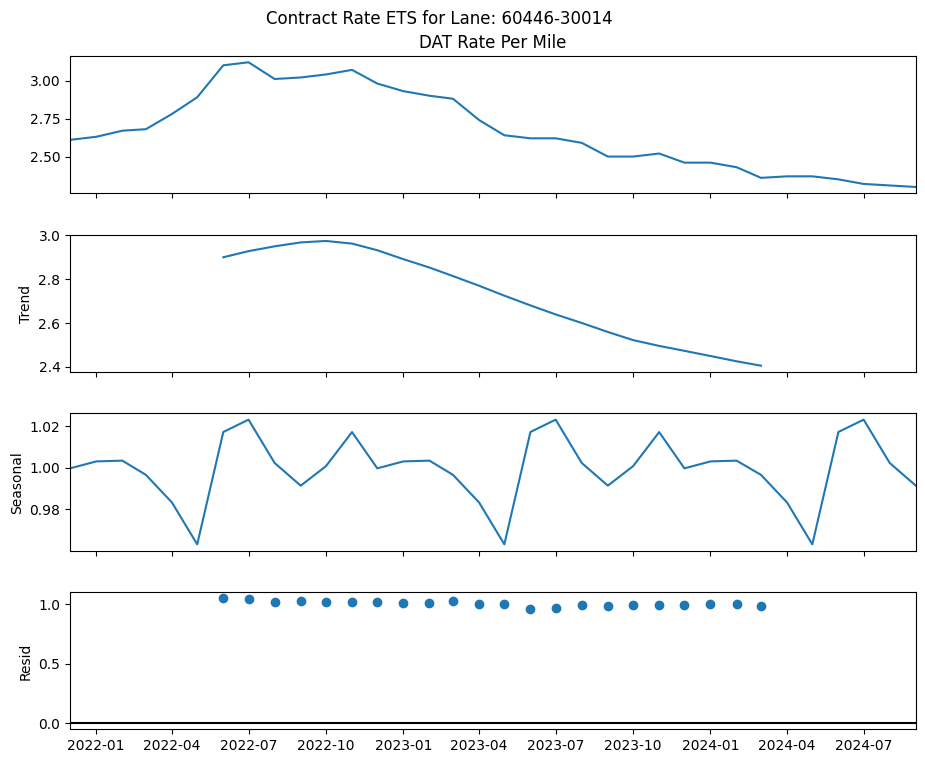

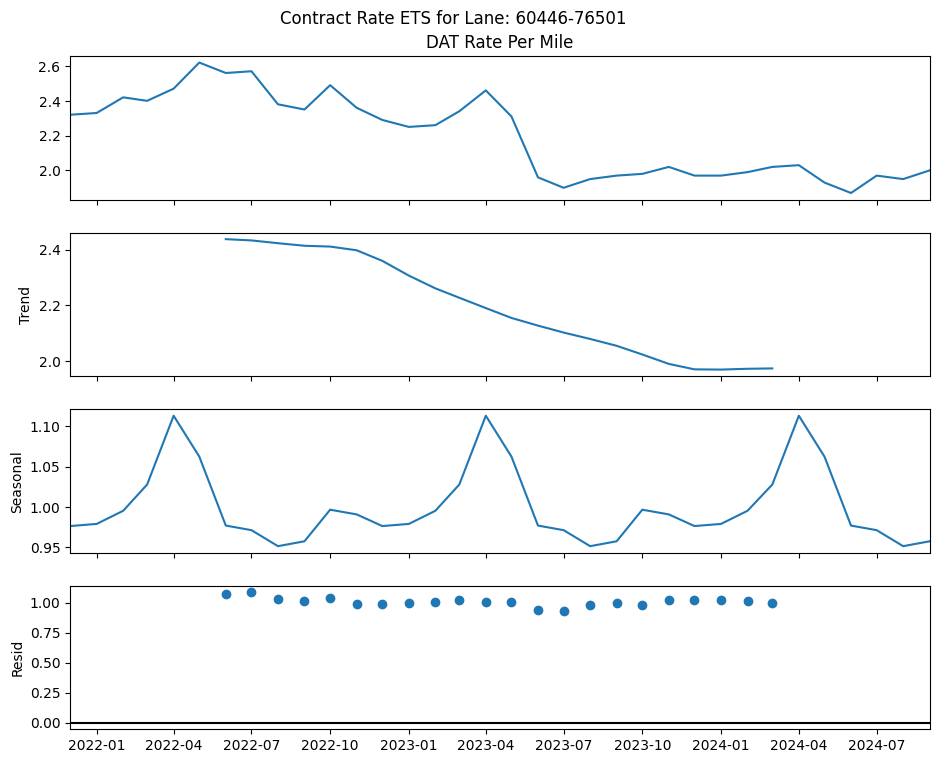

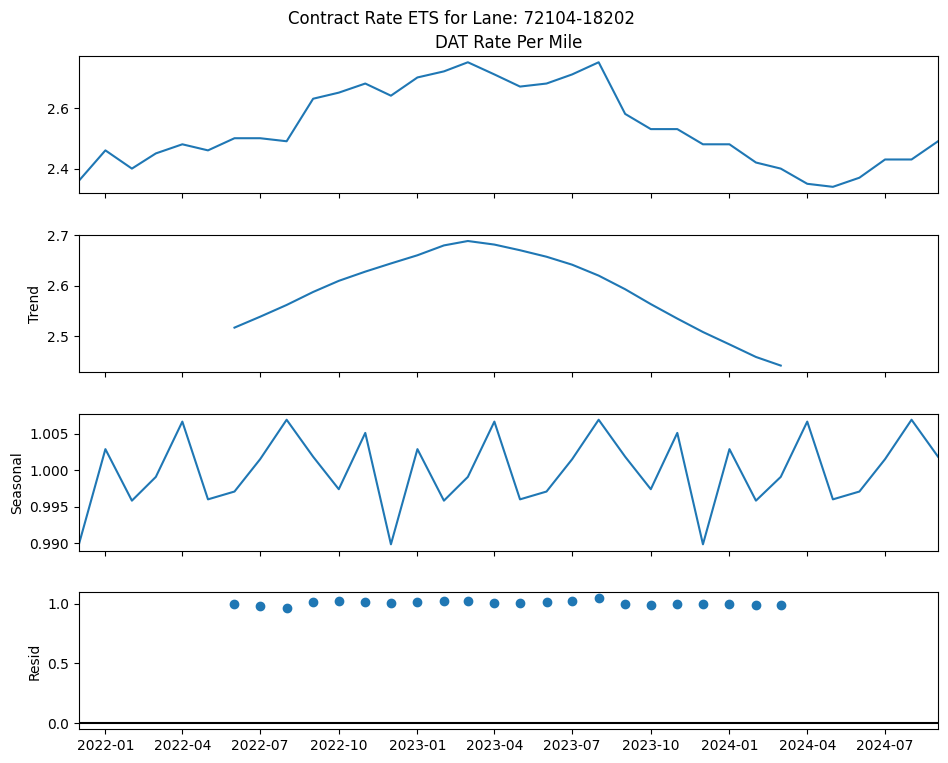

In [12]:
# Loop through each lane and create a separate plot
from statsmodels.tsa.seasonal import seasonal_decompose

import warnings

# Settings the warnings to be ignored
warnings.filterwarnings('ignore')

for lane_id in top_10_dfs.keys():
    # Filter data for the specific lane
    lane_data = top_10_lanes[top_10_lanes['Lane-ID'] == lane_id]

    lane_data['YearMonth'] = pd.to_datetime(lane_data['YearMonth'])

     # Set 'YearMonth' as index and infer frequency
    lane_data = lane_data.set_index('YearMonth').asfreq('MS') # Infer monthly frequency ('MS')


    result = seasonal_decompose(lane_data['DAT Rate Per Mile'], model ='multiplicative')

    # ETS plot
    #result.title = 'ETS Decomposition for Lane: ' + lane_id
    fig = result.plot()
    fig.suptitle('Contract Rate ETS for Lane: ' + lane_id)
    fig.set_size_inches(10, 8)


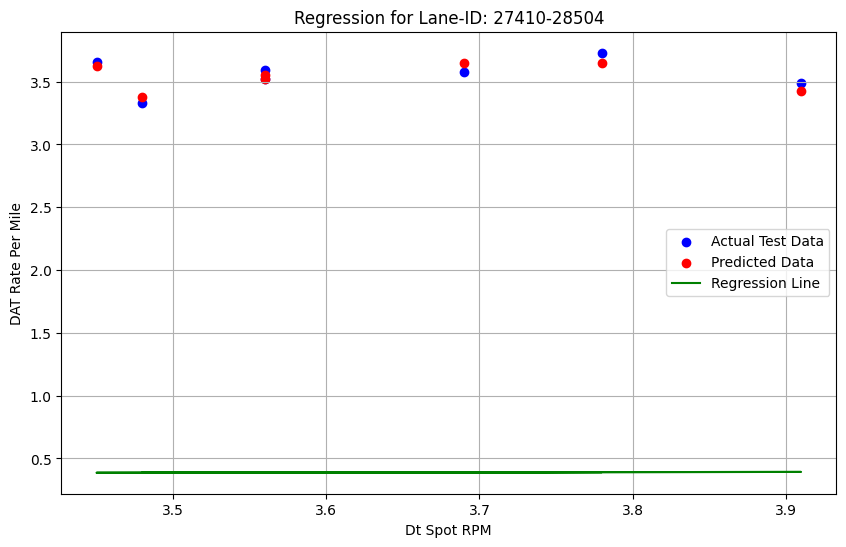

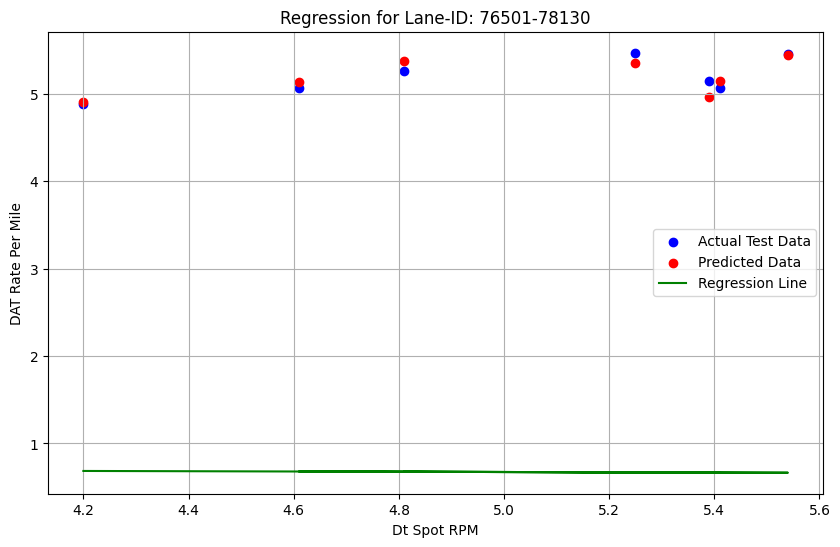

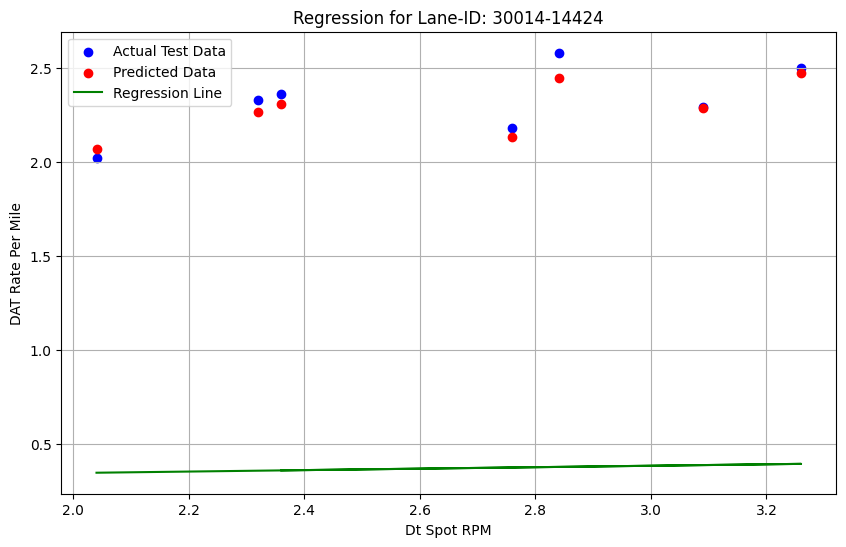

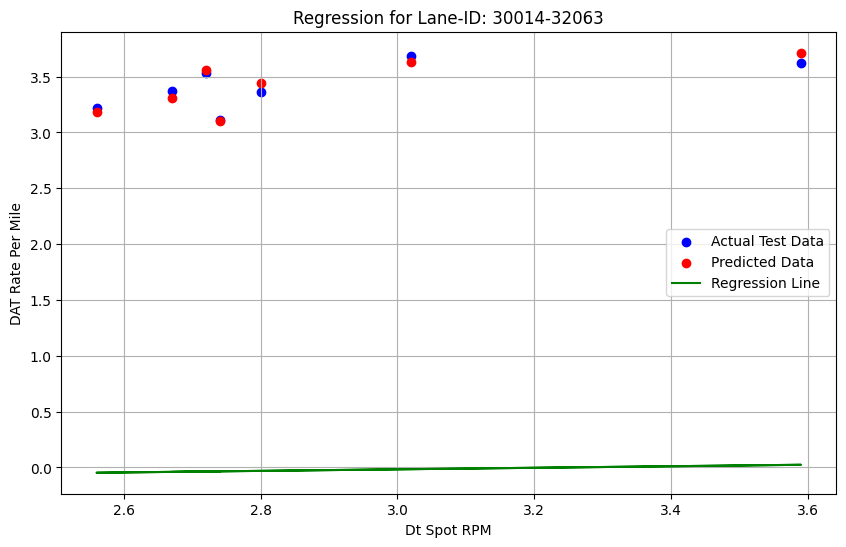

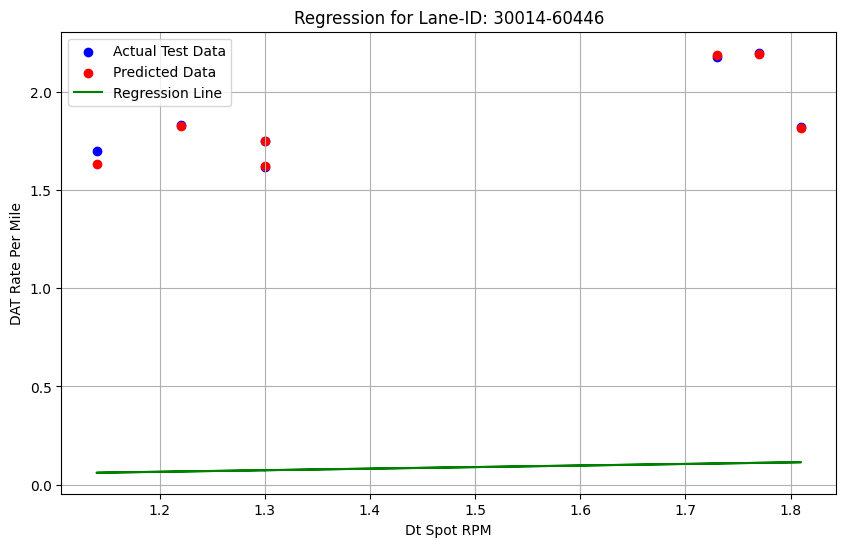

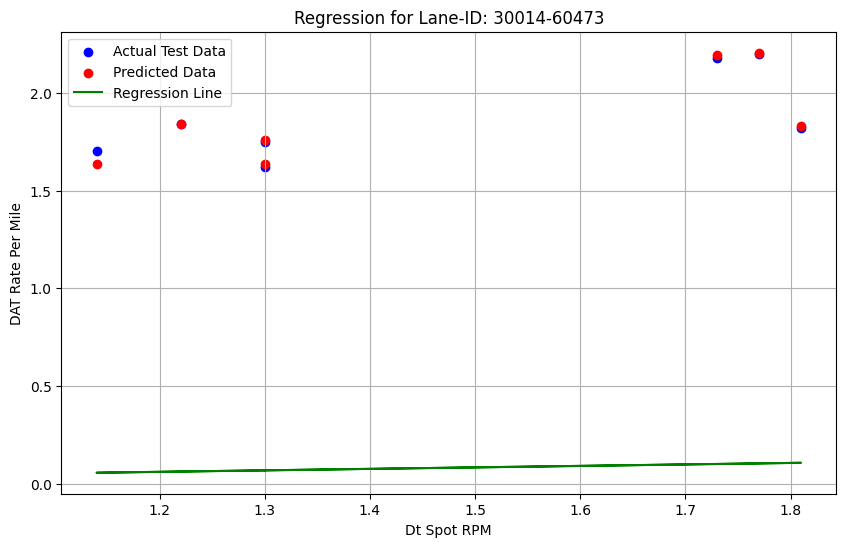

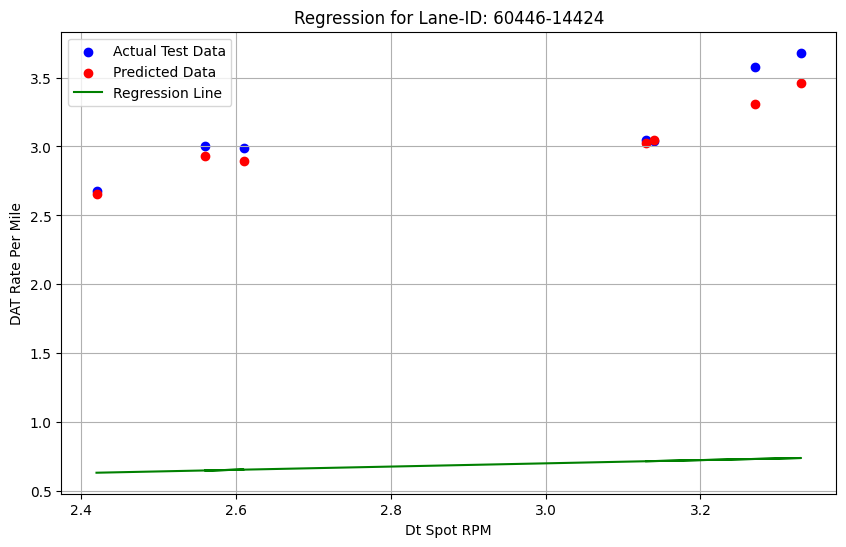

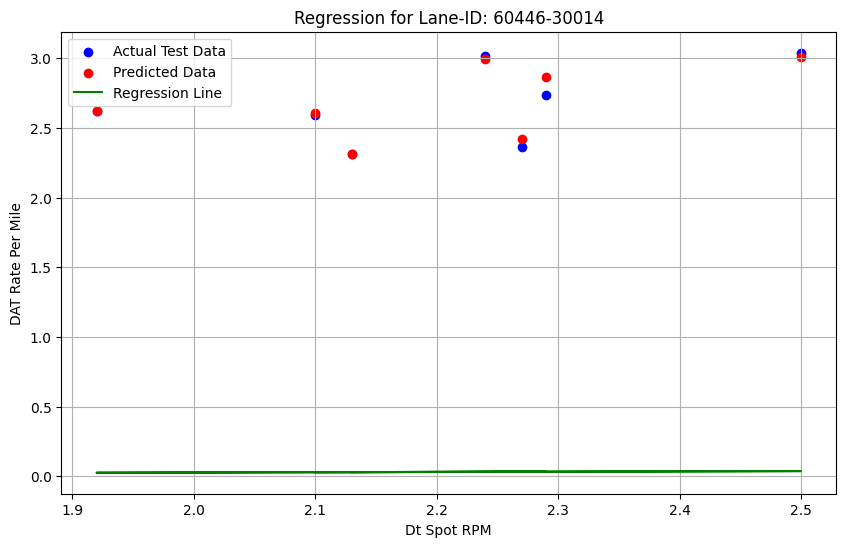

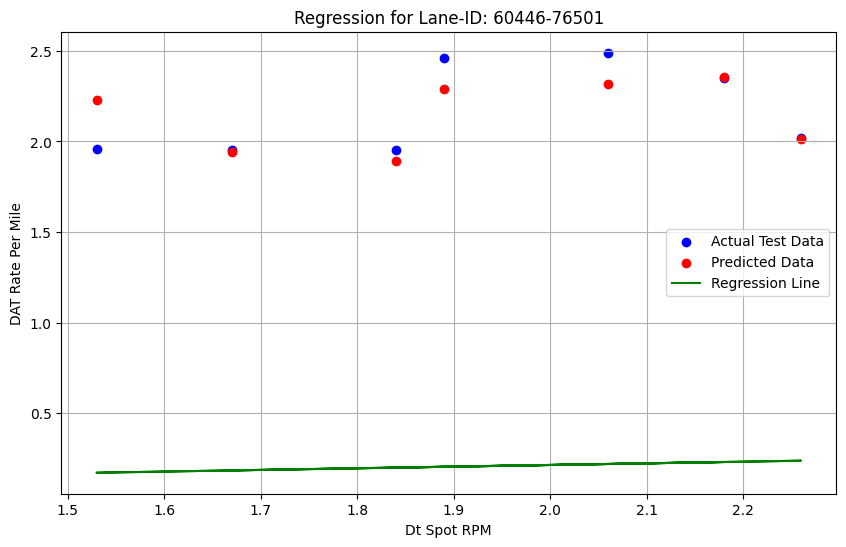

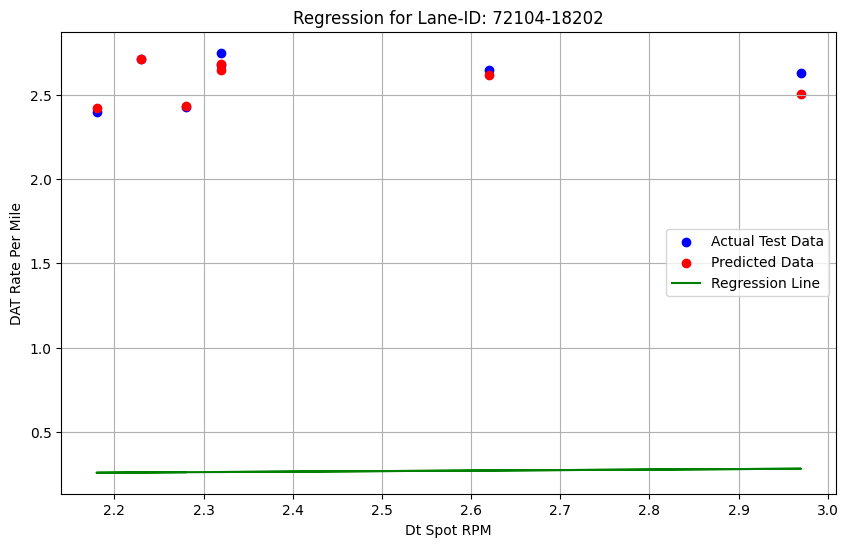

Regression Model Summary for Lane-ID: 27410-28504
  Coefficient for Spot Rate: 0.0139
  Coefficient for Lagged DAT Rate: 0.8895
  Intercept: 0.3383
  R² Score: 0.7488


Regression Model Summary for Lane-ID: 76501-78130
  Coefficient for Spot Rate: -0.0151
  Coefficient for Lagged DAT Rate: 0.8697
  Intercept: 0.7485
  R² Score: 0.7419


Regression Model Summary for Lane-ID: 30014-14424
  Coefficient for Spot Rate: 0.0386
  Coefficient for Lagged DAT Rate: 0.8280
  Intercept: 0.2685
  R² Score: 0.8558


Regression Model Summary for Lane-ID: 30014-32063
  Coefficient for Spot Rate: 0.0690
  Coefficient for Lagged DAT Rate: 1.0025
  Intercept: -0.2236
  R² Score: 0.9108


Regression Model Summary for Lane-ID: 30014-60446
  Coefficient for Spot Rate: 0.0798
  Coefficient for Lagged DAT Rate: 0.9464
  Intercept: -0.0306
  R² Score: 0.9845


Regression Model Summary for Lane-ID: 30014-60473
  Coefficient for Spot Rate: 0.0757
  Coefficient for Lagged DAT Rate: 0.9501
  Intercept: -0.0292
  R

In [13]:
import pandas as pd
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score
import matplotlib.pyplot as plt
from sklearn.impute import SimpleImputer
import warnings

warnings.filterwarnings('ignore')

# Dictionary to store regression model summaries for each Lane-ID
regression_summary_results = {}

# Loop through each of the top 10 DataFrames
for lane_id, df in top_10_dfs.items():
    # Ensure 'YearMonth' is a datetime type and sort by it
    df['YearMonth'] = pd.to_datetime(df['YearMonth'])
    df = df.sort_values('YearMonth').reset_index(drop=True)

    # Check if 'Dt Spot RPM' and 'DAT Rate Per Mile' columns exist and are not empty
    if not df['Dt Spot RPM'].isnull().all() and not df['DAT Rate Per Mile'].isnull().all():
        # Shift 'DAT Rate Per Mile' by 1 month to create the lag term
        df['DAT Rate Per Mile_Lag1'] = df['DAT Rate Per Mile'].shift(1)

        # Drop the first row with NaN after lagging
        df = df.dropna().reset_index(drop=True)

        # Prepare features and target for regression
        X = df[['Dt Spot RPM', 'DAT Rate Per Mile_Lag1']]
        y = df['DAT Rate Per Mile']

        # Handle missing values with mean imputation
        imputer = SimpleImputer(strategy='mean')
        X = imputer.fit_transform(X)

        # Train-test split for regression
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

        # Fit Linear Regression model
        reg_model = LinearRegression()
        reg_model.fit(X_train, y_train)

        # Predict using the model on test data
        y_pred = reg_model.predict(X_test)

        # Compute R² score
        r2 = r2_score(y_test, y_pred)

        # Visualization
        plt.figure(figsize=(10, 6))
        plt.scatter(X_test[:, 0], y_test, label='Actual Test Data', color='blue')
        plt.scatter(X_test[:, 0], y_pred, label='Predicted Data', color='red')
        plt.plot(X_test[:, 0], reg_model.coef_[0] * X_test[:, 0] + reg_model.intercept_, color='green', label='Regression Line')

        plt.xlabel('Dt Spot RPM')
        plt.ylabel('DAT Rate Per Mile')
        plt.title(f'Regression for Lane-ID: {lane_id}')
        plt.legend()
        plt.grid(True)
        plt.show()

        # Store model details
        regression_summary_results[lane_id] = {
            "Coefficient_Spot_Rate": reg_model.coef_[0],
            "Coefficient_Lagged_DAT_Rate": reg_model.coef_[1],
            "Intercept": reg_model.intercept_,
            "R² Score": r2
        }

# Print the regression model summary for each Lane-ID
for lane_id, summary in regression_summary_results.items():
    print(f"Regression Model Summary for Lane-ID: {lane_id}")
    print(f"  Coefficient for Spot Rate: {summary['Coefficient_Spot_Rate']:.4f}")
    print(f"  Coefficient for Lagged DAT Rate: {summary['Coefficient_Lagged_DAT_Rate']:.4f}")
    print(f"  Intercept: {summary['Intercept']:.4f}")
    print(f"  R² Score: {summary['R² Score']:.4f}")
    print("\n")


In [14]:
!pip install arch

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 985.1/985.1 kB 18.3 MB/s eta 0:00:00


Lane-ID: 27410-28504 - MSE: 1.7346


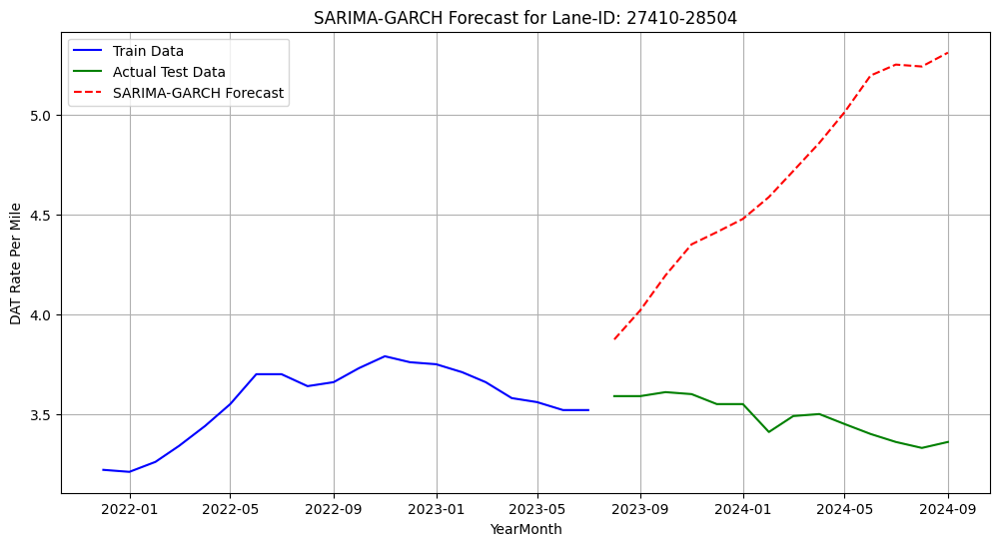

Lane-ID: 76501-78130 - MSE: 1.1801


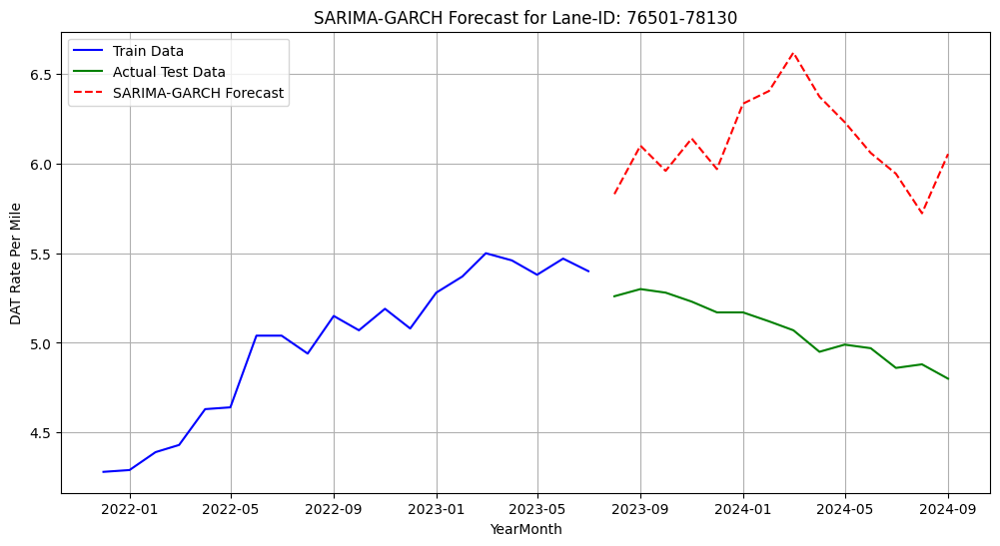

Lane-ID: 30014-14424 - MSE: 0.7029


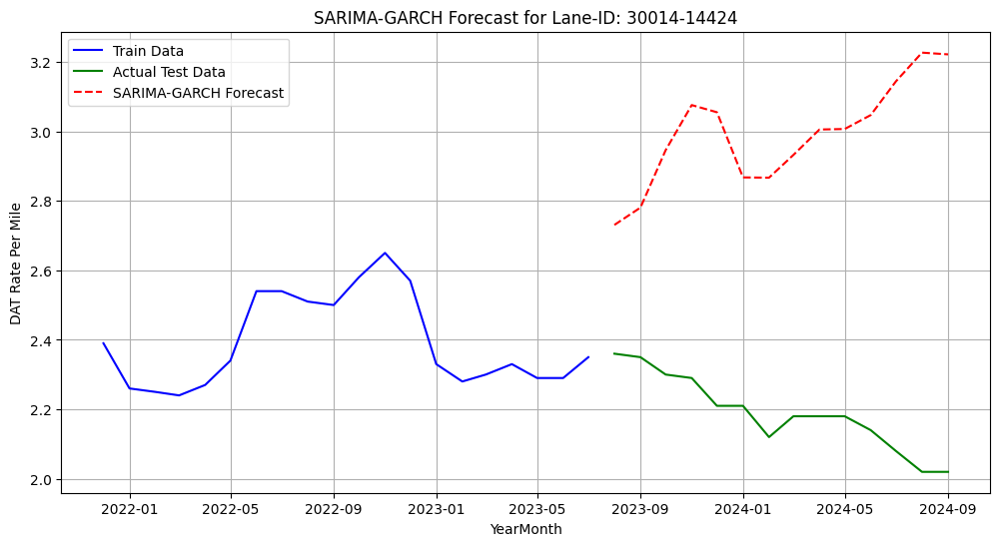

Lane-ID: 30014-32063 - MSE: 0.2013


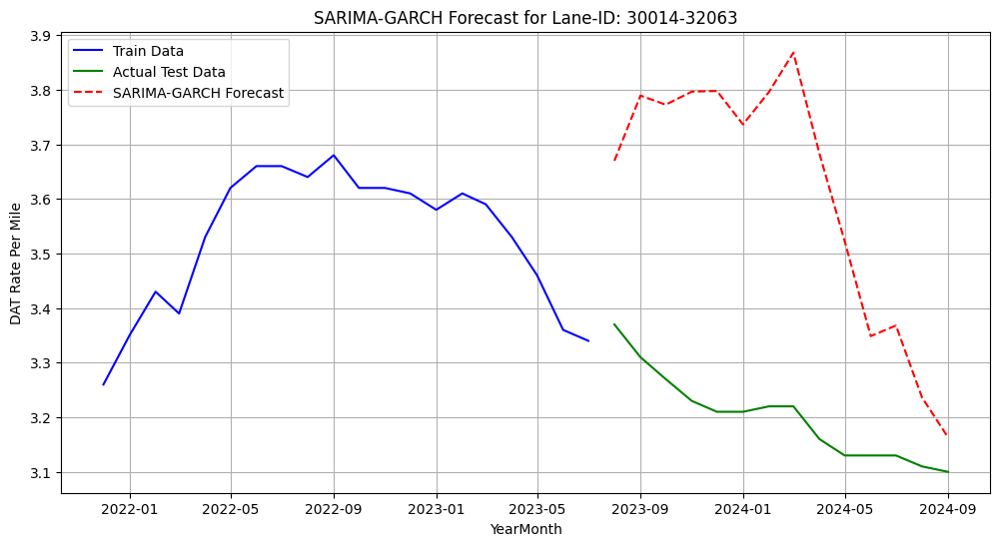

Lane-ID: 30014-60446 - MSE: 0.5713


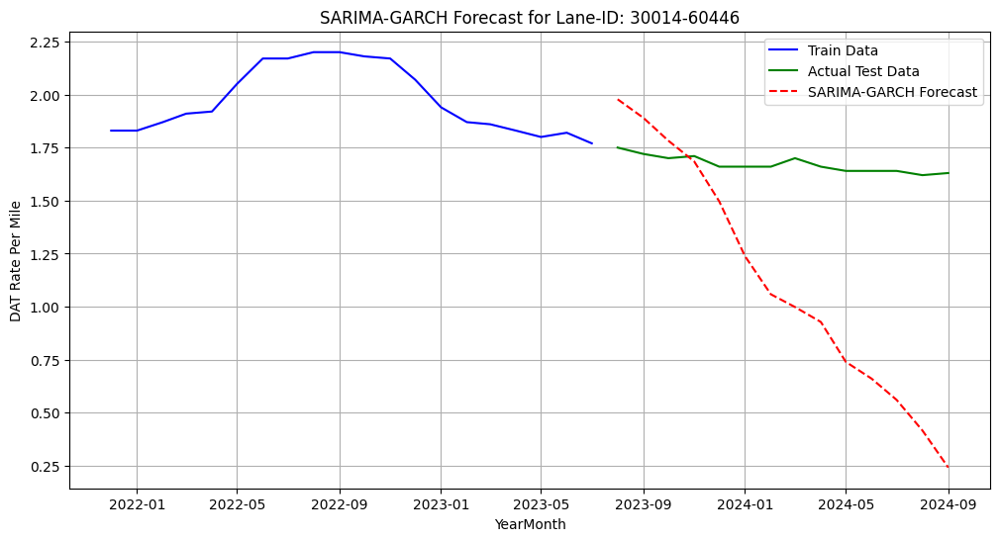

Lane-ID: 30014-60473 - MSE: 0.0375


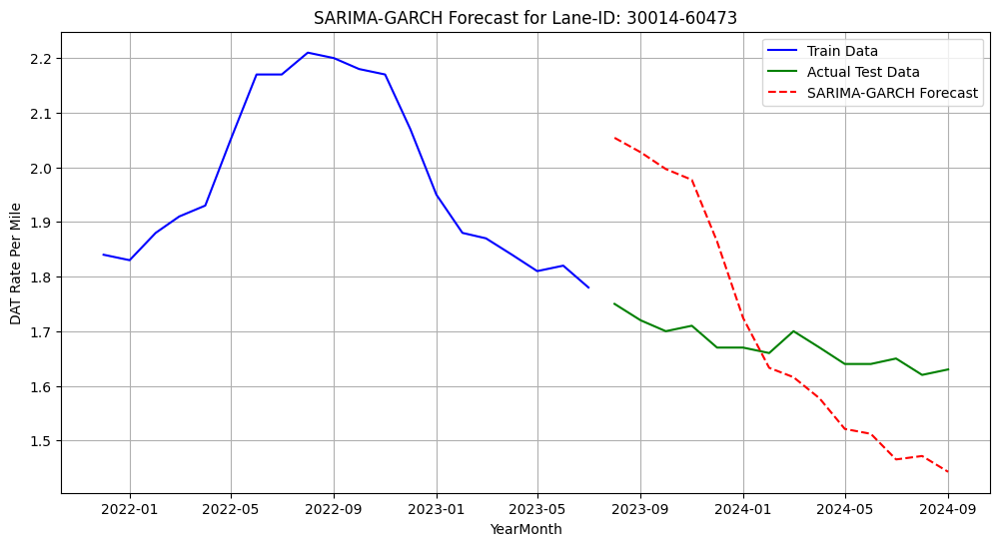

Lane-ID: 60446-14424 - MSE: 0.0665


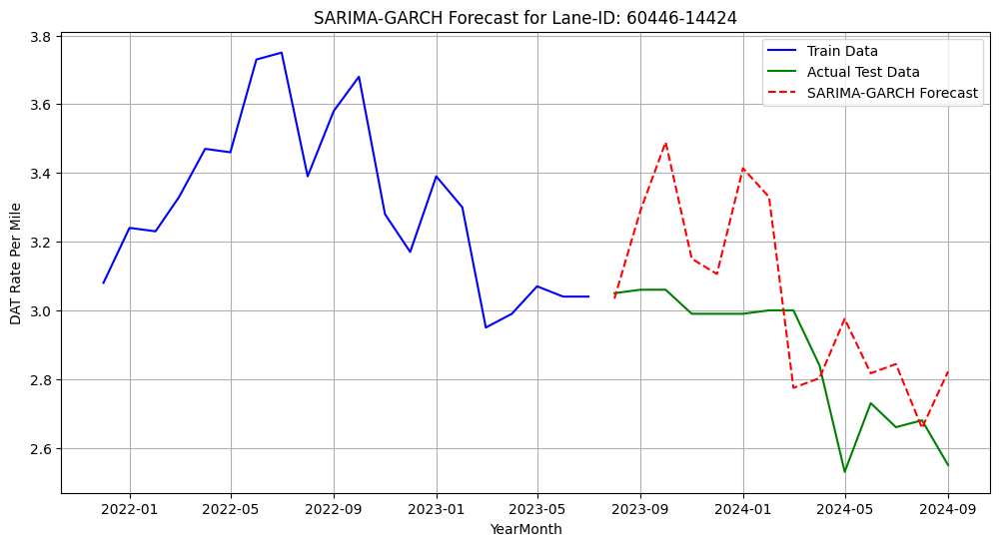

Lane-ID: 60446-30014 - MSE: 0.0549


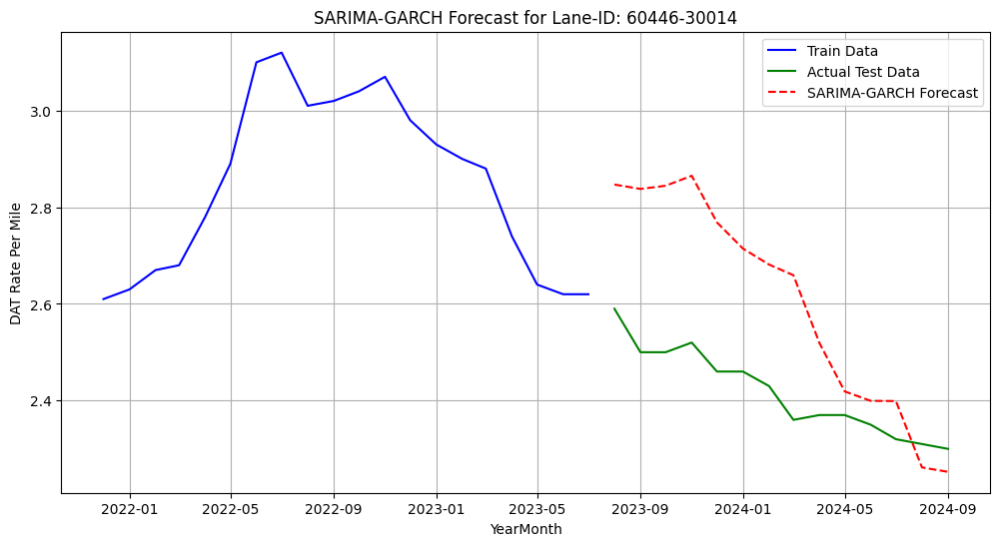

Lane-ID: 60446-76501 - MSE: 0.0808


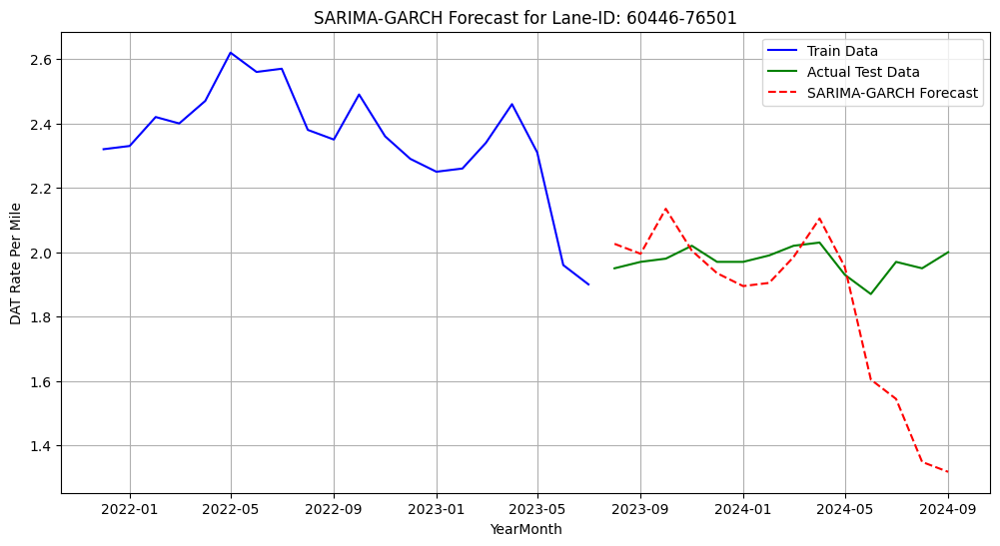

Lane-ID: 72104-18202 - MSE: 1.6668


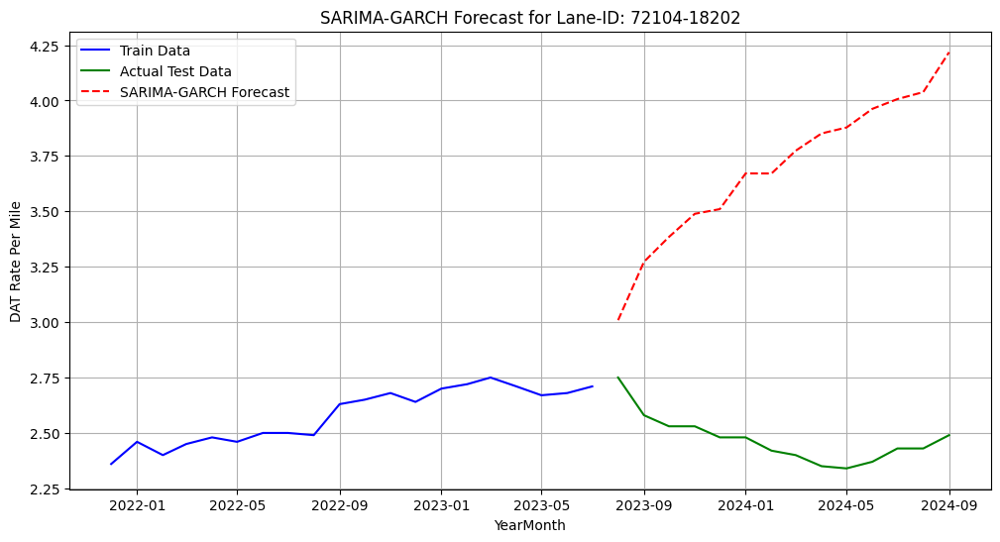

In [15]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.statespace.sarimax import SARIMAX
from arch import arch_model
from sklearn.metrics import mean_squared_error

# Function to fit SARIMA-GARCH model
def fit_sarima_garch(df, lane_id):
    # Ensure 'YearMonth' is datetime and sort by it
    df['YearMonth'] = pd.to_datetime(df['YearMonth'])
    df = df.sort_values('YearMonth').reset_index(drop=True)

    # Split data into train (60%) and test (40%)
    train_size = int(len(df) * 0.6)
    train, test = df.iloc[:train_size], df.iloc[train_size:]

    # Extract the 'DAT Rate Per Mile' series
    train_data = train['DAT Rate Per Mile']
    test_data = test['DAT Rate Per Mile']

    # Step 1: Fit SARIMA model
    sarima_model = SARIMAX(train_data, order=(1, 1, 1), seasonal_order=(1, 1, 1, 12))
    sarima_result = sarima_model.fit(disp=False)

    # Step 2: Get SARIMA residuals
    residuals = sarima_result.resid

    # Step 3: Fit GARCH model to residuals
    garch_model = arch_model(residuals, vol='Garch', p=1, q=1)
    garch_result = garch_model.fit(disp='off')

    # Step 4: Forecast using SARIMA
    sarima_forecast = sarima_result.forecast(steps=len(test_data))

    # Step 5: Forecast GARCH volatility
    garch_forecast = garch_result.forecast(horizon=len(test_data))
    garch_volatility = np.sqrt(garch_forecast.variance.values[-1])

    # Combine SARIMA forecast with GARCH volatility
    combined_forecast = sarima_forecast + garch_volatility

    # Calculate and print MSE
    mse = mean_squared_error(test_data, combined_forecast)
    print(f"Lane-ID: {lane_id} - MSE: {mse:.4f}")

    # Plot results
    plt.figure(figsize=(12, 6))
    plt.plot(train['YearMonth'], train_data, label='Train Data', color='blue')
    plt.plot(test['YearMonth'], test_data, label='Actual Test Data', color='green')
    plt.plot(test['YearMonth'], combined_forecast, label='SARIMA-GARCH Forecast', color='red', linestyle='--')

    plt.xlabel('YearMonth')
    plt.ylabel('DAT Rate Per Mile')
    plt.title(f'SARIMA-GARCH Forecast for Lane-ID: {lane_id}')
    plt.legend()
    plt.grid(True)
    plt.show()

# Loop through each DataFrame in the top_10_dfs dictionary
for lane_id, df in top_10_dfs.items():
    fit_sarima_garch(df, lane_id)


In [17]:
!pip install pmdarima

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 26.0 MB/s eta 0:00:00


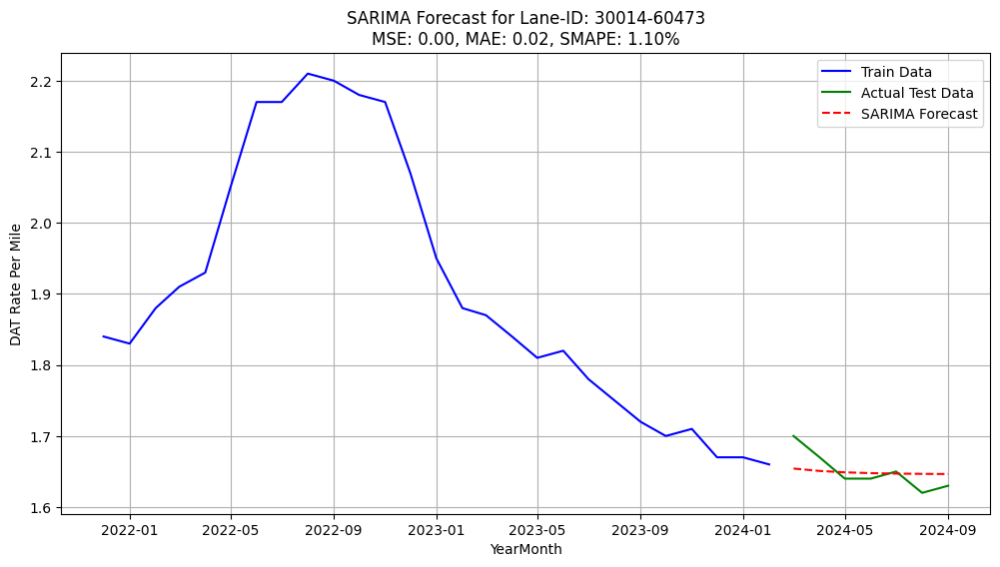

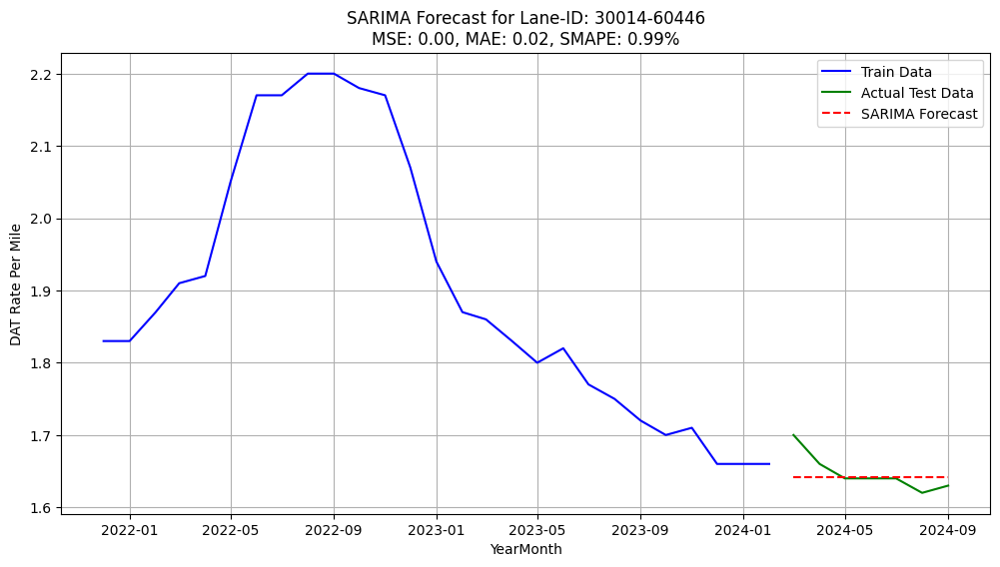

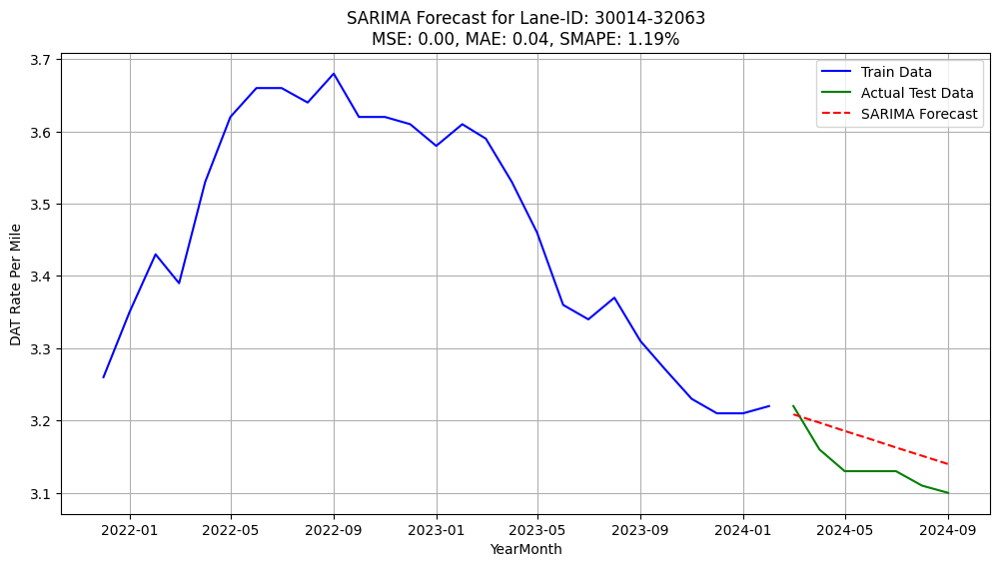

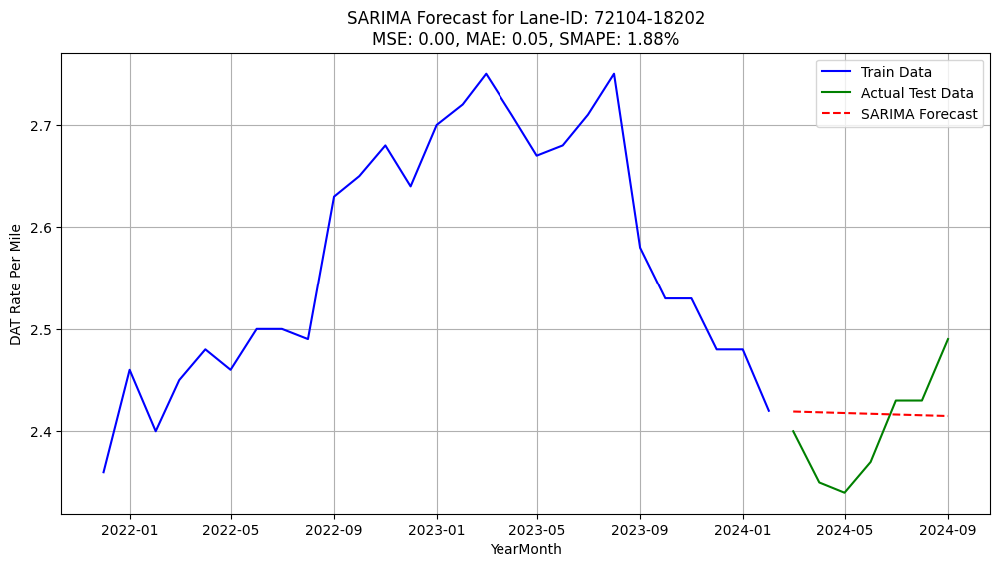

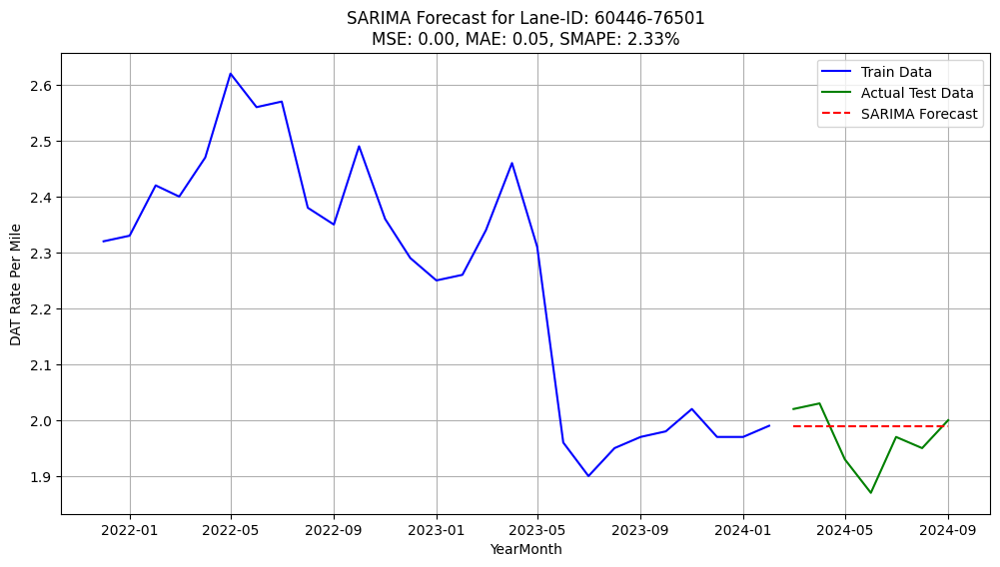

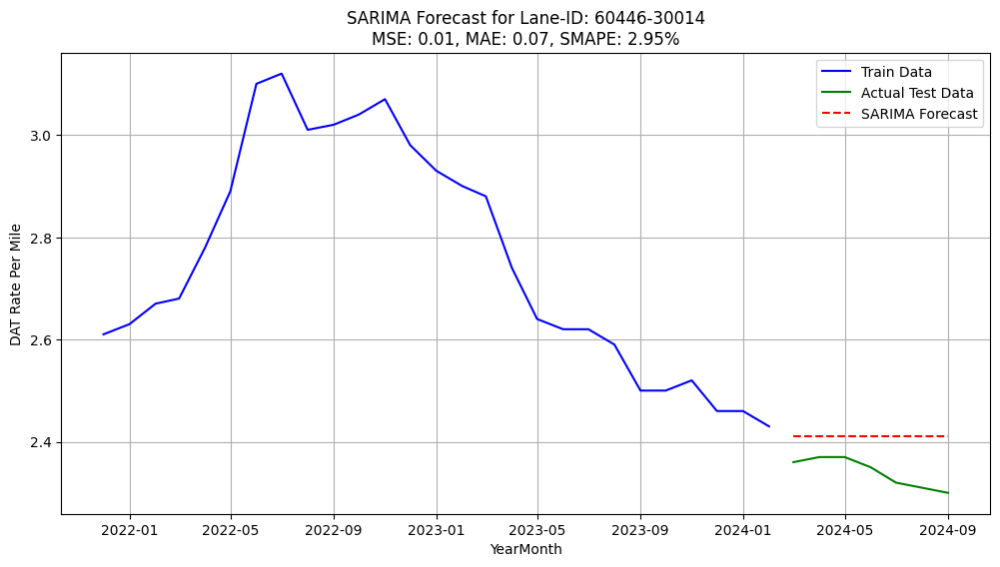

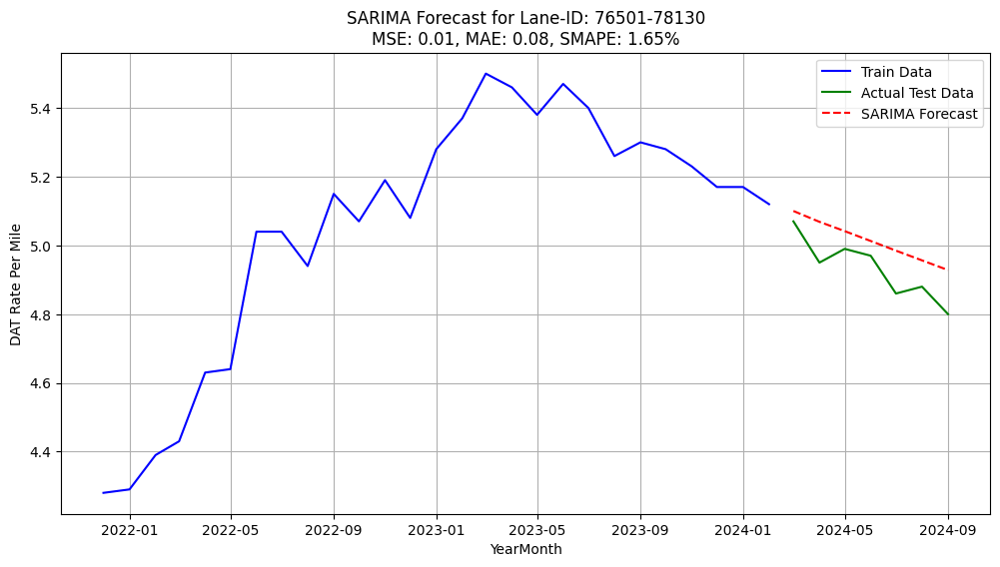

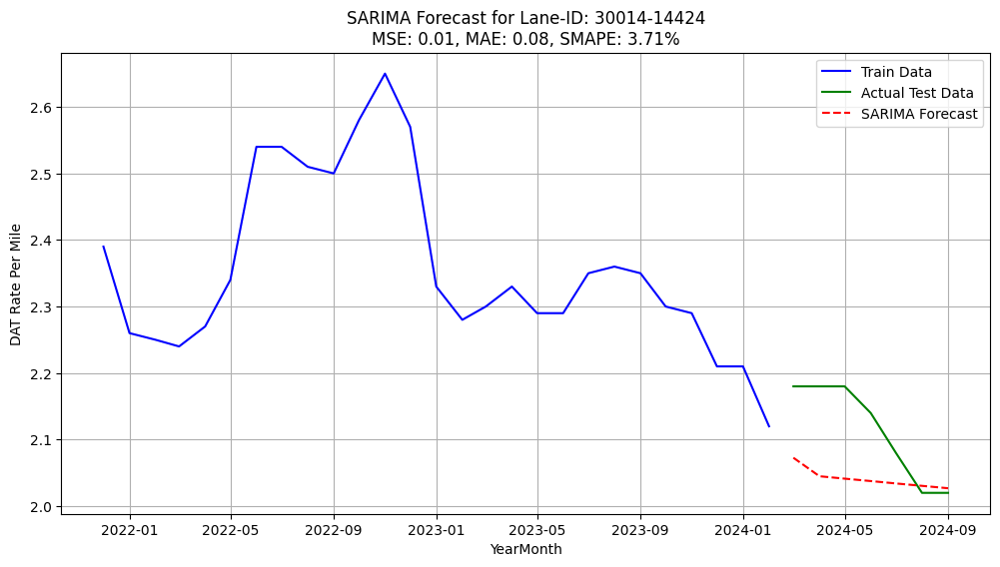

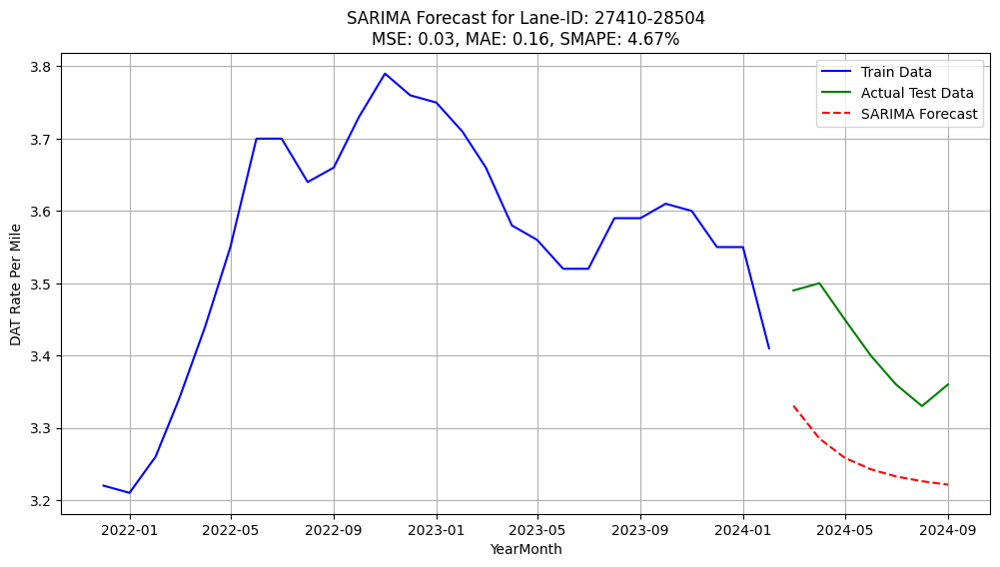

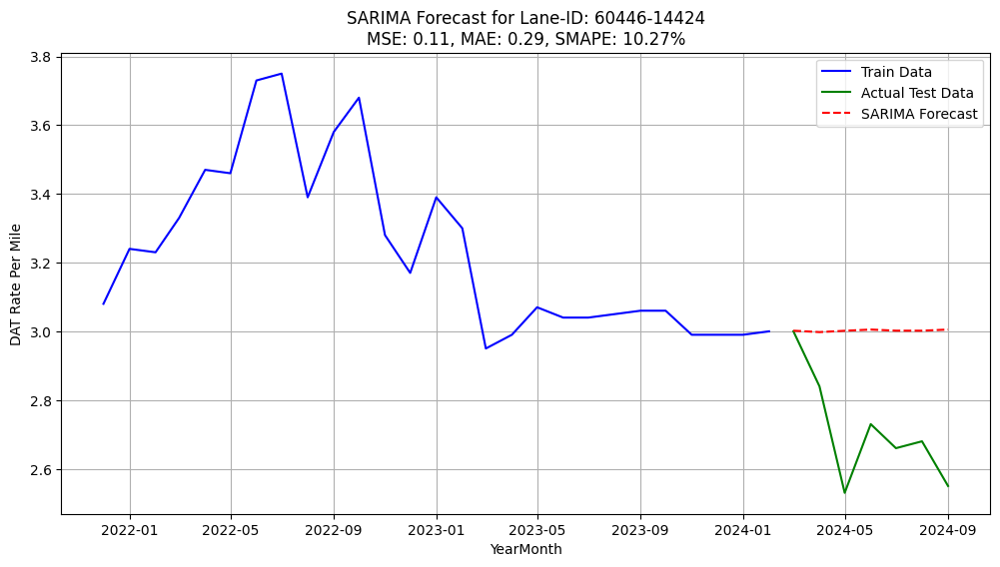

Top 10 Lanes with Lowest MSE:
1. Lane-ID: 30014-60473 - MSE: 0.00, MAE: 0.02, SMAPE: 1.10%
2. Lane-ID: 30014-60446 - MSE: 0.00, MAE: 0.02, SMAPE: 0.99%
3. Lane-ID: 30014-32063 - MSE: 0.00, MAE: 0.04, SMAPE: 1.19%
4. Lane-ID: 72104-18202 - MSE: 0.00, MAE: 0.05, SMAPE: 1.88%
5. Lane-ID: 60446-76501 - MSE: 0.00, MAE: 0.05, SMAPE: 2.33%
6. Lane-ID: 60446-30014 - MSE: 0.01, MAE: 0.07, SMAPE: 2.95%
7. Lane-ID: 76501-78130 - MSE: 0.01, MAE: 0.08, SMAPE: 1.65%
8. Lane-ID: 30014-14424 - MSE: 0.01, MAE: 0.08, SMAPE: 3.71%
9. Lane-ID: 27410-28504 - MSE: 0.03, MAE: 0.16, SMAPE: 4.67%
10. Lane-ID: 60446-14424 - MSE: 0.11, MAE: 0.29, SMAPE: 10.27%


In [18]:
from sklearn.metrics import mean_squared_error, mean_absolute_error
from pmdarima.arima import auto_arima
import numpy as np
# Function to calculate SMAPE
def smape(actual, forecast):
    return 100 * np.mean(2 * np.abs(forecast - actual) / (np.abs(actual) + np.abs(forecast)))

# Define function to fine-tune SARIMA, calculate errors, and return results
def fine_tune_sarima(df, lane_id):
    # Ensure the 'YearMonth' column is a datetime type and sort by it
    df['YearMonth'] = pd.to_datetime(df['YearMonth'])
    df = df.sort_values('YearMonth').reset_index(drop=True)

    # Drop rows with missing values in 'DAT Rate Per Mile'
    df = df.dropna(subset=['DAT Rate Per Mile'])

    # Check if there are enough data points
    if len(df) < 15:
        print(f"Skipping Lane-ID {lane_id}: Not enough data points ({len(df)})")
        return None

    # Split data into train (80%) and test (20%)
    train_size = int(len(df) * 0.8)
    train, test = df.iloc[:train_size], df.iloc[train_size:]

    # Check if the train or test data is empty
    if len(train) == 0 or len(test) == 0:
        print(f"Skipping Lane-ID {lane_id}: Train or test set is empty")
        return None

    # Extract 'DAT Rate Per Mile' for modeling
    train_data = train['DAT Rate Per Mile']
    test_data = test['DAT Rate Per Mile']

    # Fine-tune SARIMA using auto_arima
    try:
        model_auto = auto_arima(
            train_data,
            seasonal=True,
            m=1,  # Monthly seasonality
            stepwise=True,
            suppress_warnings=True,
            error_action='ignore'
        )

        # Get the optimal order and seasonal order
        order = model_auto.order
        seasonal_order = model_auto.seasonal_order

        # Fit the SARIMA model using the optimal parameters
        sarima_model = SARIMAX(train_data, order=order, seasonal_order=seasonal_order)
        sarima_result = sarima_model.fit(disp=False)

        # Forecast for the test period
        forecast = sarima_result.forecast(steps=len(test_data))

        # Calculate error metrics
        mse = mean_squared_error(test_data, forecast)
        mae = mean_absolute_error(test_data, forecast)
        smape_value = smape(test_data.values, forecast.values)

        return {
            'lane_id': lane_id,
            'mse': mse,
            'mae': mae,
            'smape': smape_value,
            'train': train,
            'test': test,
            'forecast': forecast
        }

    except Exception as e:
        print(f"Error fitting SARIMA for Lane-ID {lane_id}: {e}")
        return None

# Store results for each Lane-ID
results = []

# Loop through each Lane-ID in the top_10_dfs dictionary
for lane_id, df in top_10_dfs.items():
    result = fine_tune_sarima(df, lane_id)
    if result:
        results.append(result)

# Sort results by MSE in ascending order
results = sorted(results, key=lambda x: x['mse'])

# Select the top 10 lanes with the lowest errors
top_10_results = results[:10]

# Plot the results for the top 10 lanes
for res in top_10_results:
    lane_id = res['lane_id']
    train = res['train']
    test = res['test']
    forecast = res['forecast']

    plt.figure(figsize=(12, 6))
    plt.plot(train['YearMonth'], train['DAT Rate Per Mile'], label='Train Data', color='blue')
    plt.plot(test['YearMonth'], test['DAT Rate Per Mile'], label='Actual Test Data', color='green')
    plt.plot(test['YearMonth'], forecast, label='SARIMA Forecast', color='red', linestyle='--')

    plt.xlabel('YearMonth')
    plt.ylabel('DAT Rate Per Mile')
    plt.title(f'SARIMA Forecast for Lane-ID: {lane_id}\nMSE: {res["mse"]:.2f}, MAE: {res["mae"]:.2f}, SMAPE: {res["smape"]:.2f}%')
    plt.legend()
    plt.grid(True)
    plt.show()

# Print the top 10 lanes with their error metrics
print("Top 10 Lanes with Lowest MSE:")
for i, res in enumerate(top_10_results):
    print(f"{i+1}. Lane-ID: {res['lane_id']} - MSE: {res['mse']:.2f}, MAE: {res['mae']:.2f}, SMAPE: {res['smape']:.2f}%")


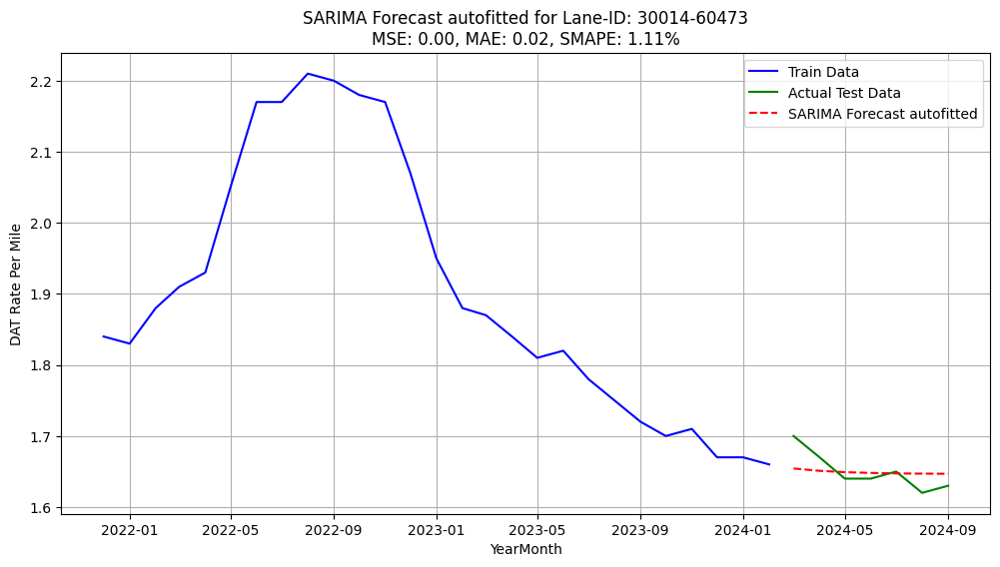

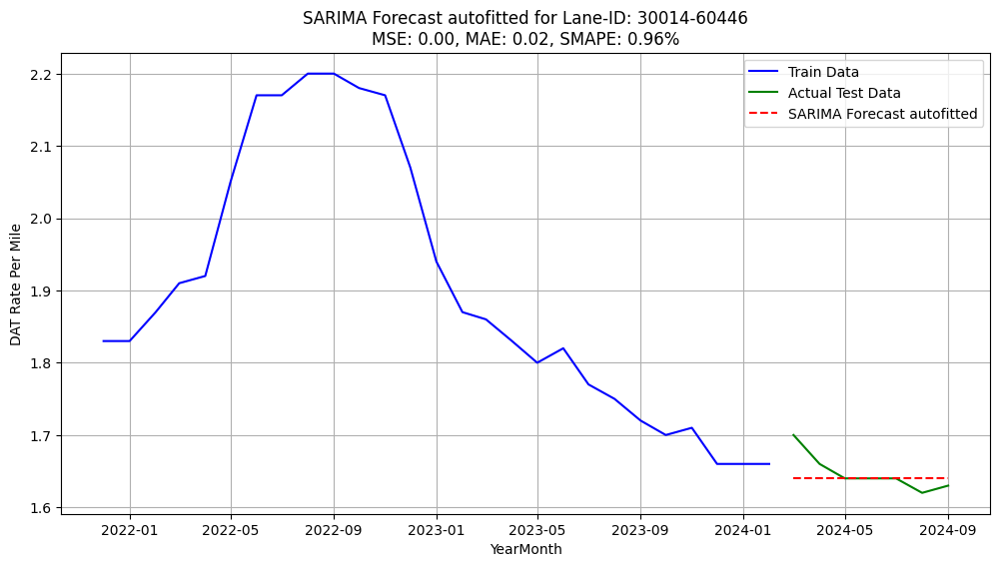

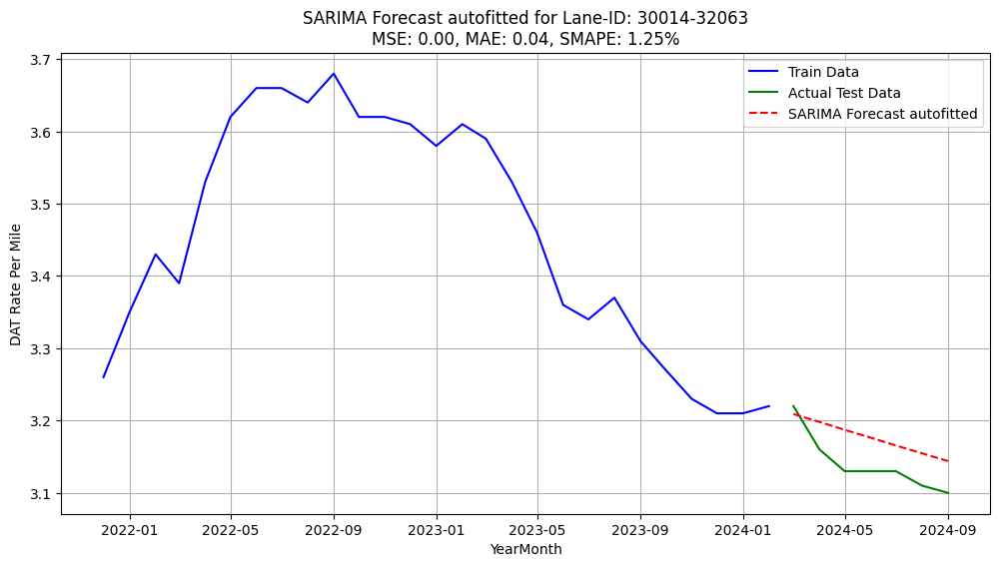

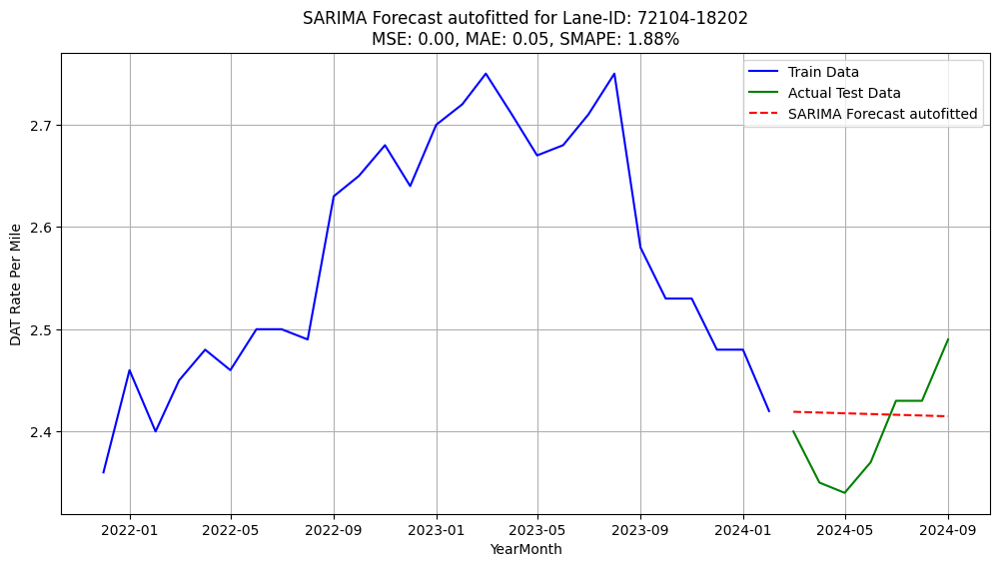

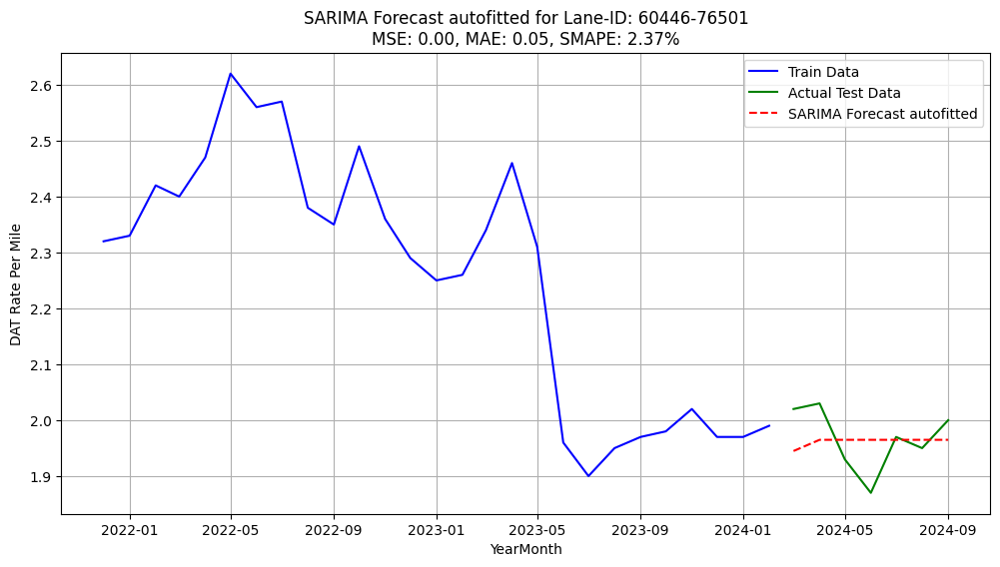

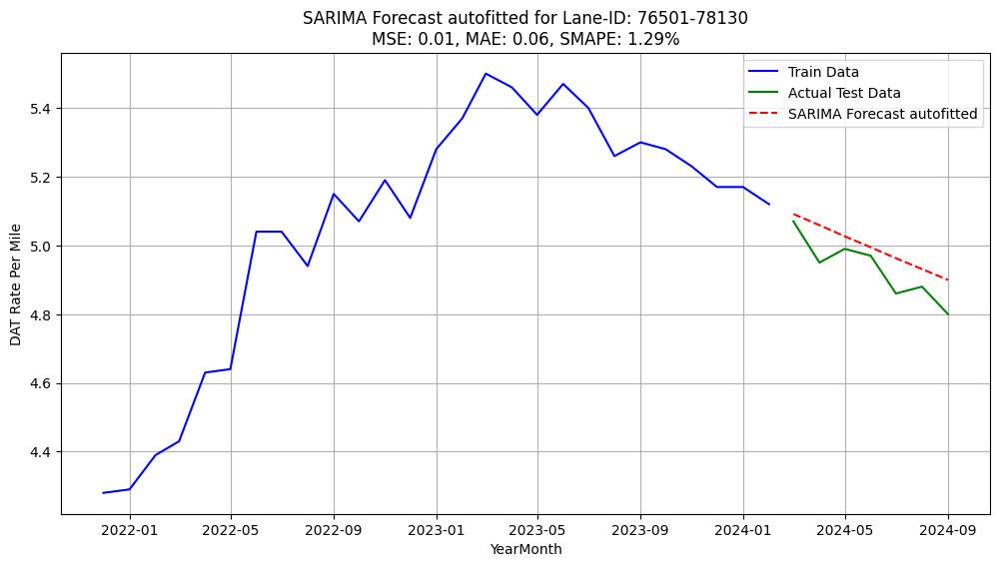

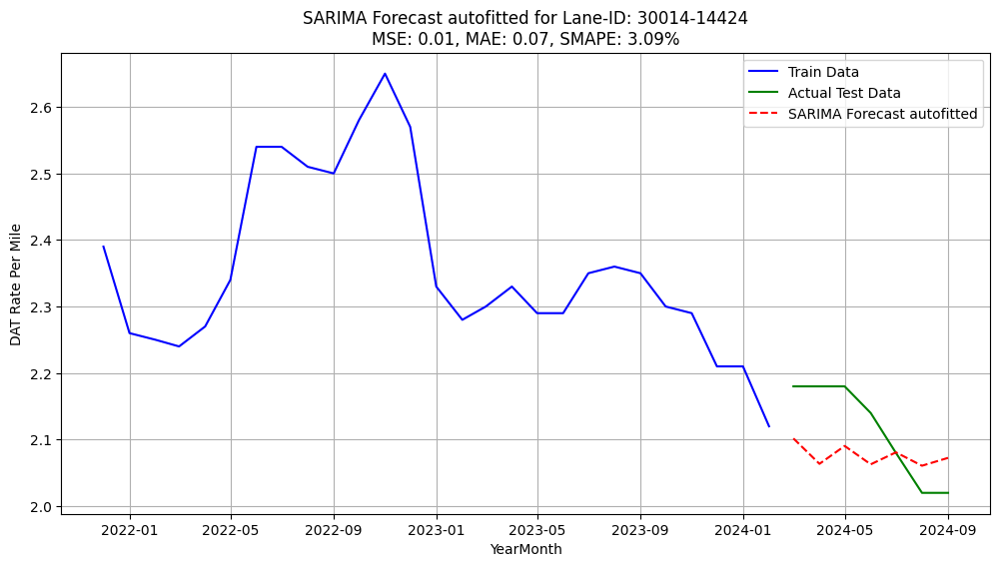

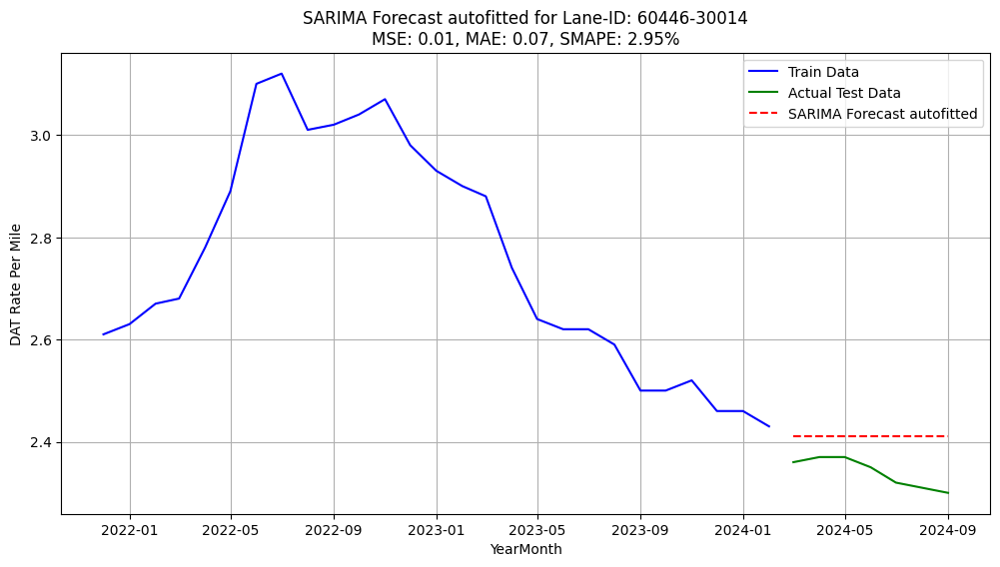

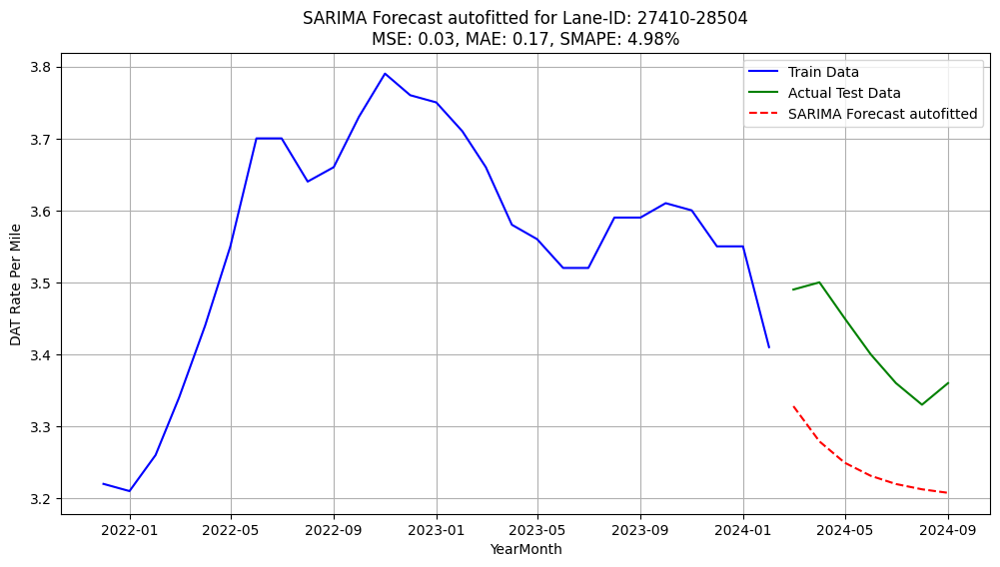

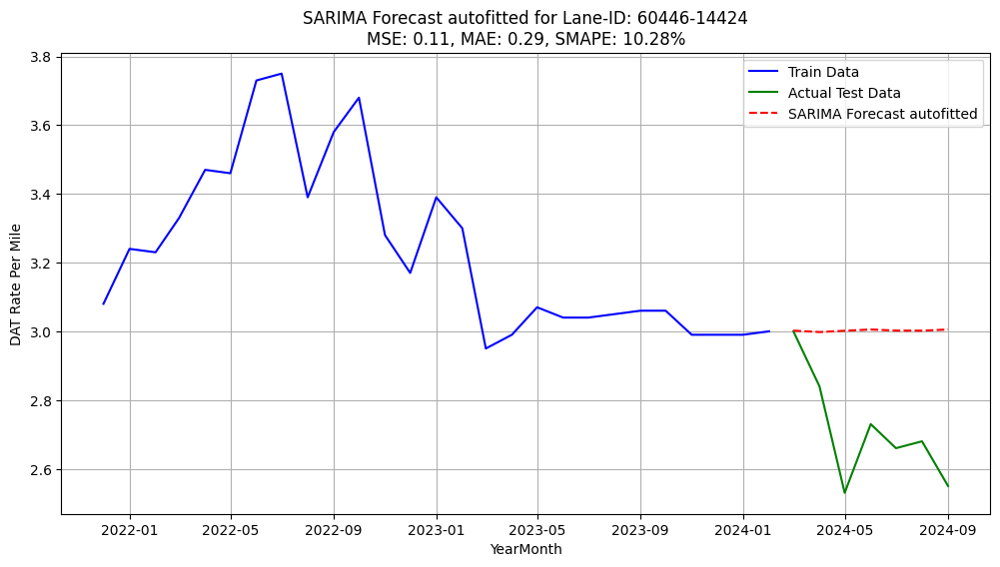

Top 10 Lanes with Lowest MSE:
1. Lane-ID: 30014-60473 - MSE: 0.00, MAE: 0.02, SMAPE: 1.11%
2. Lane-ID: 30014-60446 - MSE: 0.00, MAE: 0.02, SMAPE: 0.96%
3. Lane-ID: 30014-32063 - MSE: 0.00, MAE: 0.04, SMAPE: 1.25%
4. Lane-ID: 72104-18202 - MSE: 0.00, MAE: 0.05, SMAPE: 1.88%
5. Lane-ID: 60446-76501 - MSE: 0.00, MAE: 0.05, SMAPE: 2.37%
6. Lane-ID: 76501-78130 - MSE: 0.01, MAE: 0.06, SMAPE: 1.29%
7. Lane-ID: 30014-14424 - MSE: 0.01, MAE: 0.07, SMAPE: 3.09%
8. Lane-ID: 60446-30014 - MSE: 0.01, MAE: 0.07, SMAPE: 2.95%
9. Lane-ID: 27410-28504 - MSE: 0.03, MAE: 0.17, SMAPE: 4.98%
10. Lane-ID: 60446-14424 - MSE: 0.11, MAE: 0.29, SMAPE: 10.28%


In [19]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from pmdarima.arima import auto_arima
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.metrics import mean_squared_error, mean_absolute_error

# Function to calculate SMAPE
def smape(actual, forecast):
    return 100 * np.mean(2 * np.abs(forecast - actual) / (np.abs(actual) + np.abs(forecast)))

# Define function to fine-tune SARIMA, calculate errors, and return results
def fine_tune_sarima(df, lane_id):
    # Ensure the 'YearMonth' column is a datetime type and sort by it
    df['YearMonth'] = pd.to_datetime(df['YearMonth'])
    df = df.sort_values('YearMonth').reset_index(drop=True)

    # Drop rows with missing values in 'DAT Rate Per Mile'
    df = df.dropna(subset=['DAT Rate Per Mile'])

    # Check if there are enough data points
    if len(df) < 15:
        print(f"Skipping Lane-ID {lane_id}: Not enough data points ({len(df)})")
        return None

    # Ensure 'DAT Rate Per Mile' is strictly positive for log transformation
    if (df['DAT Rate Per Mile'] <= 0).any():
        print(f"Skipping Lane-ID {lane_id}: Data contains non-positive values")
        return None

    # Log-transform the 'DAT Rate Per Mile'
    df['Log_DAT_Rate'] = np.log(df['DAT Rate Per Mile'])

    # Split data into train (80%) and test (20%)
    train_size = int(len(df) * 0.8)
    train, test = df.iloc[:train_size], df.iloc[train_size:]

    # Check if the train or test data is empty
    if len(train) == 0 or len(test) == 0:
        print(f"Skipping Lane-ID {lane_id}: Train or test set is empty")
        return None

    # Extract the log-transformed data for modeling
    train_data = train['Log_DAT_Rate']
    test_data = test['Log_DAT_Rate']

    # Fine-tune SARIMA using auto_arima
    try:
        model_auto = auto_arima(
            train_data,
            seasonal=True,
            m=1,  # Monthly seasonality
            stepwise=True,
            suppress_warnings=True,
            error_action='ignore'
        )

        # Get the optimal order and seasonal order
        order = model_auto.order
        seasonal_order = model_auto.seasonal_order

        # Fit the SARIMA model using the optimal parameters
        sarima_model = SARIMAX(train_data, order=order, seasonal_order=seasonal_order)
        sarima_result = sarima_model.fit(disp=False)

        # Forecast for the test period
        log_forecast = sarima_result.forecast(steps=len(test_data))

        # Inverse the log transformation to get forecasts back to the original scale
        forecast = np.exp(log_forecast)
        actual = np.exp(test_data)

        # Calculate error metrics
        mse = mean_squared_error(actual, forecast)
        mae = mean_absolute_error(actual, forecast)
        smape_value = smape(actual.values, forecast.values)

        return {
            'lane_id': lane_id,
            'mse': mse,
            'mae': mae,
            'smape': smape_value,
            'train': train,
            'test': test,
            'forecast': forecast
        }

    except Exception as e:
        print(f"Error fitting SARIMA for Lane-ID {lane_id}: {e}")
        return None

# Store results for each Lane-ID
results = []

# Loop through each Lane-ID in the top_10_dfs dictionary
for lane_id, df in top_10_dfs.items():
    result = fine_tune_sarima(df, lane_id)
    if result:
        results.append(result)

# Sort results by MSE in ascending order
results = sorted(results, key=lambda x: x['mse'])

# Select the top 10 lanes with the lowest errors
top_10_results = results[:10]

# Plot the results for the top 10 lanes
for res in top_10_results:
    lane_id = res['lane_id']
    train = res['train']
    test = res['test']
    forecast = res['forecast']

    plt.figure(figsize=(12, 6))
    plt.plot(train['YearMonth'], np.exp(train['Log_DAT_Rate']), label='Train Data', color='blue')
    plt.plot(test['YearMonth'], np.exp(test['Log_DAT_Rate']), label='Actual Test Data', color='green')
    plt.plot(test['YearMonth'], forecast, label='SARIMA Forecast autofitted', color='red', linestyle='--')

    plt.xlabel('YearMonth')
    plt.ylabel('DAT Rate Per Mile')
    plt.title(f'SARIMA Forecast autofitted for Lane-ID: {lane_id}\nMSE: {res["mse"]:.2f}, MAE: {res["mae"]:.2f}, SMAPE: {res["smape"]:.2f}%')
    plt.legend()
    plt.grid(True)
    plt.show()

# Print the top 10 lanes with their error metrics
print("Top 10 Lanes with Lowest MSE:")
for i, res in enumerate(top_10_results):
    print(f"{i+1}. Lane-ID: {res['lane_id']} - MSE: {res['mse']:.2f}, MAE: {res['mae']:.2f}, SMAPE: {res['smape']:.2f}%")


Lane-ID: 27410-28504 - MSE: 0.2920


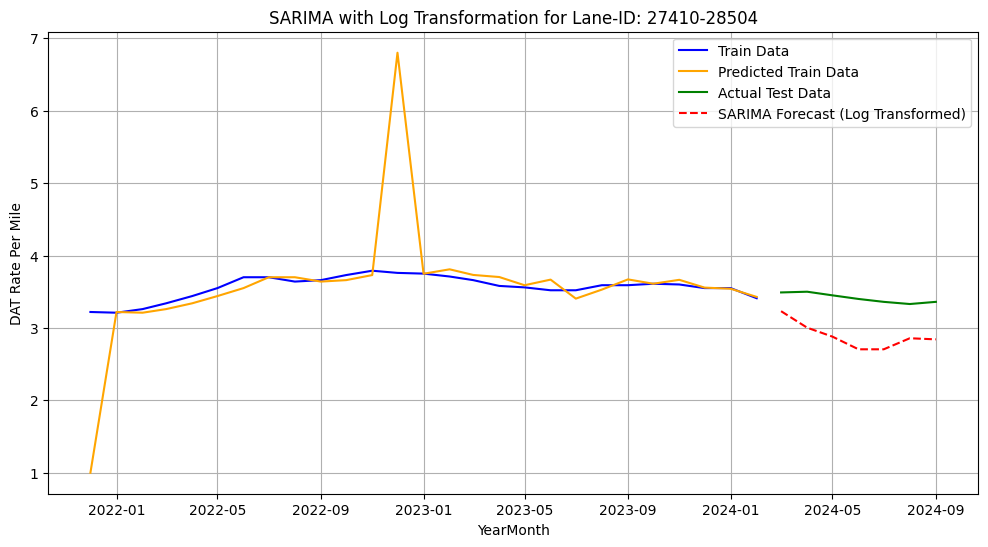

Lane-ID: 76501-78130 - MSE: 0.1198


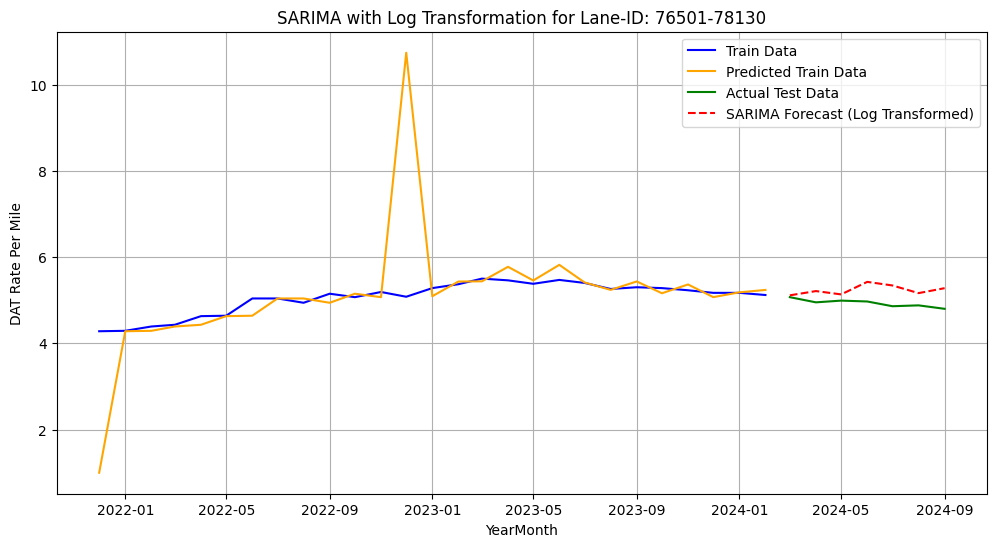

Lane-ID: 30014-14424 - MSE: 0.0297


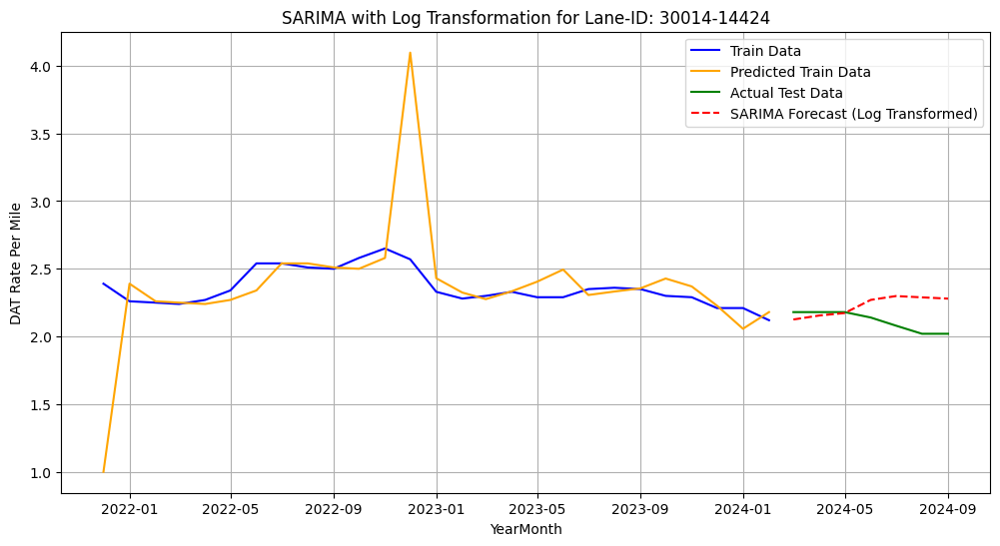

Lane-ID: 30014-32063 - MSE: 0.0052


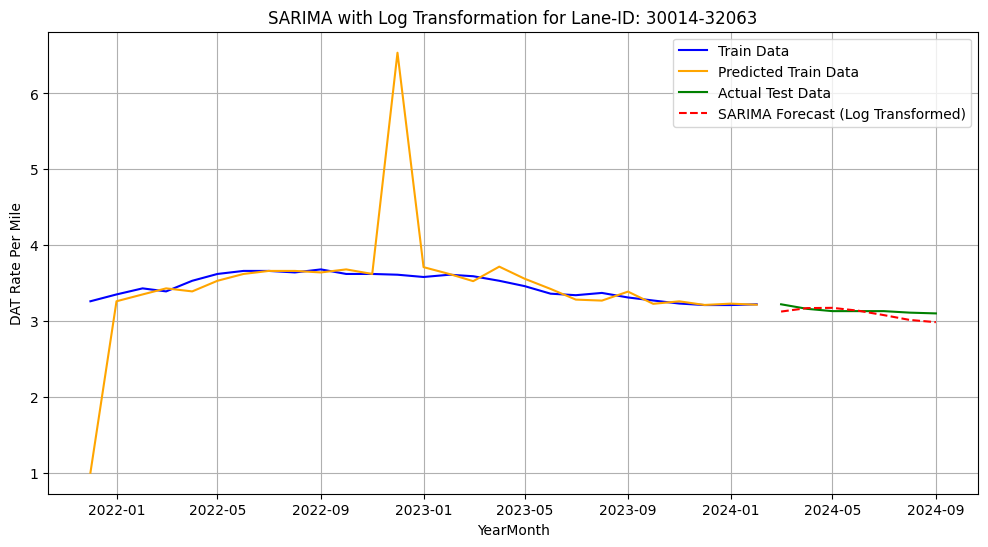

Lane-ID: 30014-60446 - MSE: 0.0292


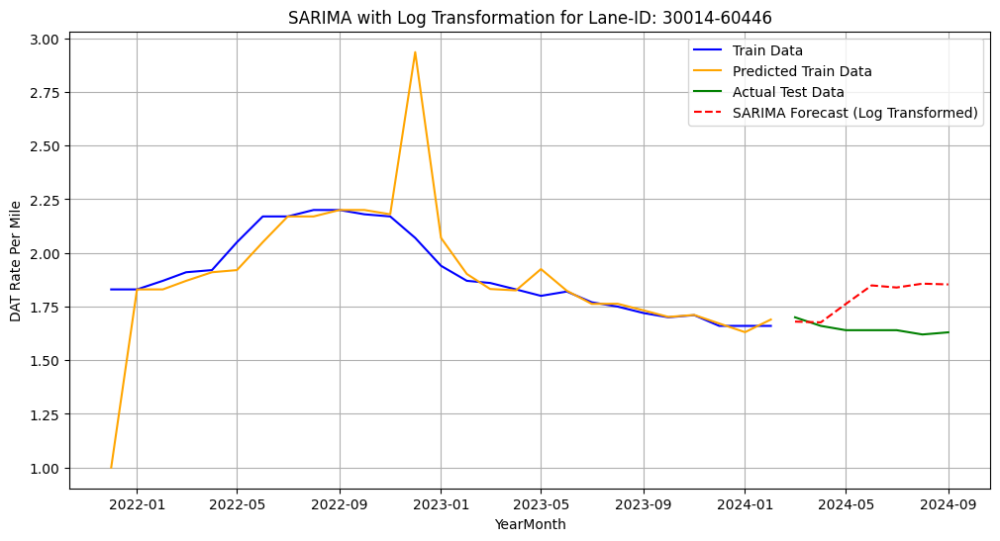

Lane-ID: 30014-60473 - MSE: 0.0129


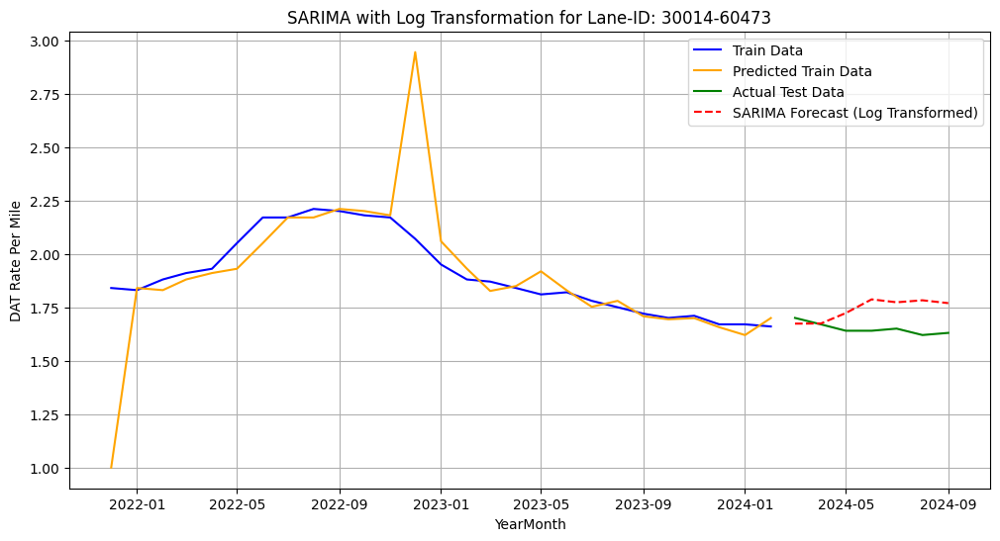

Lane-ID: 60446-14424 - MSE: 0.2877


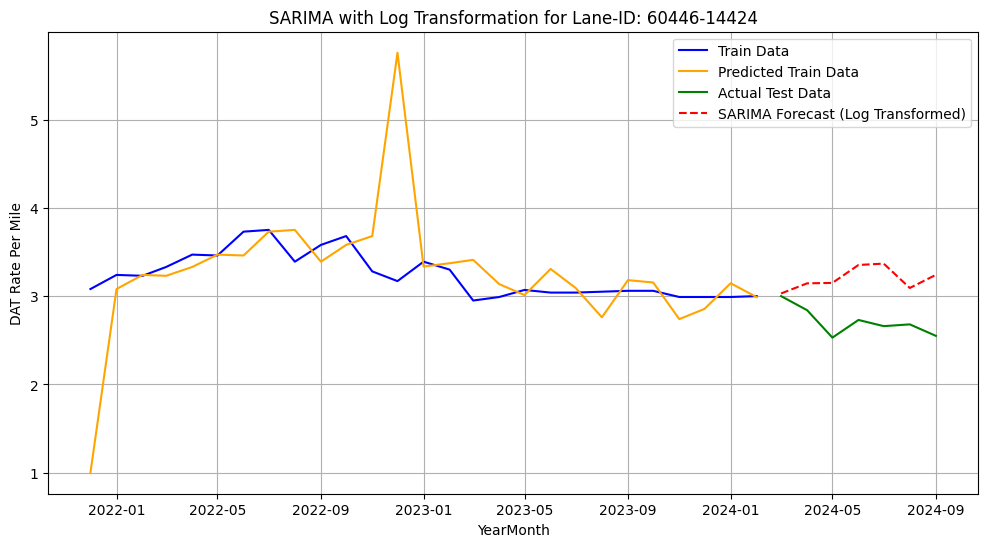

Lane-ID: 60446-30014 - MSE: 0.0528


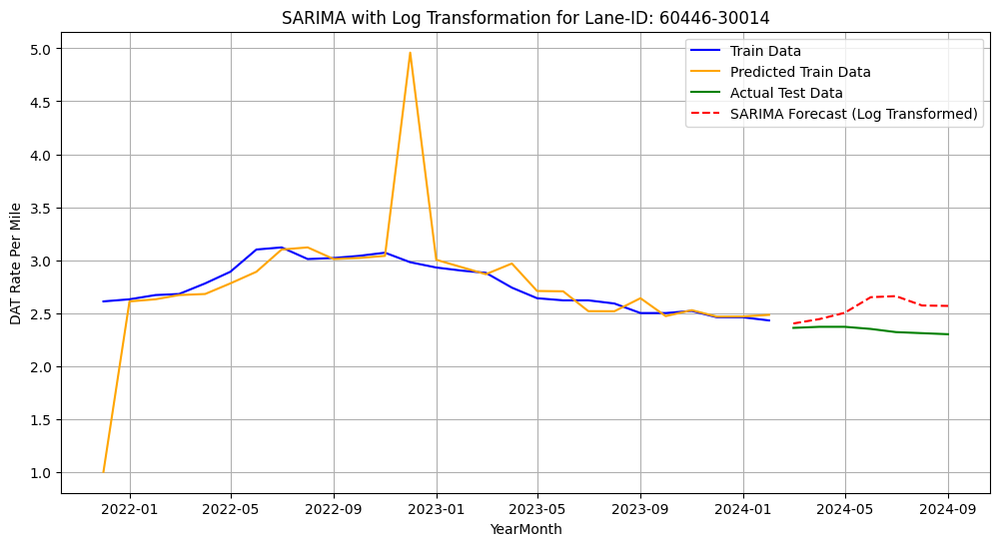

Lane-ID: 60446-76501 - MSE: 0.0148


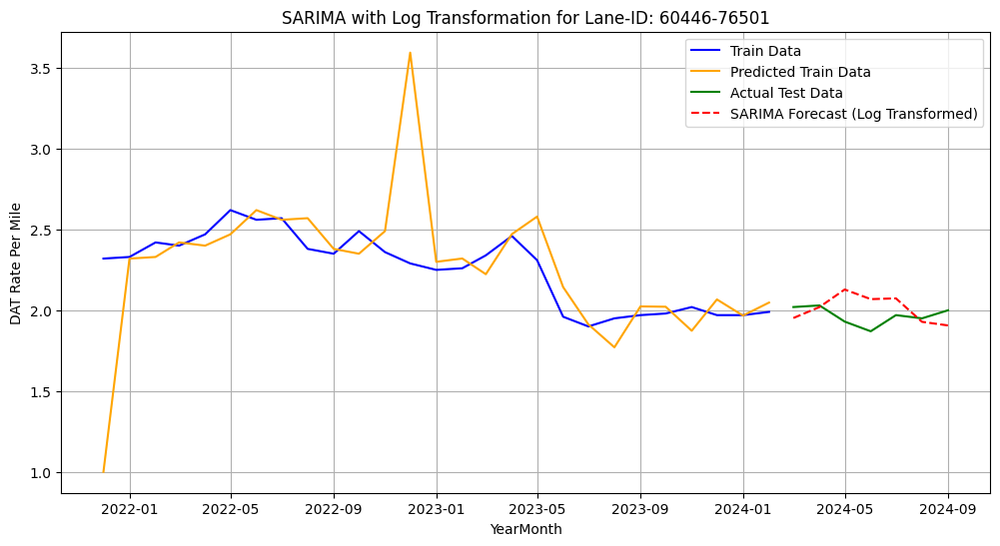

Lane-ID: 72104-18202 - MSE: 0.0072


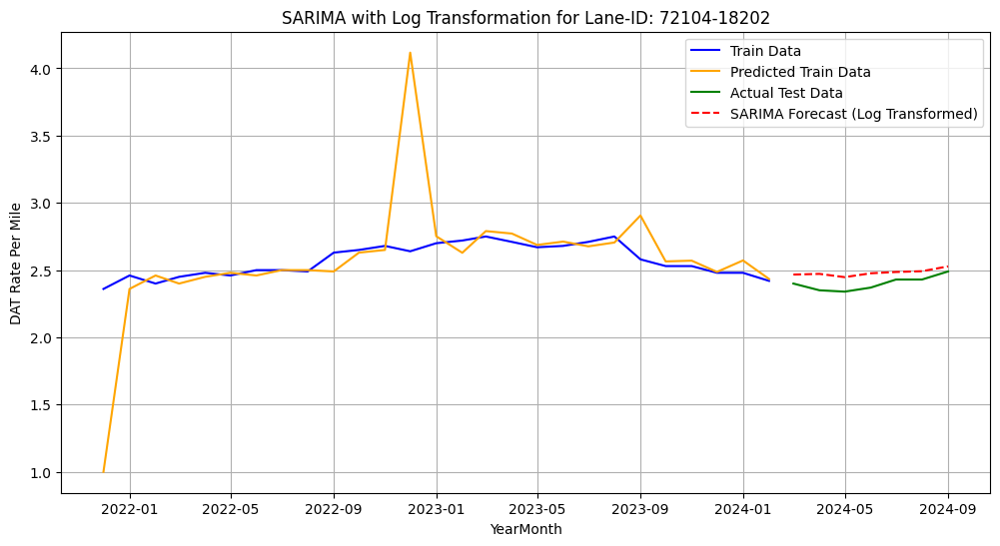

Lane-ID: 76501-60446 - MSE: 0.0829


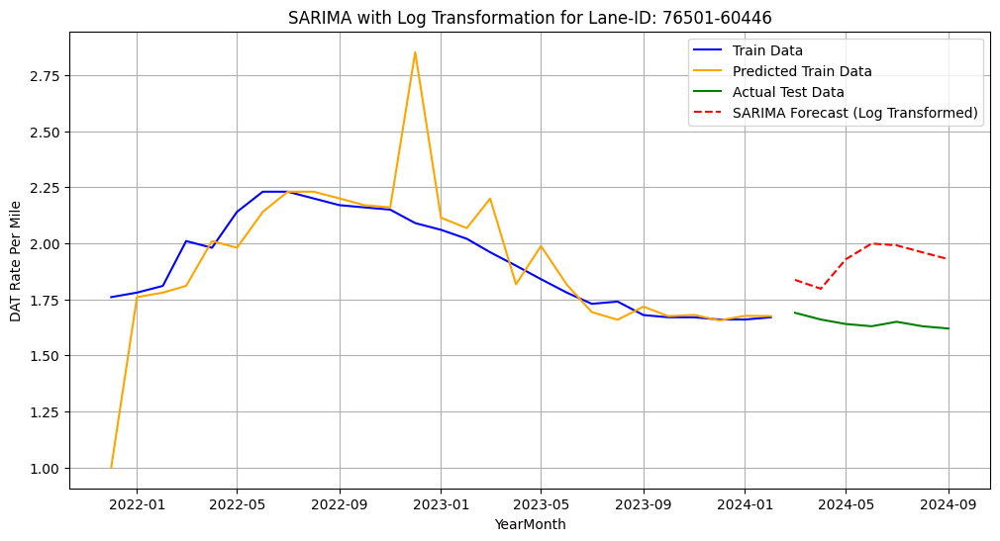

Lane-ID: 95206-92408 - MSE: 0.0157


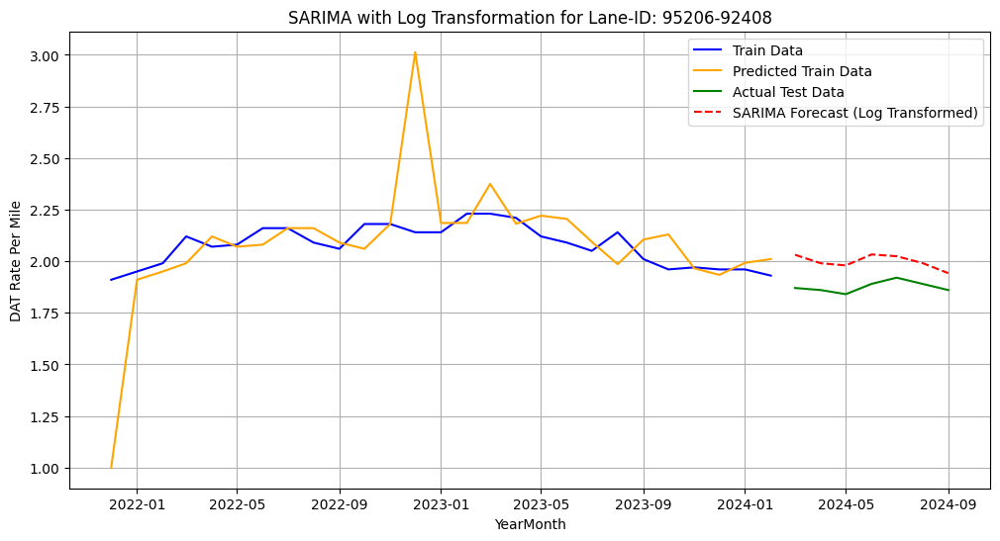

Lane-ID: 29842-30014 - MSE: 0.0286


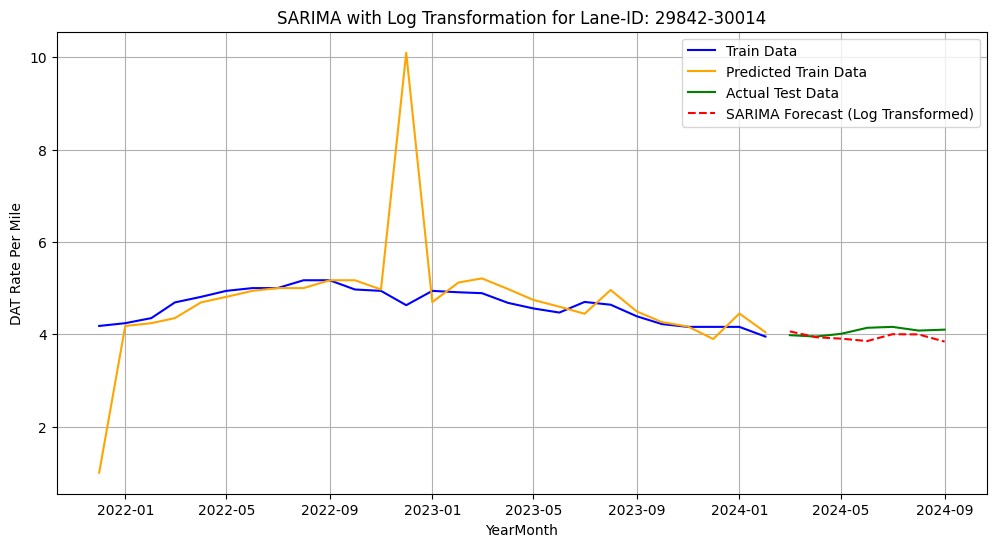

Lane-ID: 76501-66106 - MSE: 0.0146


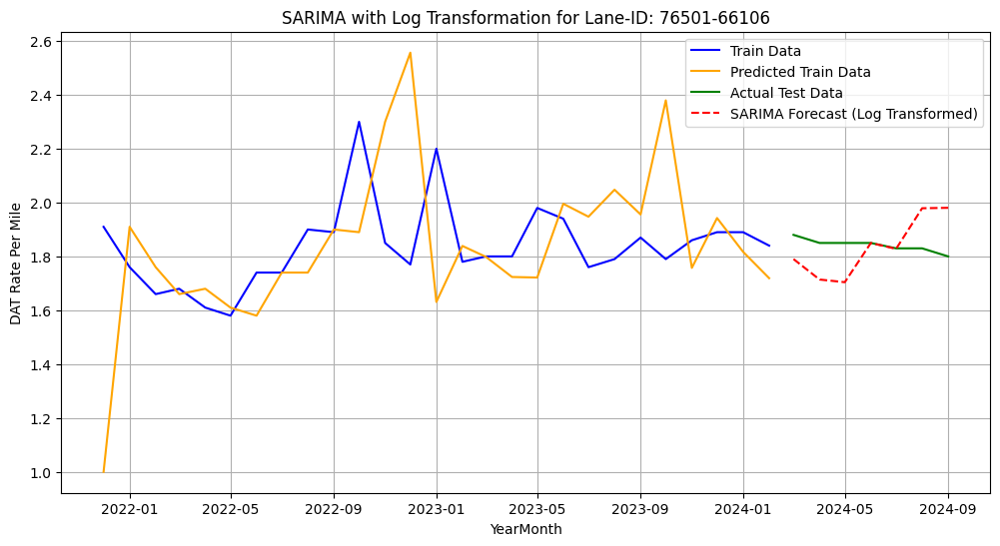

Lane-ID: 27410-31788 - MSE: 0.0402


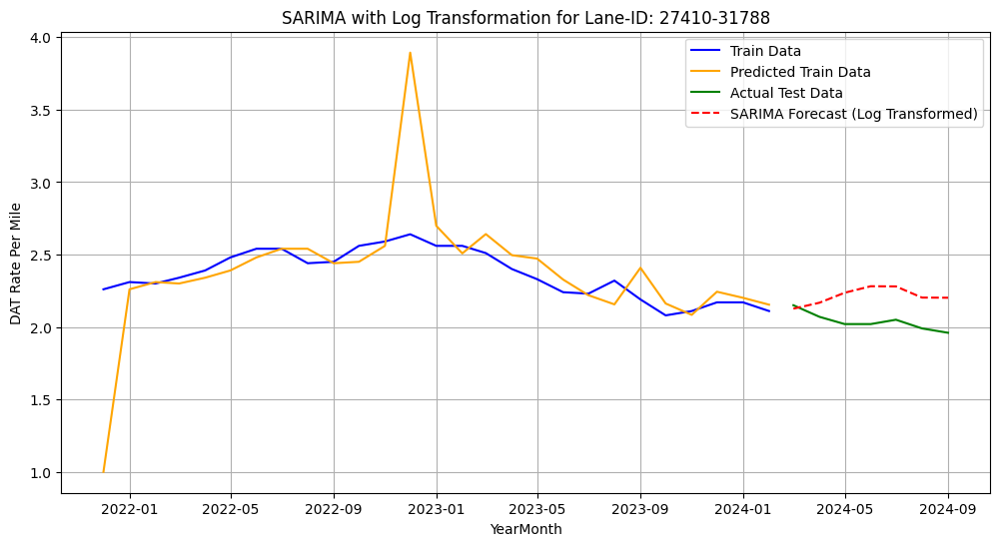

Lane-ID: 30014-92408 - MSE: 0.0290


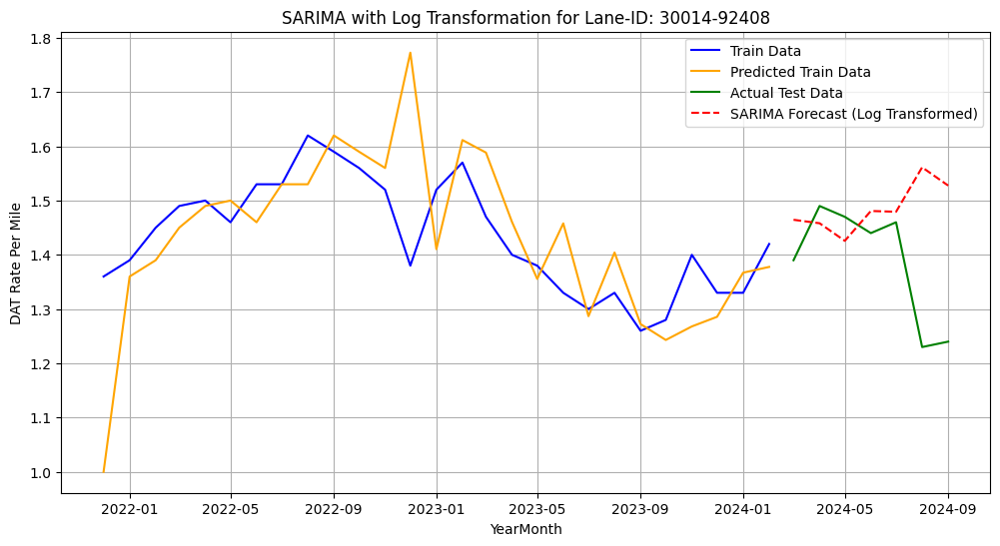

Lane-ID: 76501-92408 - MSE: 0.0215


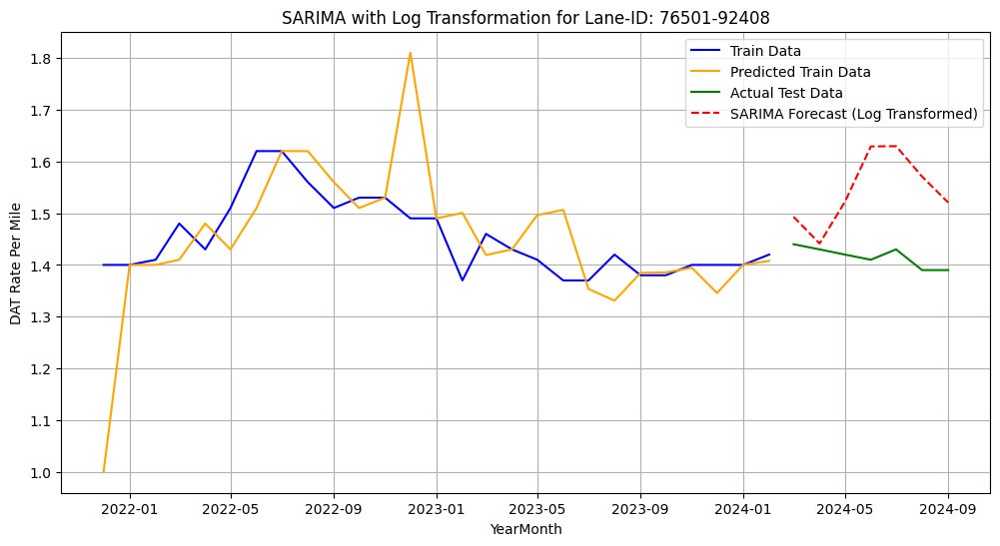

Lane-ID: 79603-92408 - MSE: 0.0231


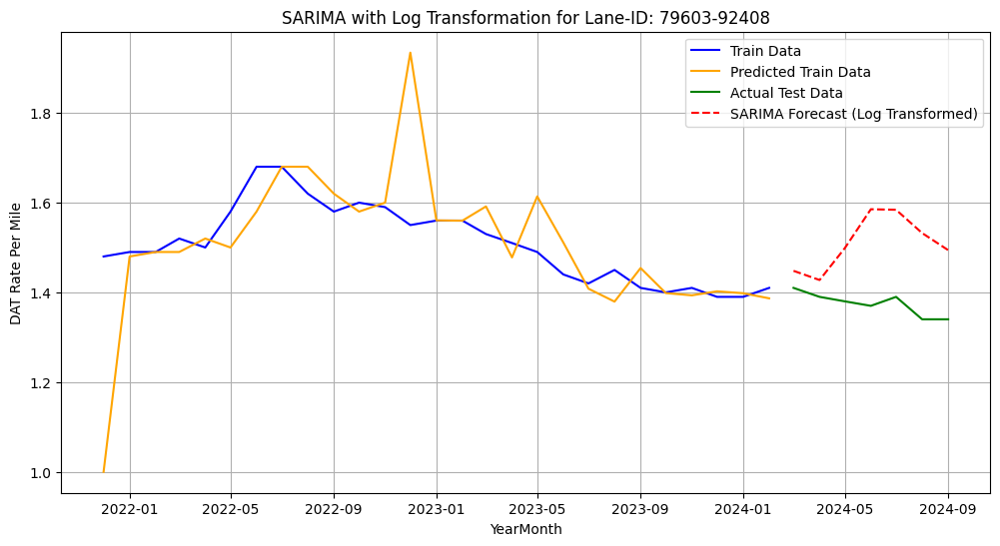

Lane-ID: 92408-85043 - MSE: 0.2552


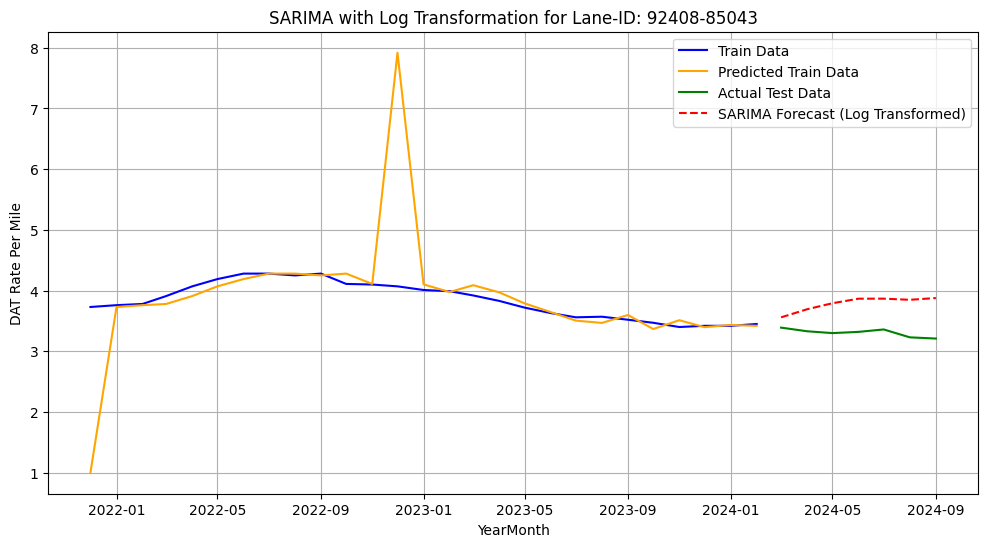

Lane-ID: 27410-45040 - MSE: 0.1318


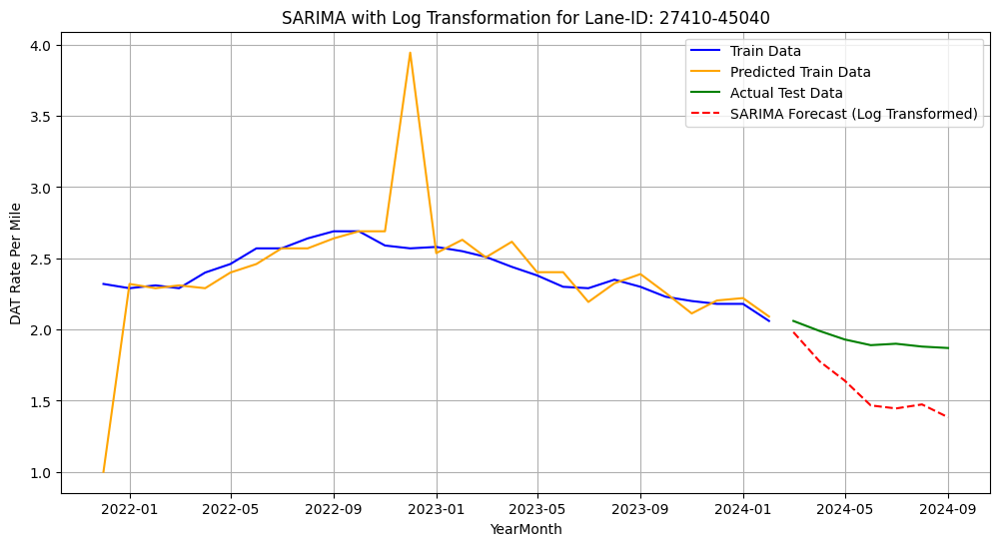

In [73]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.metrics import mean_squared_error

# Function to fit SARIMA with log transformation and visualize the results
def fit_sarima_log(df, lane_id):
    # Ensure 'YearMonth' is datetime and sort by it
    df['YearMonth'] = pd.to_datetime(df['YearMonth'])
    df = df.sort_values('YearMonth').reset_index(drop=True)

    # Split data into train (80%) and test (20%)
    train_size = int(len(df) * 0.8)
    train, test = df.iloc[:train_size], df.iloc[train_size:]

    # Extract the 'DAT Rate Per Mile' series
    train_data = train['DAT Rate Per Mile']
    test_data = test['DAT Rate Per Mile']

    # Apply log transformation to stabilize variance
    train_log = np.log(train_data)

    # Step 1: Fit SARIMA model on log-transformed data
    sarima_model = SARIMAX(train_log, order=(1, 1, 1), seasonal_order=(1, 1, 1, 12))
    sarima_result = sarima_model.fit(disp=False)

    # Step 2: In-sample prediction for train data (log scale)
    train_pred_log = sarima_result.fittedvalues

    # Step 3: Forecast for test period (log scale)
    forecast_log = sarima_result.forecast(steps=len(test_data))

    # Step 4: Reverse the log transformation (exponentiate predictions)
    train_pred = np.exp(train_pred_log)
    forecast = np.exp(forecast_log)

    # Calculate Mean Squared Error (MSE) on original scale
    mse = mean_squared_error(test_data, forecast)
    print(f"Lane-ID: {lane_id} - MSE: {mse:.4f}")

    # Plot results
    plt.figure(figsize=(12, 6))
    plt.plot(train['YearMonth'], train_data, label='Train Data', color='blue')
    plt.plot(train['YearMonth'], train_pred, label='Predicted Train Data', color='orange')
    plt.plot(test['YearMonth'], test_data, label='Actual Test Data', color='green')
    plt.plot(test['YearMonth'], forecast, label='SARIMA Forecast (Log Transformed)', color='red', linestyle='--')

    # Add plot details
    plt.xlabel('YearMonth')
    plt.ylabel('DAT Rate Per Mile')
    plt.title(f'SARIMA with Log Transformation for Lane-ID: {lane_id}')
    plt.legend()
    plt.grid(True)
    plt.show()

# Loop through each DataFrame in the top_10_dfs dictionary
for lane_id, df in top_10_dfs.items():
    fit_sarima_log(df, lane_id)


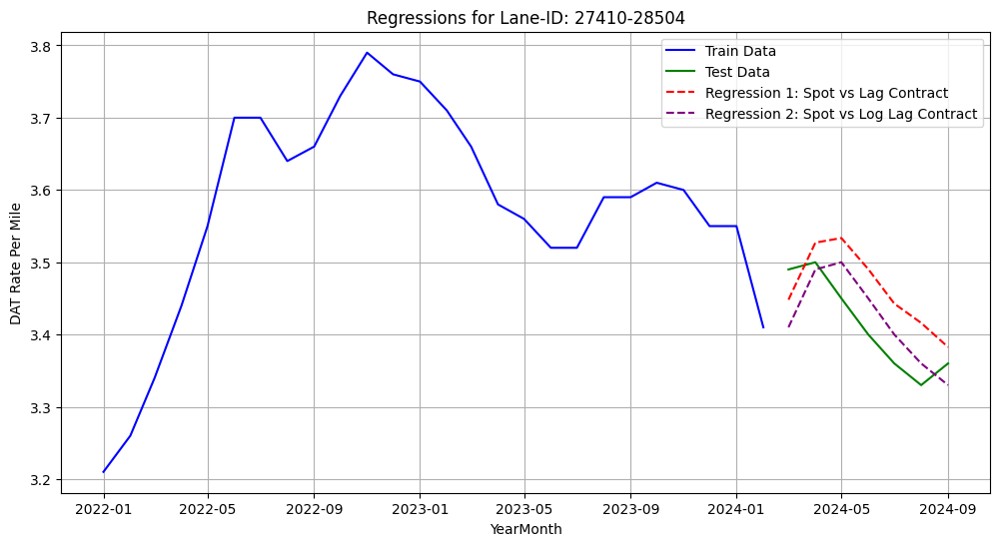

Metrics for Lane-ID: 27410-28504
                                        Model        R²       MSE
0          Regression 1: Spot vs Lag Contract -0.176692  0.004630
1  Regression 2: Log Spot vs Log Lag Contract  0.459025  0.002129


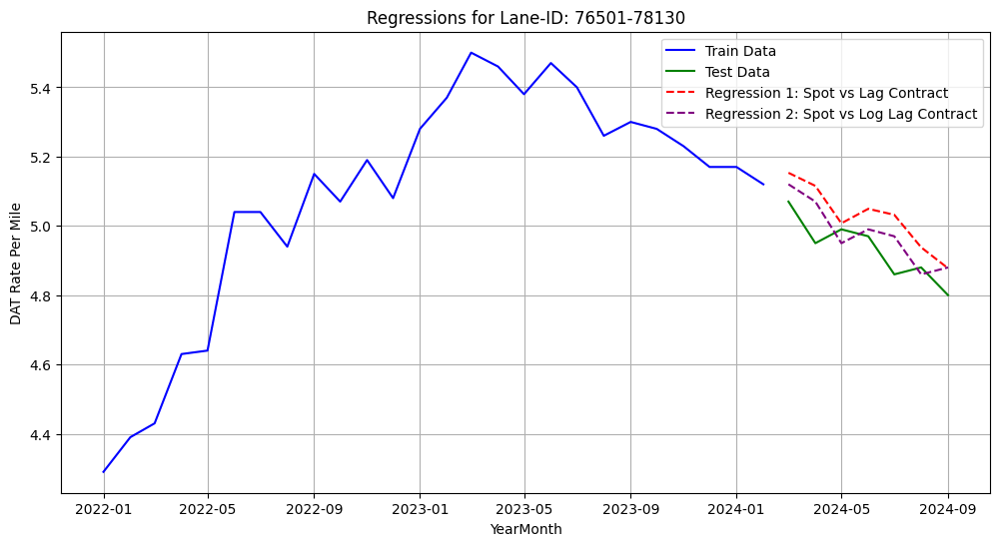

Metrics for Lane-ID: 76501-78130
                                        Model        R²       MSE
0          Regression 1: Spot vs Lag Contract -0.612359  0.011398
1  Regression 2: Log Spot vs Log Lag Contract  0.236143  0.005400


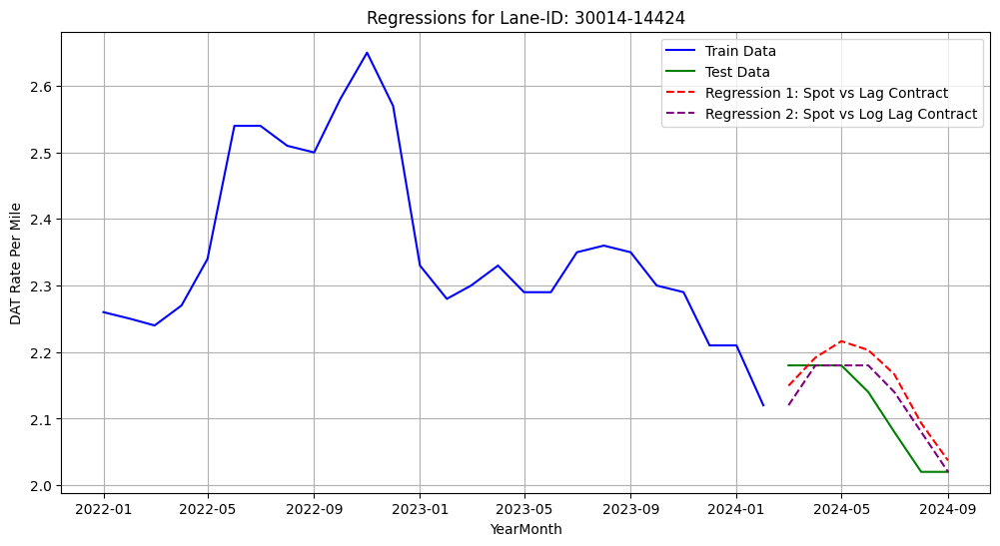

Metrics for Lane-ID: 30014-14424
                                        Model        R²       MSE
0          Regression 1: Spot vs Lag Contract  0.399880  0.002792
1  Regression 2: Log Spot vs Log Lag Contract  0.619298  0.001771


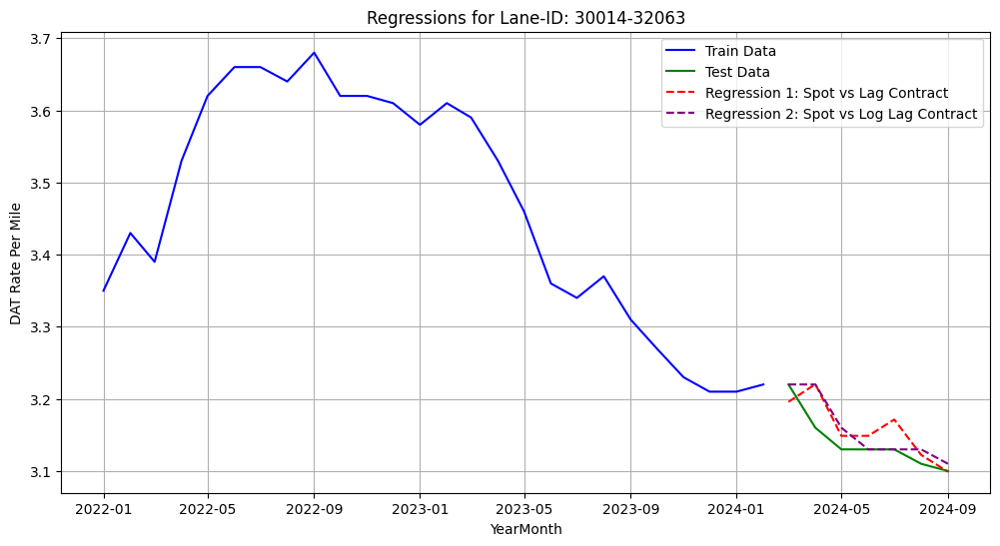

Metrics for Lane-ID: 30014-32063
                                        Model        R²       MSE
0          Regression 1: Spot vs Lag Contract  0.292121  0.000971
1  Regression 2: Log Spot vs Log Lag Contract  0.479167  0.000714


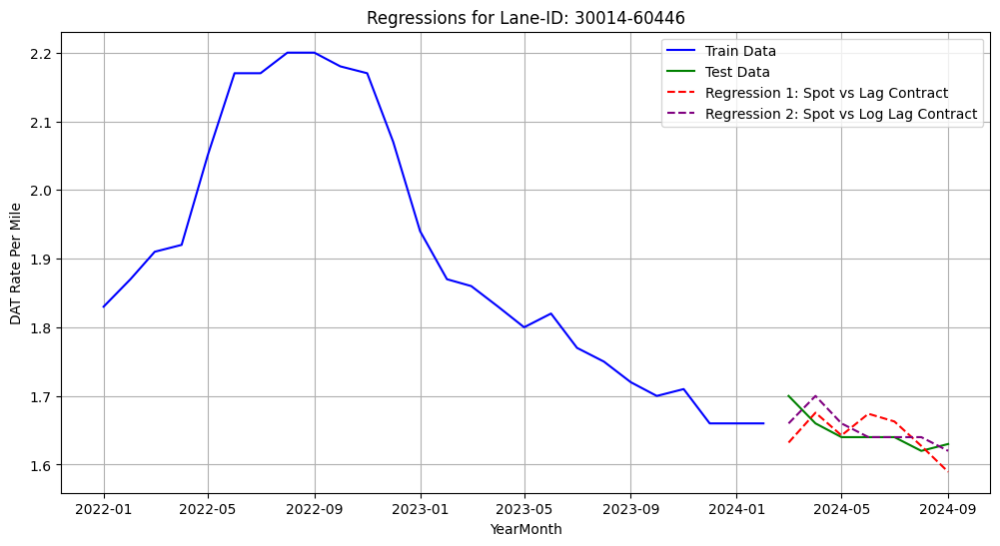

Metrics for Lane-ID: 30014-60446
                                        Model        R²       MSE
0          Regression 1: Spot vs Lag Contract -0.988439  0.001177
1  Regression 2: Log Spot vs Log Lag Contract  0.010345  0.000586


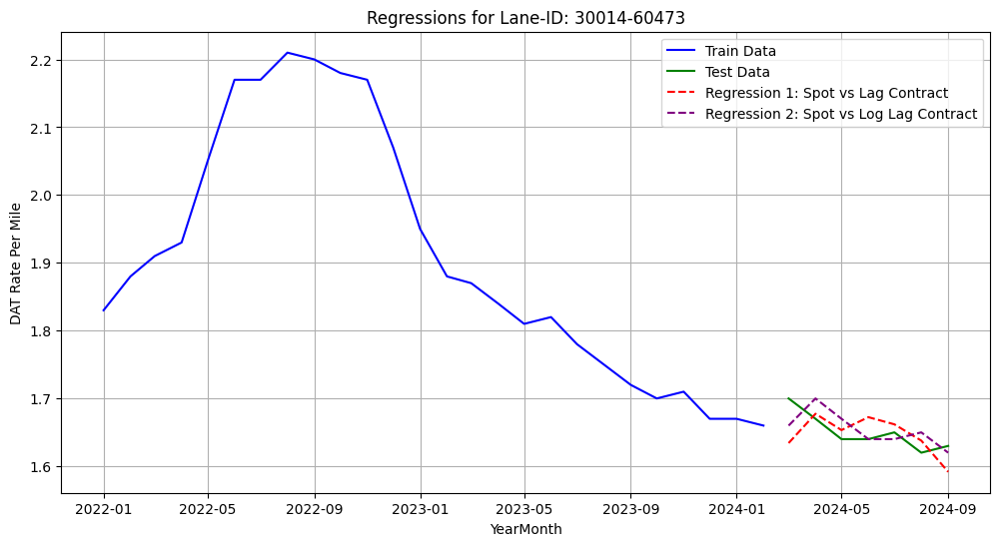

Metrics for Lane-ID: 30014-60473
                                        Model        R²       MSE
0          Regression 1: Spot vs Lag Contract -0.712436  0.001076
1  Regression 2: Log Spot vs Log Lag Contract -0.022727  0.000643


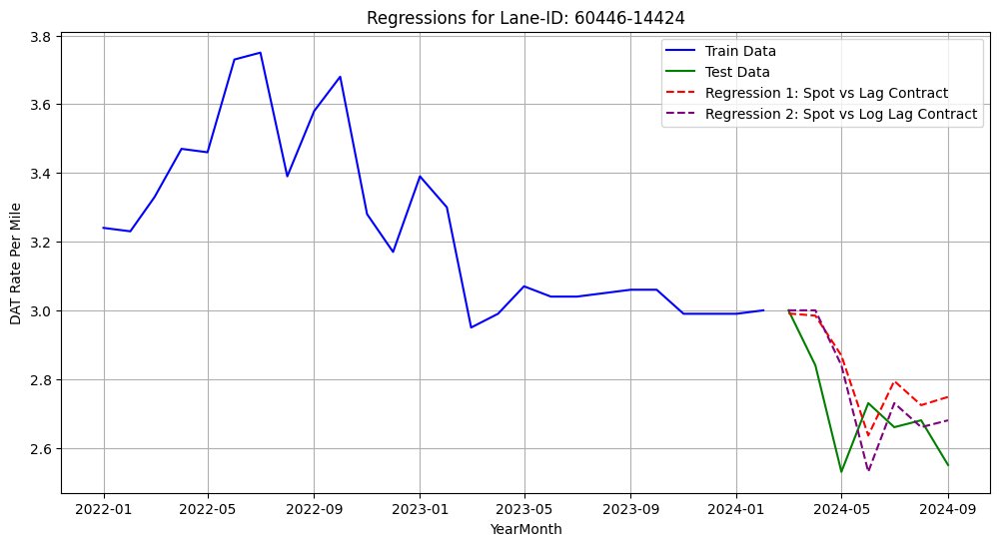

Metrics for Lane-ID: 60446-14424
                                        Model        R²       MSE
0          Regression 1: Spot vs Lag Contract -0.251445  0.029095
1  Regression 2: Log Spot vs Log Lag Contract -0.130004  0.026271


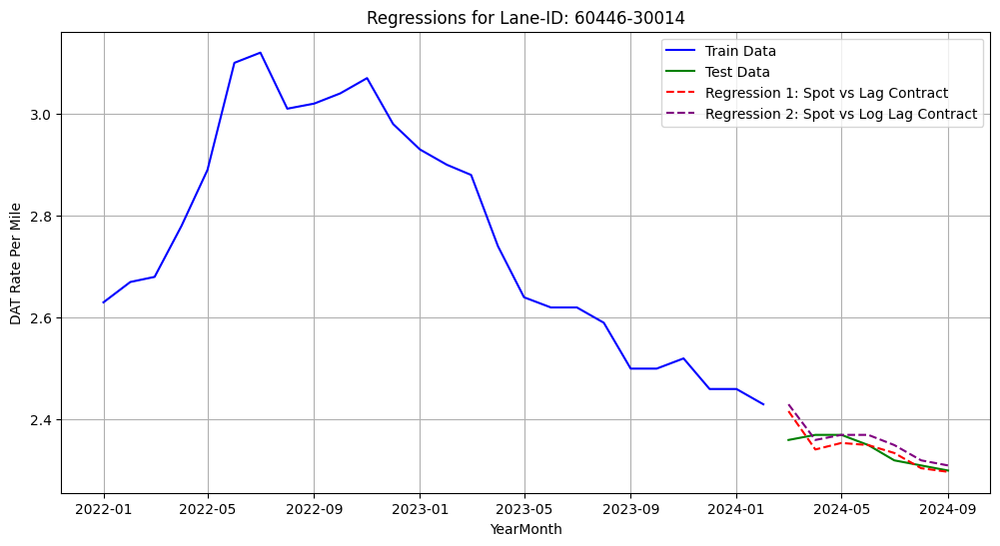

Metrics for Lane-ID: 60446-30014
                                        Model        R²       MSE
0          Regression 1: Spot vs Lag Contract  0.132703  0.000644
1  Regression 2: Log Spot vs Log Lag Contract -0.250000  0.000929


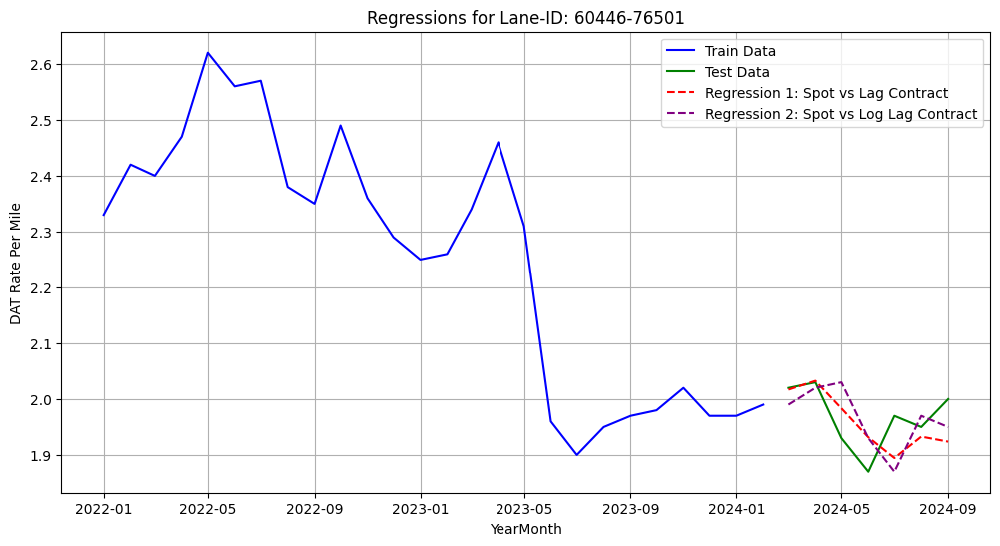

Metrics for Lane-ID: 60446-76501
                                        Model        R²       MSE
0          Regression 1: Spot vs Lag Contract  0.025605  0.002637
1  Regression 2: Log Spot vs Log Lag Contract -0.451735  0.003929


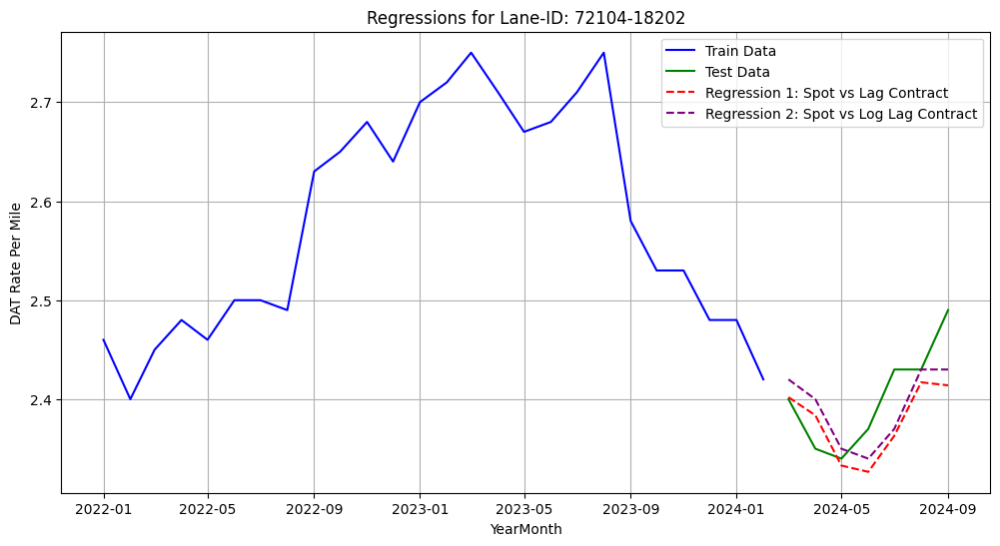

Metrics for Lane-ID: 72104-18202
                                        Model        R²       MSE
0          Regression 1: Spot vs Lag Contract  0.201207  0.001927
1  Regression 2: Log Spot vs Log Lag Contract  0.342640  0.001586


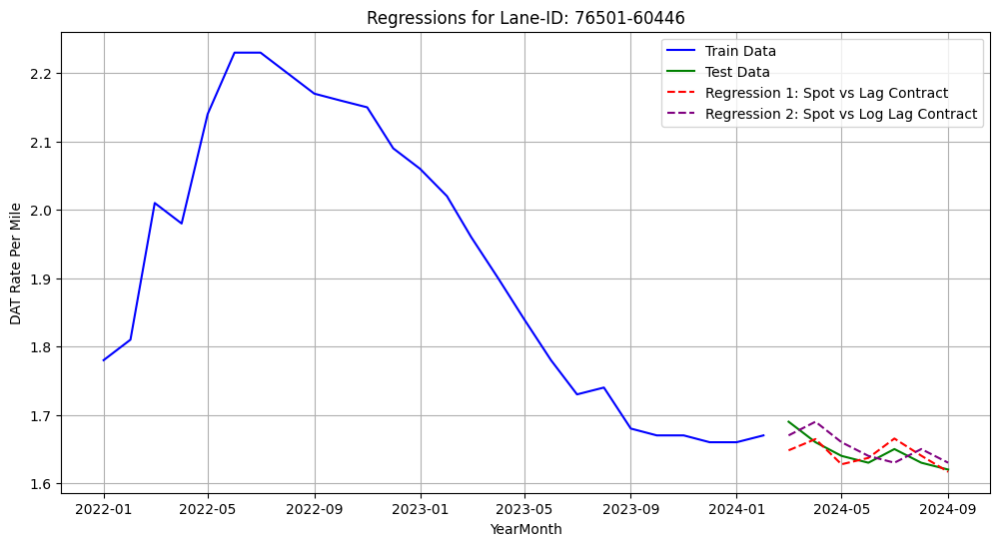

Metrics for Lane-ID: 76501-60446
                                        Model        R²       MSE
0          Regression 1: Spot vs Lag Contract  0.309112  0.000333
1  Regression 2: Log Spot vs Log Lag Contract  0.199153  0.000386


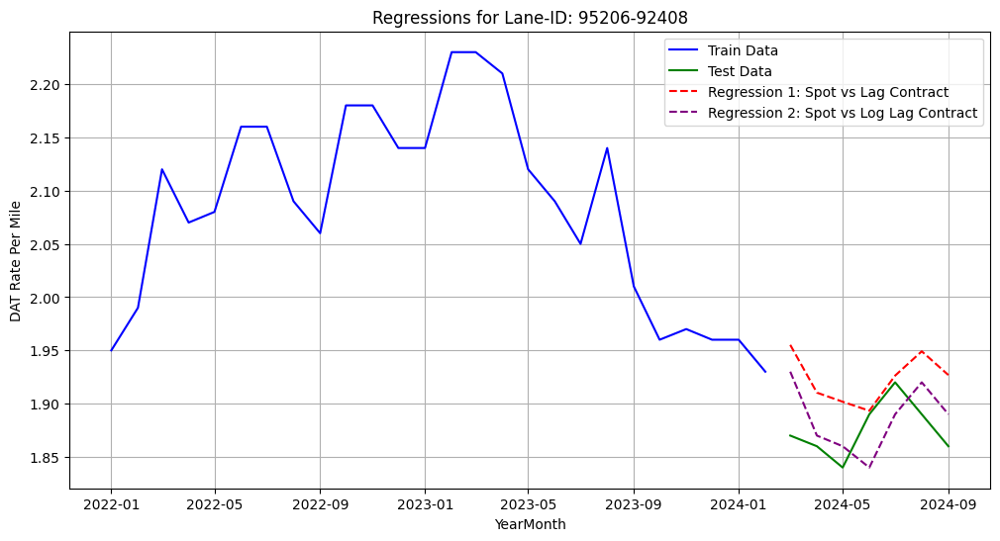

Metrics for Lane-ID: 95206-92408
                                        Model        R²       MSE
0          Regression 1: Spot vs Lag Contract -4.181613  0.003088
1  Regression 2: Log Spot vs Log Lag Contract -1.229452  0.001329


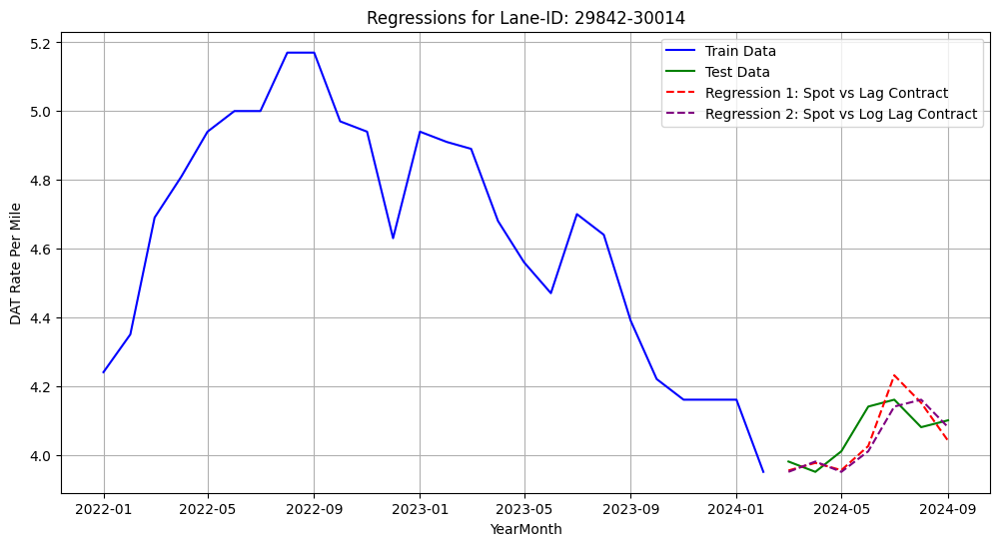

Metrics for Lane-ID: 29842-30014
                                        Model        R²       MSE
0          Regression 1: Spot vs Lag Contract  0.208468  0.004455
1  Regression 2: Log Spot vs Log Lag Contract  0.251269  0.004214


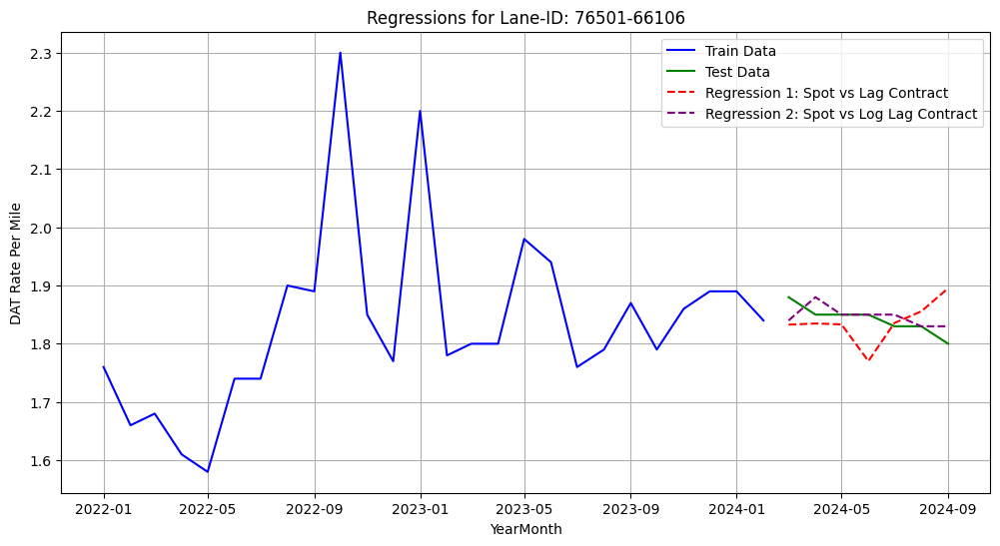

Metrics for Lane-ID: 76501-66106
                                        Model        R²       MSE
0          Regression 1: Spot vs Lag Contract -4.124312  0.002698
1  Regression 2: Log Spot vs Log Lag Contract -0.031008  0.000543


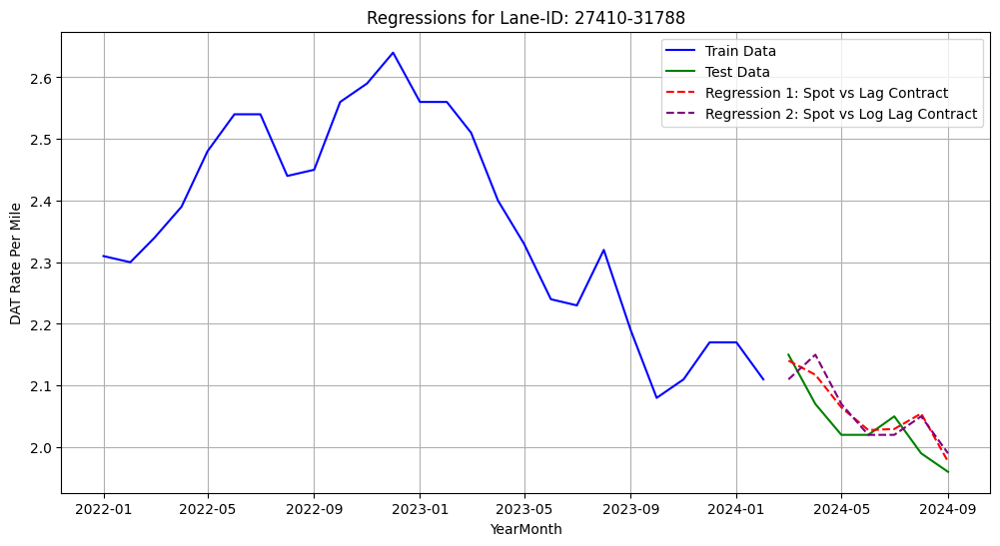

Metrics for Lane-ID: 27410-31788
                                        Model        R²       MSE
0          Regression 1: Spot vs Lag Contract  0.592925  0.001323
1  Regression 2: Log Spot vs Log Lag Contract  0.300879  0.002271


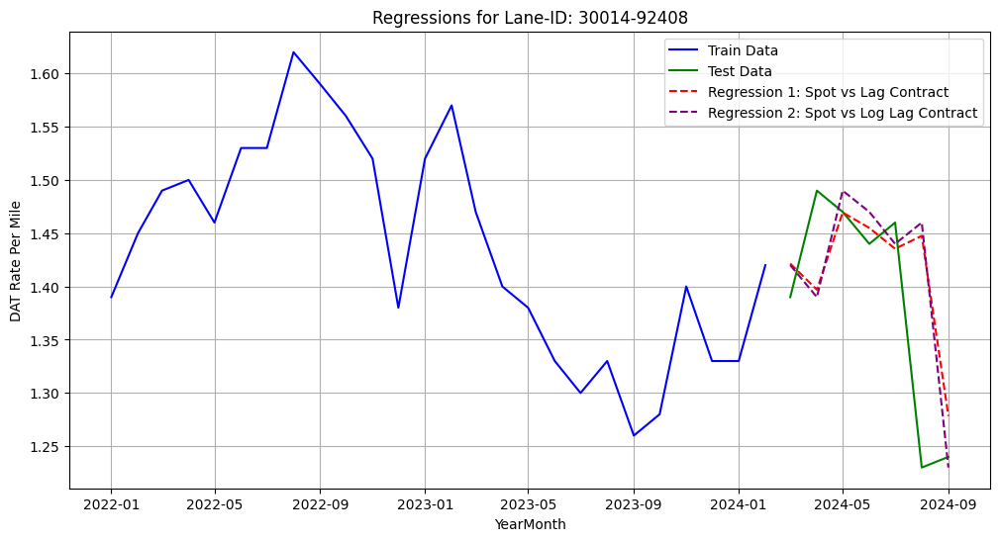

Metrics for Lane-ID: 30014-92408
                                        Model        R²       MSE
0          Regression 1: Spot vs Lag Contract  0.175349  0.008469
1  Regression 2: Log Spot vs Log Lag Contract  0.087440  0.009371


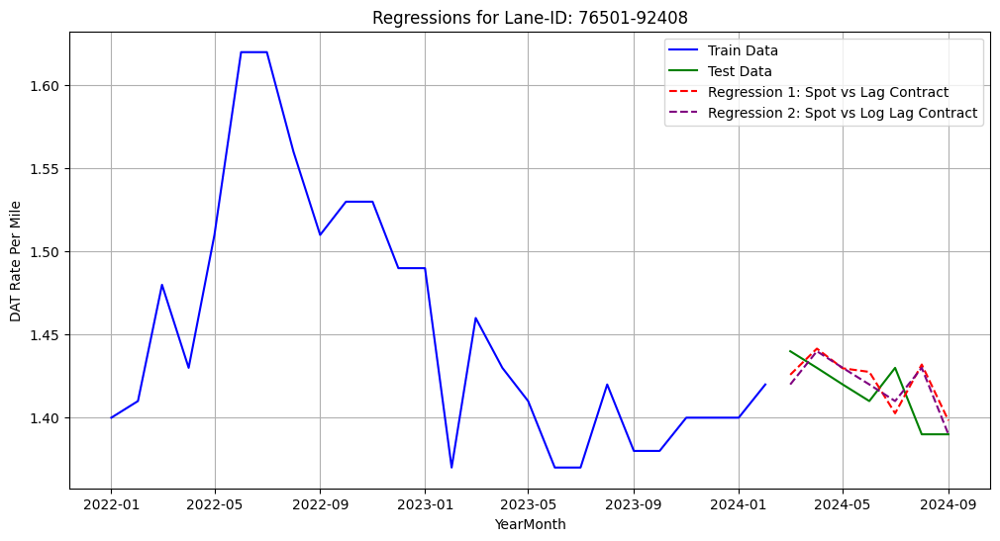

Metrics for Lane-ID: 76501-92408
                                        Model        R²       MSE
0          Regression 1: Spot vs Lag Contract -0.399793  0.000474
1  Regression 2: Log Spot vs Log Lag Contract -0.138554  0.000386


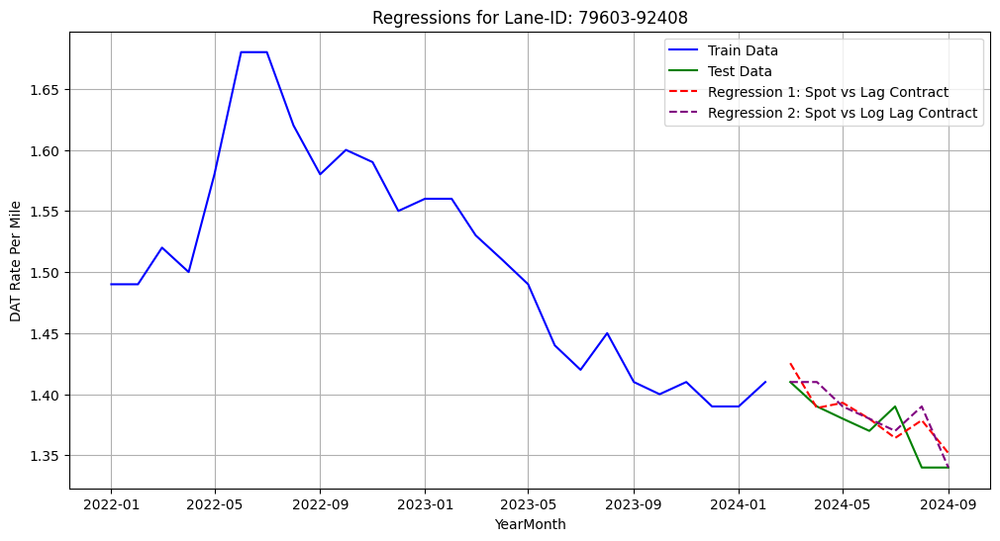

Metrics for Lane-ID: 79603-92408
                                        Model        R²       MSE
0          Regression 1: Spot vs Lag Contract  0.326110  0.000402
1  Regression 2: Log Spot vs Log Lag Contract  0.160959  0.000500


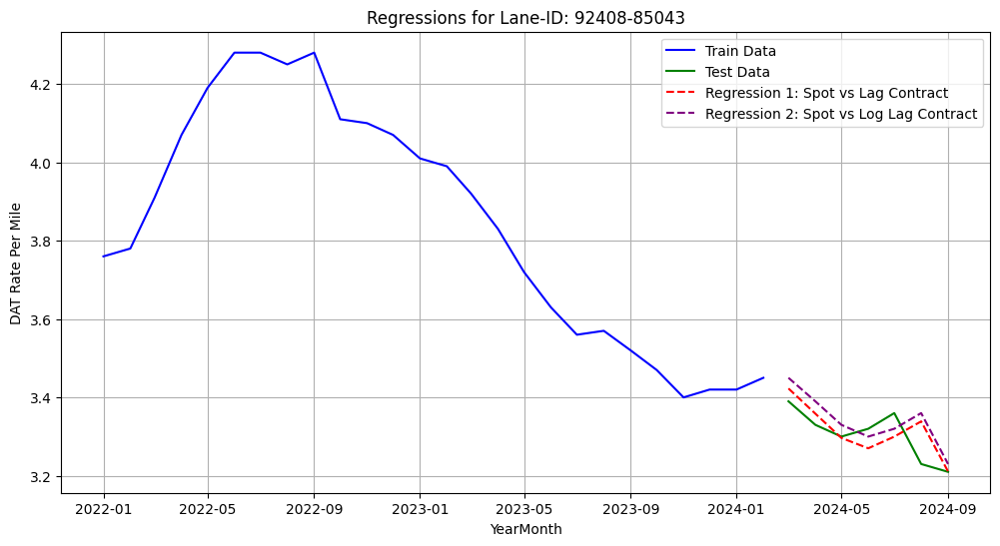

Metrics for Lane-ID: 92408-85043
                                        Model        R²       MSE
0          Regression 1: Spot vs Lag Contract  0.229763  0.002836
1  Regression 2: Log Spot vs Log Lag Contract -0.063193  0.003914


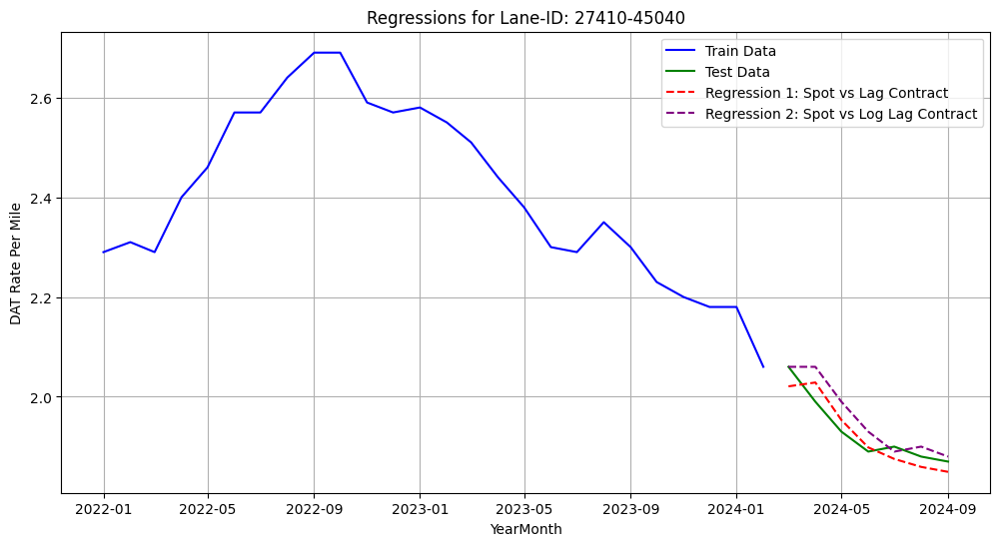

Metrics for Lane-ID: 27410-45040
                                        Model        R²       MSE
0          Regression 1: Spot vs Lag Contract  0.824638  0.000729
1  Regression 2: Log Spot vs Log Lag Contract  0.632122  0.001529


In [74]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score

# Function to perform regressions and plot results
def regression_comparison(df, lane_id):
    # Ensure 'YearMonth' is datetime and sort by it
    df['YearMonth'] = pd.to_datetime(df['YearMonth'])
    df = df.sort_values('YearMonth').reset_index(drop=True)

    # Drop missing values
    df = df.dropna(subset=['DAT Rate Per Mile','Dt Spot RPM'])

    # Add lagged contract rate (1 period)
    df['Lag_Contract_Rate'] = df['DAT Rate Per Mile'].shift(1)

    # Drop the first row with NaN after lagging
    df = df.dropna().reset_index(drop=True)

    # Extract spot rate and lagged contract rate
    X = df[['Lag_Contract_Rate','Dt Spot RPM']]
    y = df['DAT Rate Per Mile']

    # Split data into 80% train and 20% test
    train_size = int(len(df) * 0.8)
    X_train, X_test = X[:train_size], X[train_size:]
    y_train, y_test = y[:train_size], y[train_size:]

    # 1. Linear Regression on Spot Rate and Lagged Contract Rate
    model1 = LinearRegression()
    model1.fit(X_train, y_train)
    y_pred1 = model1.predict(X_test)

    # Calculate metrics for Regression 1
    mse1 = mean_squared_error(y_test, y_pred1)
    r2_1 = r2_score(y_test, y_pred1)

    # 2. Linear Regression on log Spot Rate and Log Lagged Contract Rate
    X_log = np.log(df[['Lag_Contract_Rate', 'Dt Spot RPM']])
    y_log = np.log(df['Lag_Contract_Rate'])

    X_train_log, X_test_log = X_log[:train_size], X_log[train_size:]
    y_train_log, y_test_log = y_log[:train_size], y_log[train_size:]

    model2 = LinearRegression()
    model2.fit(X_train_log, y_train_log)
    y_pred_log = model2.predict(X_test_log)

    # Inverse log transformation for predictions
    y_pred2 = np.exp(y_pred_log)

    # Calculate metrics for Regression 2
    mse2 = mean_squared_error(y_test, y_pred2)
    r2_2 = r2_score(y_test, y_pred2)

    # Plot train, test, and predictions
    plt.figure(figsize=(12, 6))

    # Plot actual train data
    plt.plot(df['YearMonth'][:train_size], y_train, label='Train Data', color='blue')

    # Plot actual test data
    plt.plot(df['YearMonth'][train_size:], y_test, label='Test Data', color='green')

    # Plot predictions from Regression 1
    plt.plot(df['YearMonth'][train_size:], y_pred1, label='Regression 1: Spot vs Lag Contract', color='red', linestyle='--')

    # Plot predictions from Regression 2
    plt.plot(df['YearMonth'][train_size:], y_pred2, label='Regression 2: Spot vs Log Lag Contract', color='purple', linestyle='--')

    plt.xlabel('YearMonth')
    plt.ylabel('DAT Rate Per Mile')
    plt.title(f'Regressions for Lane-ID: {lane_id}')
    plt.legend()
    plt.grid(True)
    plt.show()

    # Print metrics in table format
    metrics = pd.DataFrame({
        'Model': ['Regression 1: Spot vs Lag Contract', 'Regression 2: Log Spot vs Log Lag Contract'],
        'R²': [r2_1, r2_2],
        'MSE': [mse1, mse2]
    })

    print(f"Metrics for Lane-ID: {lane_id}")
    print(metrics)

# Example call for one lane
for lane_id, df in top_10_dfs.items():
    regression_comparison(df, lane_id)


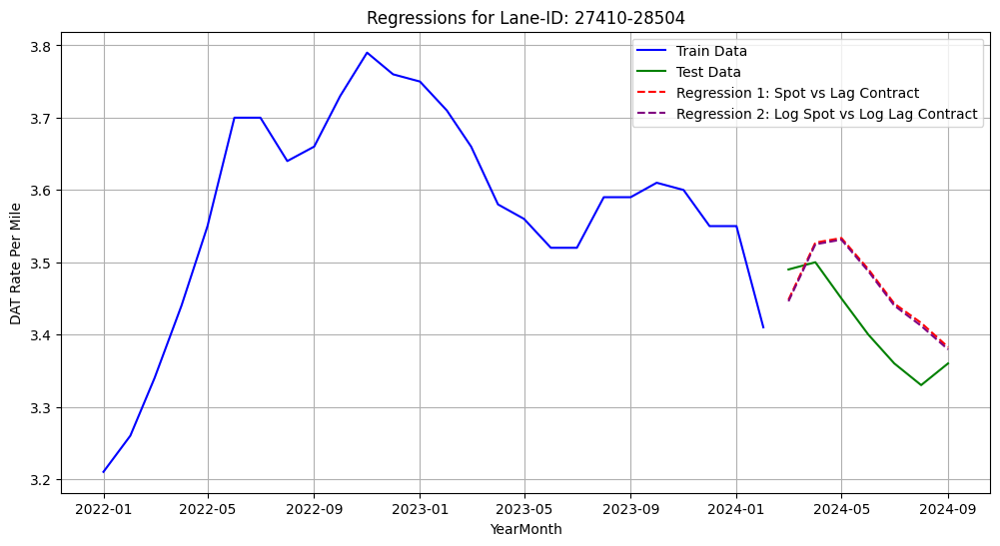


Metrics for Lane-ID: 27410-28504
                                        Model        R²       MSE
0          Regression 1: Spot vs Lag Contract -0.176692  0.004630
1  Regression 2: Log Spot vs Log Lag Contract -0.102219  0.004337

Forecasted Values, Actual Values, and Error Terms for Lane-ID: 27410-28504
   YearMonth  Actual Values  Regression 1 Forecast  Regression 1 Error  \
0 2024-03-01           3.49               3.448137            0.041863   
1 2024-04-01           3.50               3.527140           -0.027140   
2 2024-05-01           3.45               3.533479           -0.083479   
3 2024-06-01           3.40               3.490468           -0.090468   
4 2024-07-01           3.36               3.442774           -0.082774   
5 2024-08-01           3.33               3.416053           -0.086053   
6 2024-09-01           3.36               3.382597           -0.022597   

   Regression 2 Forecast  Regression 2 Error  
0               3.446006            0.043994  
1    

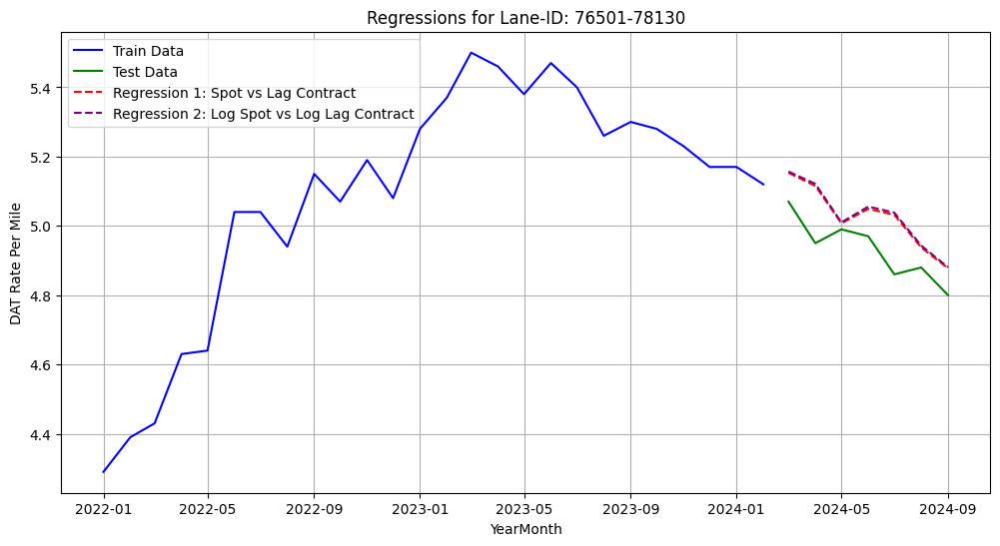


Metrics for Lane-ID: 76501-78130
                                        Model        R²       MSE
0          Regression 1: Spot vs Lag Contract -0.612359  0.011398
1  Regression 2: Log Spot vs Log Lag Contract -0.753396  0.012395

Forecasted Values, Actual Values, and Error Terms for Lane-ID: 76501-78130
   YearMonth  Actual Values  Regression 1 Forecast  Regression 1 Error  \
0 2024-03-01           5.07               5.153152           -0.083152   
1 2024-04-01           4.95               5.115386           -0.165386   
2 2024-05-01           4.99               5.007423           -0.017423   
3 2024-06-01           4.97               5.049233           -0.079233   
4 2024-07-01           4.86               5.031930           -0.171930   
5 2024-08-01           4.88               4.937932           -0.057932   
6 2024-09-01           4.80               4.877618           -0.077618   

   Regression 2 Forecast  Regression 2 Error  
0               5.156781           -0.086781  
1    

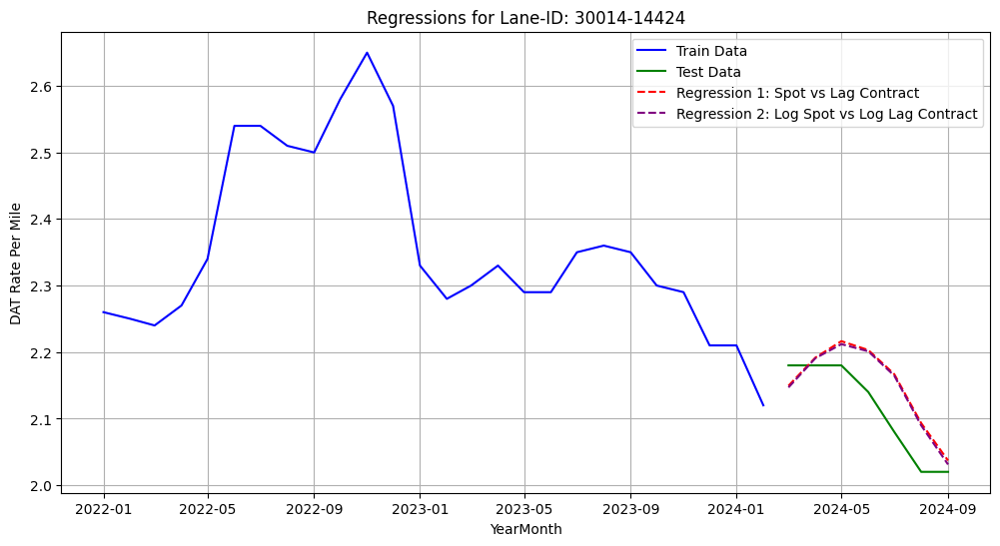


Metrics for Lane-ID: 30014-14424
                                        Model        R²       MSE
0          Regression 1: Spot vs Lag Contract  0.399880  0.002792
1  Regression 2: Log Spot vs Log Lag Contract  0.443812  0.002588

Forecasted Values, Actual Values, and Error Terms for Lane-ID: 30014-14424
   YearMonth  Actual Values  Regression 1 Forecast  Regression 1 Error  \
0 2024-03-01           2.18               2.149394            0.030606   
1 2024-04-01           2.18               2.191659           -0.011659   
2 2024-05-01           2.18               2.216385           -0.036385   
3 2024-06-01           2.14               2.203046           -0.063046   
4 2024-07-01           2.08               2.166736           -0.086736   
5 2024-08-01           2.02               2.093239           -0.073239   
6 2024-09-01           2.02               2.036984           -0.016984   

   Regression 2 Forecast  Regression 2 Error  
0               2.146868            0.033132  
1    

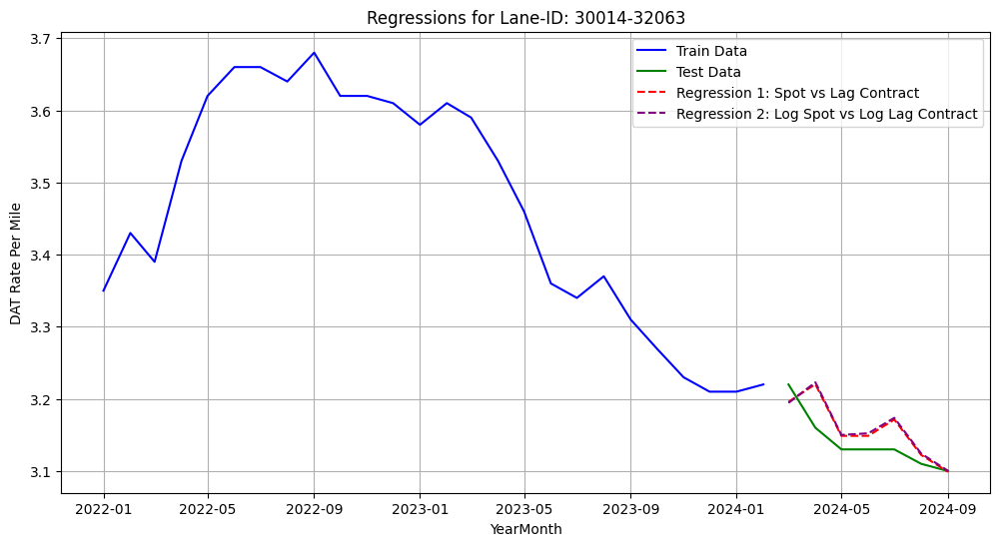


Metrics for Lane-ID: 30014-32063
                                        Model        R²       MSE
0          Regression 1: Spot vs Lag Contract  0.292121  0.000971
1  Regression 2: Log Spot vs Log Lag Contract  0.205741  0.001089

Forecasted Values, Actual Values, and Error Terms for Lane-ID: 30014-32063
   YearMonth  Actual Values  Regression 1 Forecast  Regression 1 Error  \
0 2024-03-01           3.22               3.195838            0.024162   
1 2024-04-01           3.16               3.220369           -0.060369   
2 2024-05-01           3.13               3.148750           -0.018750   
3 2024-06-01           3.13               3.148769           -0.018769   
4 2024-07-01           3.13               3.171363           -0.041363   
5 2024-08-01           3.11               3.122301           -0.012301   
6 2024-09-01           3.10               3.098858            0.001142   

   Regression 2 Forecast  Regression 2 Error  
0               3.194409            0.025591  
1    

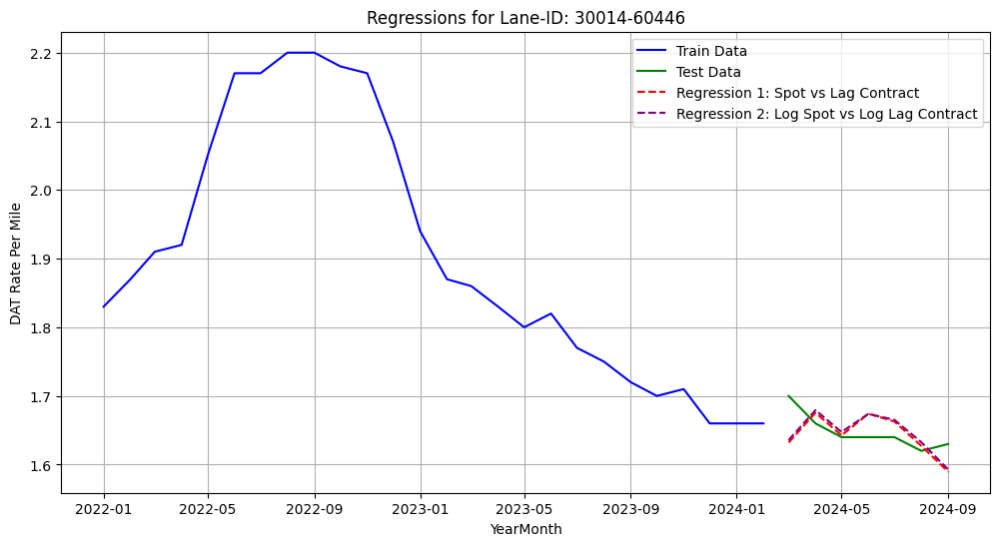


Metrics for Lane-ID: 30014-60446
                                        Model        R²       MSE
0          Regression 1: Spot vs Lag Contract -0.988439  0.001177
1  Regression 2: Log Spot vs Log Lag Contract -0.906526  0.001128

Forecasted Values, Actual Values, and Error Terms for Lane-ID: 30014-60446
   YearMonth  Actual Values  Regression 1 Forecast  Regression 1 Error  \
0 2024-03-01           1.70               1.632089            0.067911   
1 2024-04-01           1.66               1.675594           -0.015594   
2 2024-05-01           1.64               1.642494           -0.002494   
3 2024-06-01           1.64               1.674064           -0.034064   
4 2024-07-01           1.64               1.662792           -0.022792   
5 2024-08-01           1.62               1.627244           -0.007244   
6 2024-09-01           1.63               1.589451            0.040549   

   Regression 2 Forecast  Regression 2 Error  
0               1.635670            0.064330  
1    

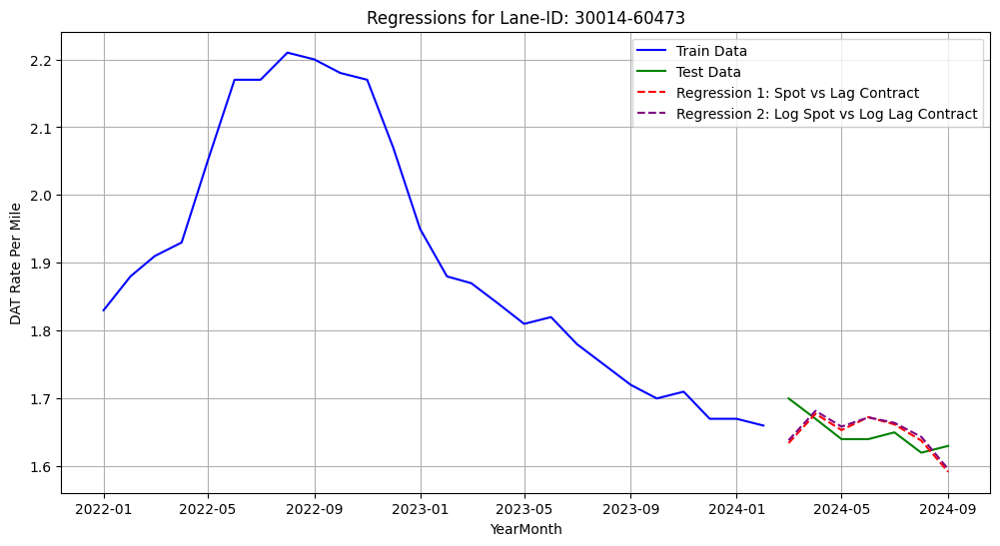


Metrics for Lane-ID: 30014-60473
                                        Model        R²       MSE
0          Regression 1: Spot vs Lag Contract -0.712436  0.001076
1  Regression 2: Log Spot vs Log Lag Contract -0.642826  0.001033

Forecasted Values, Actual Values, and Error Terms for Lane-ID: 30014-60473
   YearMonth  Actual Values  Regression 1 Forecast  Regression 1 Error  \
0 2024-03-01           1.70               1.634194            0.065806   
1 2024-04-01           1.67               1.677441           -0.007441   
2 2024-05-01           1.64               1.653351           -0.013351   
3 2024-06-01           1.64               1.672412           -0.032412   
4 2024-07-01           1.65               1.661828           -0.011828   
5 2024-08-01           1.62               1.637834           -0.017834   
6 2024-09-01           1.63               1.591761            0.038239   

   Regression 2 Forecast  Regression 2 Error  
0               1.638311            0.061689  
1    

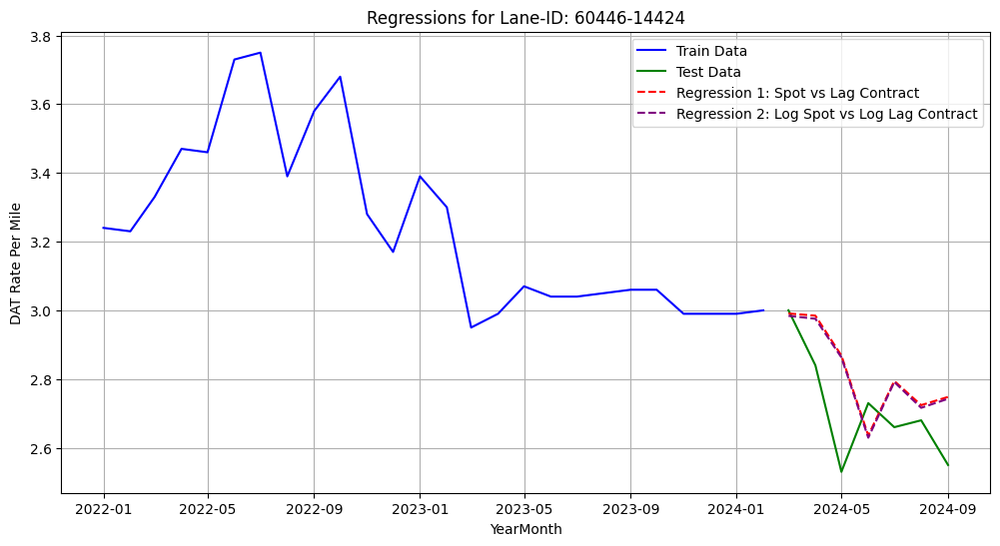


Metrics for Lane-ID: 60446-14424
                                        Model        R²       MSE
0          Regression 1: Spot vs Lag Contract -0.251445  0.029095
1  Regression 2: Log Spot vs Log Lag Contract -0.200675  0.027914

Forecasted Values, Actual Values, and Error Terms for Lane-ID: 60446-14424
   YearMonth  Actual Values  Regression 1 Forecast  Regression 1 Error  \
0 2024-03-01           3.00               2.990833            0.009167   
1 2024-04-01           2.84               2.984551           -0.144551   
2 2024-05-01           2.53               2.868537           -0.338537   
3 2024-06-01           2.73               2.635908            0.094092   
4 2024-07-01           2.66               2.794387           -0.134387   
5 2024-08-01           2.68               2.724112           -0.044112   
6 2024-09-01           2.55               2.748037           -0.198037   

   Regression 2 Forecast  Regression 2 Error  
0               2.984045            0.015955  
1    

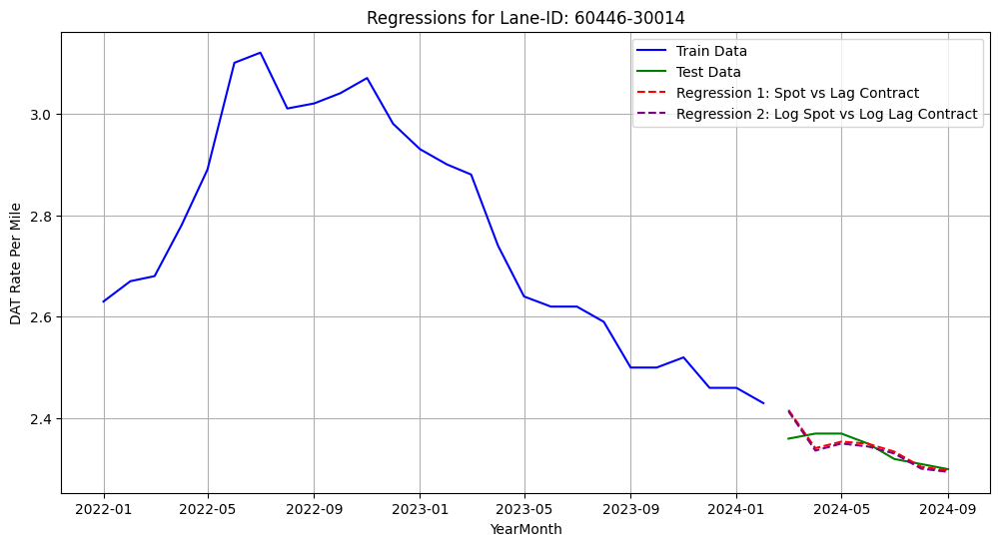


Metrics for Lane-ID: 60446-30014
                                        Model        R²       MSE
0          Regression 1: Spot vs Lag Contract  0.132703  0.000644
1  Regression 2: Log Spot vs Log Lag Contract  0.103432  0.000666

Forecasted Values, Actual Values, and Error Terms for Lane-ID: 60446-30014
   YearMonth  Actual Values  Regression 1 Forecast  Regression 1 Error  \
0 2024-03-01           2.36               2.416506           -0.056506   
1 2024-04-01           2.37               2.341334            0.028666   
2 2024-05-01           2.37               2.354144            0.015856   
3 2024-06-01           2.35               2.349966            0.000034   
4 2024-07-01           2.32               2.334422           -0.014422   
5 2024-08-01           2.31               2.304593            0.005407   
6 2024-09-01           2.30               2.297435            0.002565   

   Regression 2 Forecast  Regression 2 Error  
0               2.413877           -0.053877  
1    

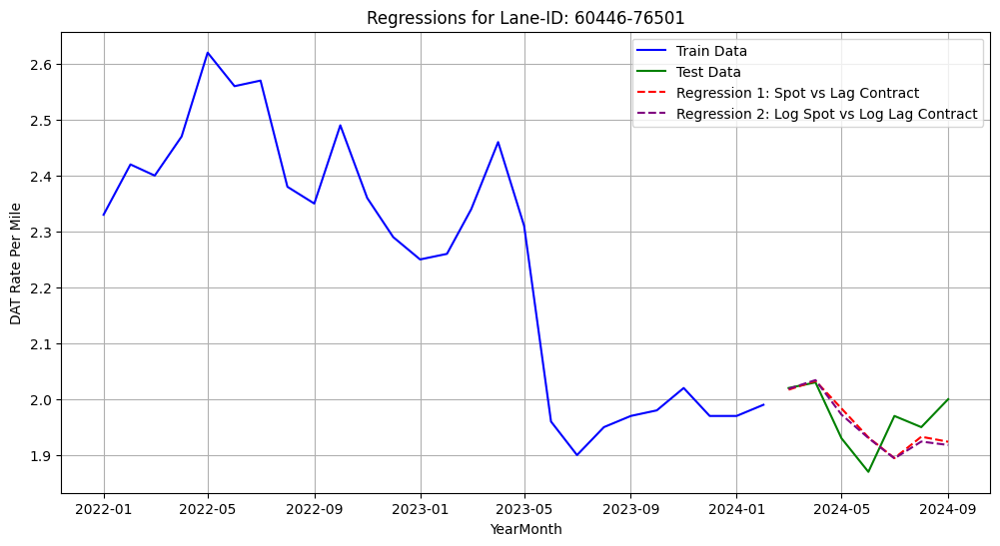


Metrics for Lane-ID: 60446-76501
                                        Model        R²       MSE
0          Regression 1: Spot vs Lag Contract  0.025605  0.002637
1  Regression 2: Log Spot vs Log Lag Contract  0.015947  0.002663

Forecasted Values, Actual Values, and Error Terms for Lane-ID: 60446-76501
   YearMonth  Actual Values  Regression 1 Forecast  Regression 1 Error  \
0 2024-03-01           2.02               2.016949            0.003051   
1 2024-04-01           2.03               2.032694           -0.002694   
2 2024-05-01           1.93               1.983373           -0.053373   
3 2024-06-01           1.87               1.931635           -0.061635   
4 2024-07-01           1.97               1.894536            0.075464   
5 2024-08-01           1.95               1.932820            0.017180   
6 2024-09-01           2.00               1.923818            0.076182   

   Regression 2 Forecast  Regression 2 Error  
0               2.018553            0.001447  
1    

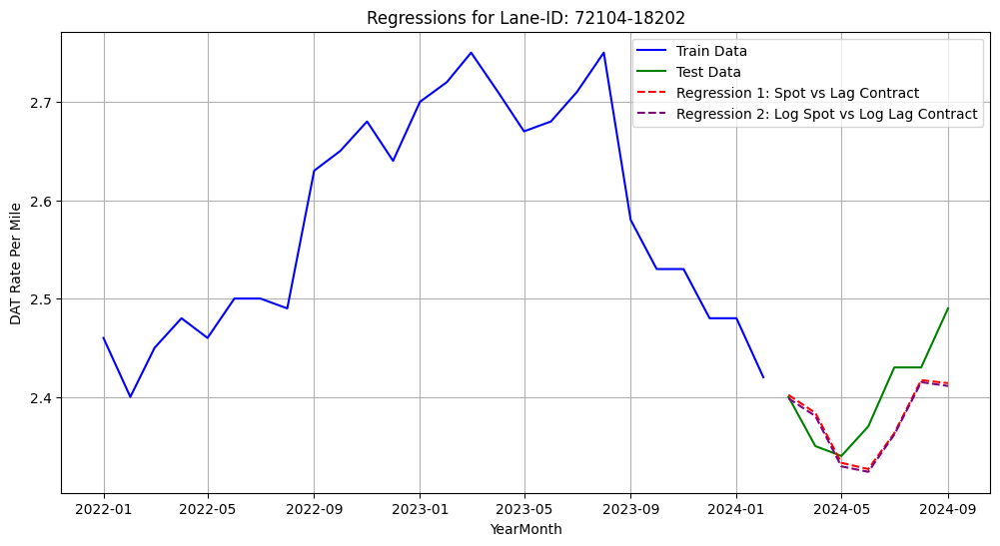


Metrics for Lane-ID: 72104-18202
                                        Model        R²       MSE
0          Regression 1: Spot vs Lag Contract  0.201207  0.001927
1  Regression 2: Log Spot vs Log Lag Contract  0.154469  0.002040

Forecasted Values, Actual Values, and Error Terms for Lane-ID: 72104-18202
   YearMonth  Actual Values  Regression 1 Forecast  Regression 1 Error  \
0 2024-03-01           2.40               2.402046           -0.002046   
1 2024-04-01           2.35               2.383706           -0.033706   
2 2024-05-01           2.34               2.333018            0.006982   
3 2024-06-01           2.37               2.326650            0.043350   
4 2024-07-01           2.43               2.363072            0.066928   
5 2024-08-01           2.43               2.417073            0.012927   
6 2024-09-01           2.49               2.414017            0.075983   

   Regression 2 Forecast  Regression 2 Error  
0               2.398542            0.001458  
1    

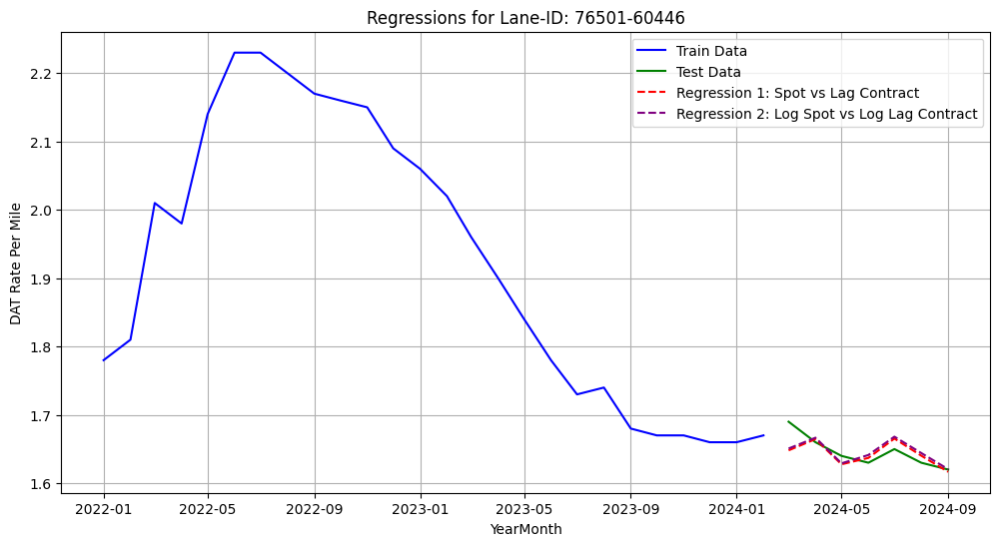


Metrics for Lane-ID: 76501-60446
                                        Model        R²       MSE
0          Regression 1: Spot vs Lag Contract  0.309112  0.000333
1  Regression 2: Log Spot vs Log Lag Contract  0.301128  0.000337

Forecasted Values, Actual Values, and Error Terms for Lane-ID: 76501-60446
   YearMonth  Actual Values  Regression 1 Forecast  Regression 1 Error  \
0 2024-03-01           1.69               1.648139            0.041861   
1 2024-04-01           1.66               1.664594           -0.004594   
2 2024-05-01           1.64               1.627722            0.012278   
3 2024-06-01           1.63               1.637082           -0.007082   
4 2024-07-01           1.65               1.665426           -0.015426   
5 2024-08-01           1.63               1.640290           -0.010290   
6 2024-09-01           1.62               1.616664            0.003336   

   Regression 2 Forecast  Regression 2 Error  
0               1.650814            0.039186  
1    

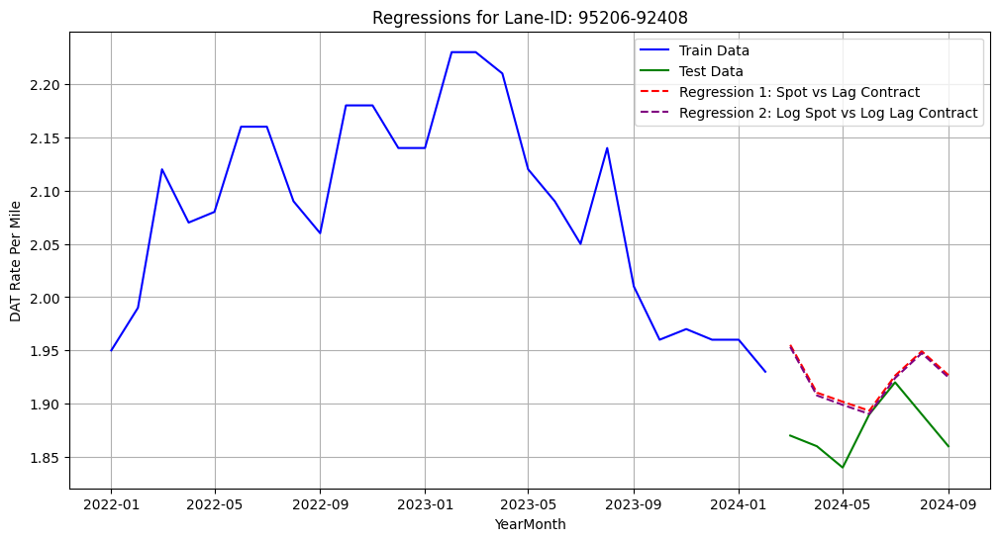


Metrics for Lane-ID: 95206-92408
                                        Model        R²       MSE
0          Regression 1: Spot vs Lag Contract -4.181613  0.003088
1  Regression 2: Log Spot vs Log Lag Contract -3.832644  0.002880

Forecasted Values, Actual Values, and Error Terms for Lane-ID: 95206-92408
   YearMonth  Actual Values  Regression 1 Forecast  Regression 1 Error  \
0 2024-03-01           1.87               1.955158           -0.085158   
1 2024-04-01           1.86               1.910321           -0.050321   
2 2024-05-01           1.84               1.901782           -0.061782   
3 2024-06-01           1.89               1.893324           -0.003324   
4 2024-07-01           1.92               1.926286           -0.006286   
5 2024-08-01           1.89               1.949121           -0.059121   
6 2024-09-01           1.86               1.926842           -0.066842   

   Regression 2 Forecast  Regression 2 Error  
0               1.953221           -0.083221  
1    

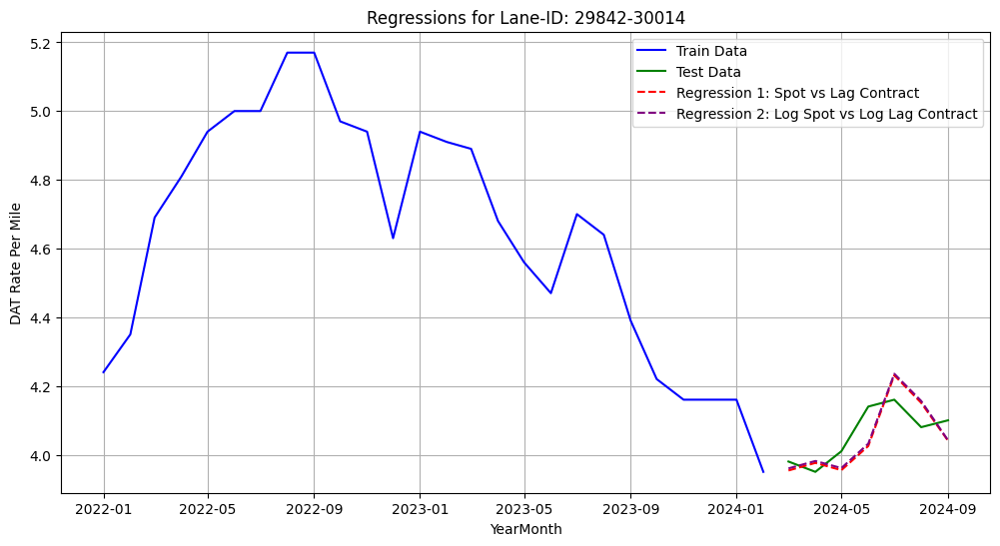


Metrics for Lane-ID: 29842-30014
                                        Model        R²       MSE
0          Regression 1: Spot vs Lag Contract  0.208468  0.004455
1  Regression 2: Log Spot vs Log Lag Contract  0.228659  0.004342

Forecasted Values, Actual Values, and Error Terms for Lane-ID: 29842-30014
   YearMonth  Actual Values  Regression 1 Forecast  Regression 1 Error  \
0 2024-03-01           3.98               3.954028            0.025972   
1 2024-04-01           3.95               3.976126           -0.026126   
2 2024-05-01           4.01               3.954925            0.055075   
3 2024-06-01           4.14               4.025148            0.114852   
4 2024-07-01           4.16               4.230993           -0.070993   
5 2024-08-01           4.08               4.150896           -0.070896   
6 2024-09-01           4.10               4.040514            0.059486   

   Regression 2 Forecast  Regression 2 Error  
0               3.960056            0.019944  
1    

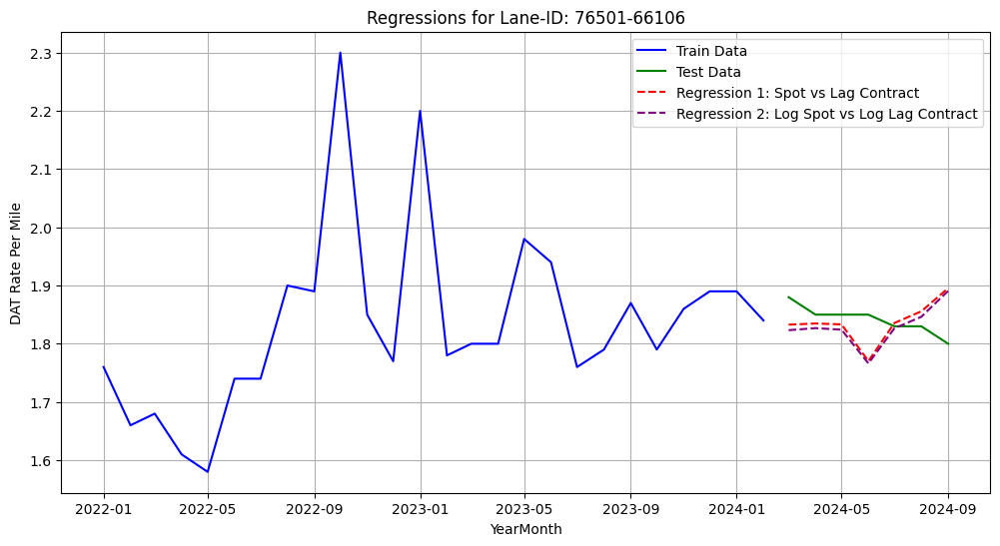


Metrics for Lane-ID: 76501-66106
                                        Model        R²       MSE
0          Regression 1: Spot vs Lag Contract -4.124312  0.002698
1  Regression 2: Log Spot vs Log Lag Contract -4.410441  0.002849

Forecasted Values, Actual Values, and Error Terms for Lane-ID: 76501-66106
   YearMonth  Actual Values  Regression 1 Forecast  Regression 1 Error  \
0 2024-03-01           1.88               1.832804            0.047196   
1 2024-04-01           1.85               1.834770            0.015230   
2 2024-05-01           1.85               1.833295            0.016705   
3 2024-06-01           1.85               1.770237            0.079763   
4 2024-07-01           1.83               1.835631           -0.005631   
5 2024-08-01           1.83               1.855667           -0.025667   
6 2024-09-01           1.80               1.895371           -0.095371   

   Regression 2 Forecast  Regression 2 Error  
0               1.823305            0.056695  
1    

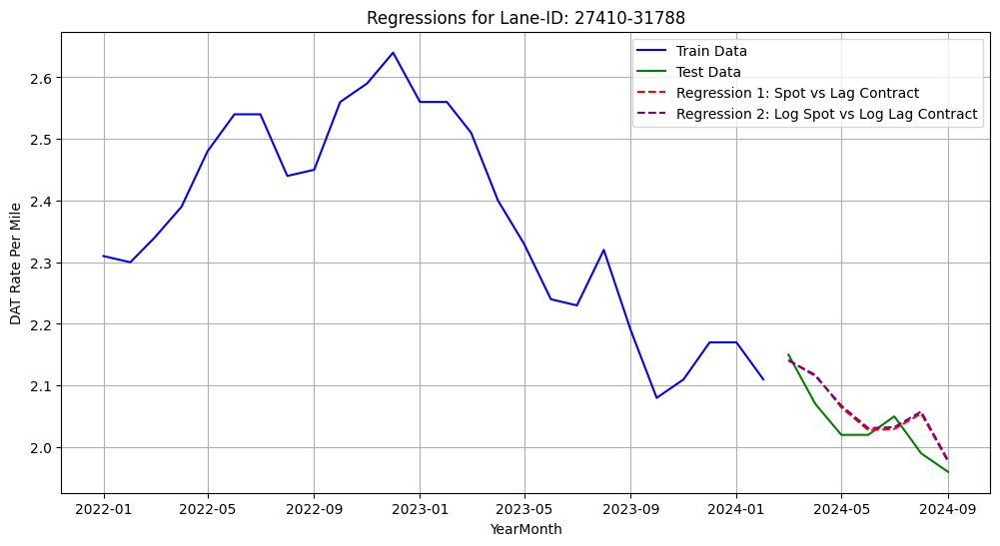


Metrics for Lane-ID: 27410-31788
                                        Model        R²       MSE
0          Regression 1: Spot vs Lag Contract  0.592925  0.001323
1  Regression 2: Log Spot vs Log Lag Contract  0.571571  0.001392

Forecasted Values, Actual Values, and Error Terms for Lane-ID: 27410-31788
   YearMonth  Actual Values  Regression 1 Forecast  Regression 1 Error  \
0 2024-03-01           2.15               2.140358            0.009642   
1 2024-04-01           2.07               2.117462           -0.047462   
2 2024-05-01           2.02               2.064484           -0.044484   
3 2024-06-01           2.02               2.027750           -0.007750   
4 2024-07-01           2.05               2.029525            0.020475   
5 2024-08-01           1.99               2.054640           -0.064640   
6 2024-09-01           1.96               1.976611           -0.016611   

   Regression 2 Forecast  Regression 2 Error  
0               2.141367            0.008633  
1    

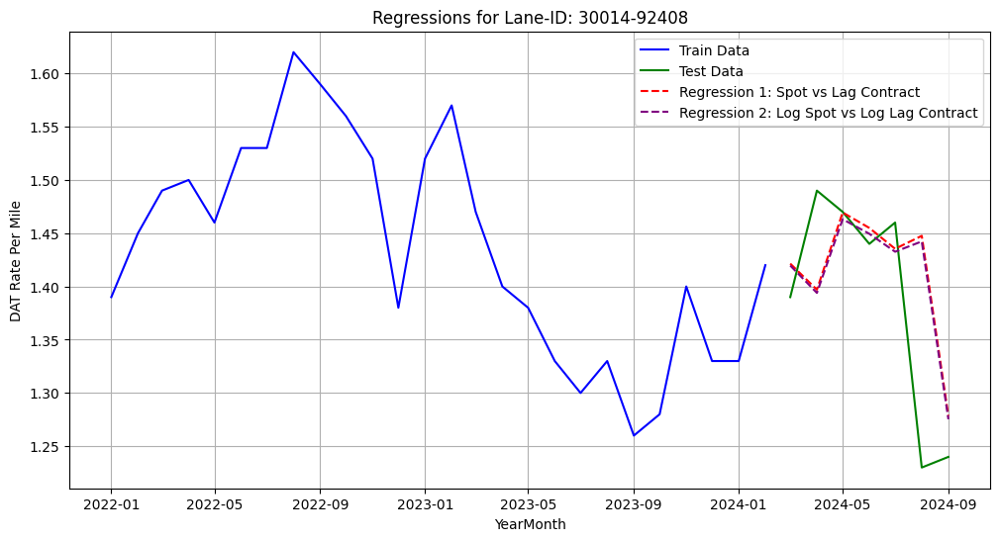


Metrics for Lane-ID: 30014-92408
                                        Model        R²       MSE
0          Regression 1: Spot vs Lag Contract  0.175349  0.008469
1  Regression 2: Log Spot vs Log Lag Contract  0.202748  0.008187

Forecasted Values, Actual Values, and Error Terms for Lane-ID: 30014-92408
   YearMonth  Actual Values  Regression 1 Forecast  Regression 1 Error  \
0 2024-03-01           1.39               1.421450           -0.031450   
1 2024-04-01           1.49               1.396959            0.093041   
2 2024-05-01           1.47               1.469452            0.000548   
3 2024-06-01           1.44               1.454953           -0.014953   
4 2024-07-01           1.46               1.435371            0.024629   
5 2024-08-01           1.23               1.447559           -0.217559   
6 2024-09-01           1.24               1.278371           -0.038371   

   Regression 2 Forecast  Regression 2 Error  
0               1.419631           -0.029631  
1    

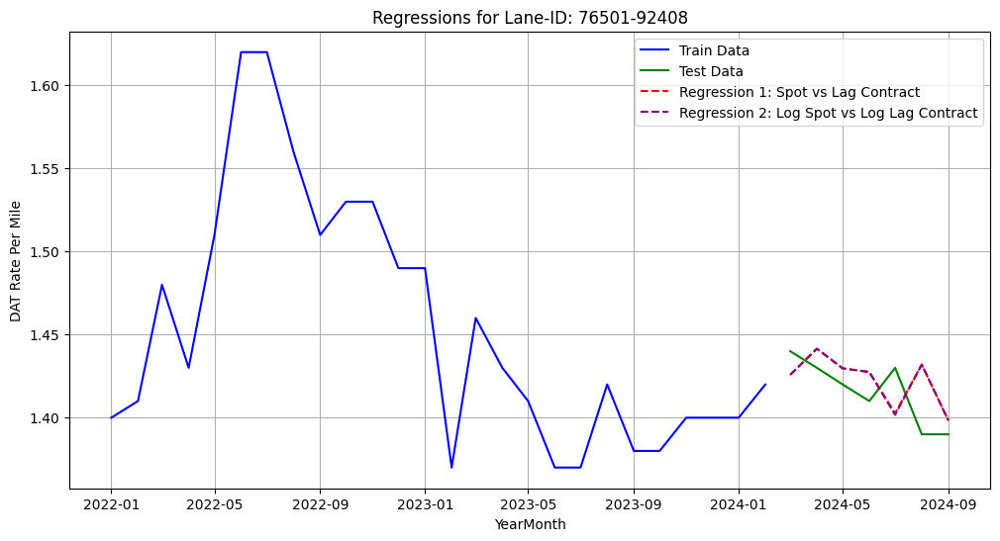


Metrics for Lane-ID: 76501-92408
                                        Model        R²       MSE
0          Regression 1: Spot vs Lag Contract -0.399793  0.000474
1  Regression 2: Log Spot vs Log Lag Contract -0.416360  0.000480

Forecasted Values, Actual Values, and Error Terms for Lane-ID: 76501-92408
   YearMonth  Actual Values  Regression 1 Forecast  Regression 1 Error  \
0 2024-03-01           1.44               1.425855            0.014145   
1 2024-04-01           1.43               1.441579           -0.011579   
2 2024-05-01           1.42               1.429737           -0.009737   
3 2024-06-01           1.41               1.427561           -0.017561   
4 2024-07-01           1.43               1.402641            0.027359   
5 2024-08-01           1.39               1.432011           -0.042011   
6 2024-09-01           1.39               1.398288           -0.008288   

   Regression 2 Forecast  Regression 2 Error  
0               1.425794            0.014206  
1    

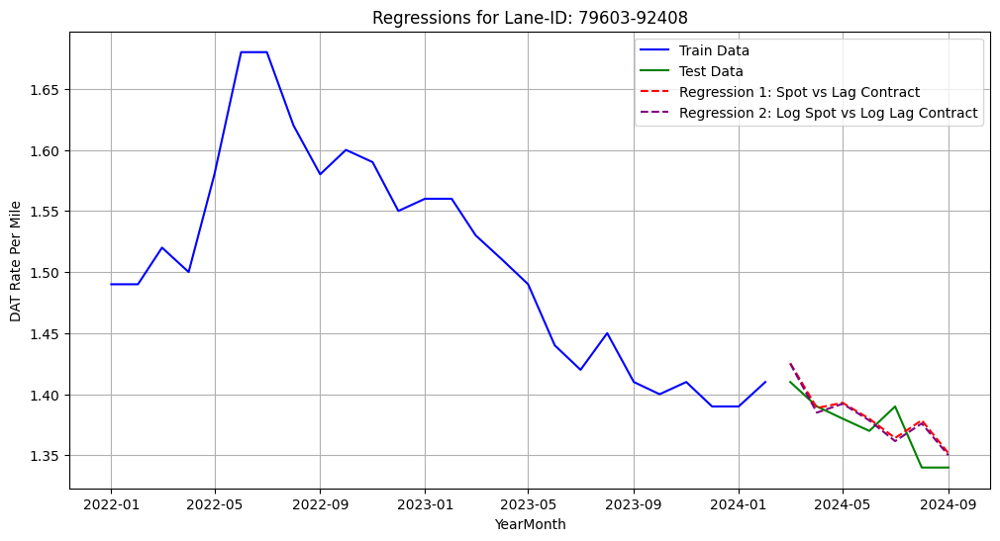


Metrics for Lane-ID: 79603-92408
                                        Model        R²       MSE
0          Regression 1: Spot vs Lag Contract  0.326110  0.000402
1  Regression 2: Log Spot vs Log Lag Contract  0.356855  0.000383

Forecasted Values, Actual Values, and Error Terms for Lane-ID: 79603-92408
   YearMonth  Actual Values  Regression 1 Forecast  Regression 1 Error  \
0 2024-03-01           1.41               1.425428           -0.015428   
1 2024-04-01           1.39               1.388749            0.001251   
2 2024-05-01           1.38               1.393013           -0.013013   
3 2024-06-01           1.37               1.379937           -0.009937   
4 2024-07-01           1.39               1.364177            0.025823   
5 2024-08-01           1.34               1.378699           -0.038699   
6 2024-09-01           1.34               1.351787           -0.011787   

   Regression 2 Forecast  Regression 2 Error  
0               1.425055           -0.015055  
1    

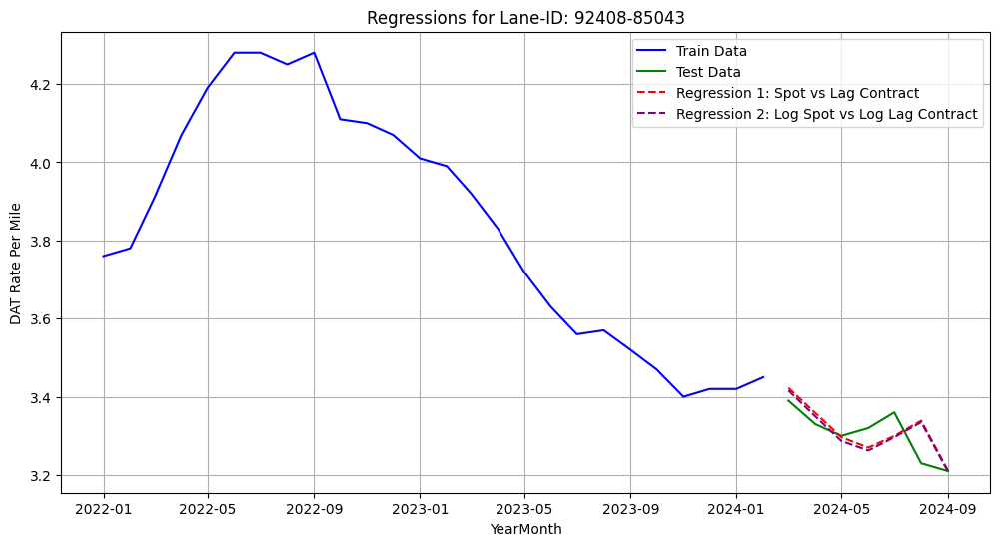


Metrics for Lane-ID: 92408-85043
                                        Model        R²       MSE
0          Regression 1: Spot vs Lag Contract  0.229763  0.002836
1  Regression 2: Log Spot vs Log Lag Contract  0.239210  0.002801

Forecasted Values, Actual Values, and Error Terms for Lane-ID: 92408-85043
   YearMonth  Actual Values  Regression 1 Forecast  Regression 1 Error  \
0 2024-03-01           3.39               3.422797           -0.032797   
1 2024-04-01           3.33               3.358469           -0.028469   
2 2024-05-01           3.30               3.296574            0.003426   
3 2024-06-01           3.32               3.270130            0.049870   
4 2024-07-01           3.36               3.299847            0.060153   
5 2024-08-01           3.23               3.338838           -0.108838   
6 2024-09-01           3.21               3.211021           -0.001021   

   Regression 2 Forecast  Regression 2 Error  
0               3.416184           -0.026184  
1    

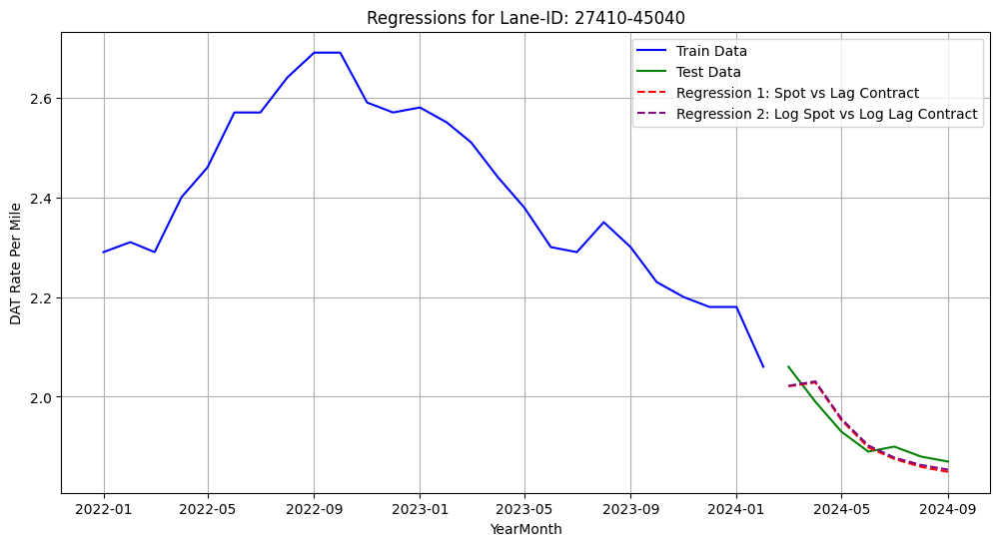


Metrics for Lane-ID: 27410-45040
                                        Model        R²       MSE
0          Regression 1: Spot vs Lag Contract  0.824638  0.000729
1  Regression 2: Log Spot vs Log Lag Contract  0.829098  0.000710

Forecasted Values, Actual Values, and Error Terms for Lane-ID: 27410-45040
   YearMonth  Actual Values  Regression 1 Forecast  Regression 1 Error  \
0 2024-03-01           2.06               2.020850            0.039150   
1 2024-04-01           1.99               2.028570           -0.038570   
2 2024-05-01           1.93               1.953382           -0.023382   
3 2024-06-01           1.89               1.898398           -0.008398   
4 2024-07-01           1.90               1.875286            0.024714   
5 2024-08-01           1.88               1.859325            0.020675   
6 2024-09-01           1.87               1.849394            0.020606   

   Regression 2 Forecast  Regression 2 Error  
0               2.022019            0.037981  
1    

In [75]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score

# Function to perform regressions, plot results, and print forecast details
def regression_comparison(df, lane_id):
    # Ensure 'YearMonth' is datetime and sort by it
    df['YearMonth'] = pd.to_datetime(df['YearMonth'])
    df = df.sort_values('YearMonth').reset_index(drop=True)

    # Drop missing values
    df = df.dropna(subset=['DAT Rate Per Mile', 'Dt Spot RPM'])

    # Add lagged contract rate (1 period)
    df['Lag_Contract_Rate'] = df['DAT Rate Per Mile'].shift(1)

    # Drop the first row with NaN after lagging
    df = df.dropna().reset_index(drop=True)

    # Extract spot rate and lagged contract rate
    X = df[['Lag_Contract_Rate', 'Dt Spot RPM']]
    y = df['DAT Rate Per Mile']

    # Split data into 80% train and 20% test
    train_size = int(len(df) * 0.8)
    X_train, X_test = X[:train_size], X[train_size:]
    y_train, y_test = y[:train_size], y[train_size:]

    # 1. Linear Regression on Spot Rate and Lagged Contract Rate
    model1 = LinearRegression()
    model1.fit(X_train, y_train)
    y_pred1 = model1.predict(X_test)

    # Calculate metrics for Regression 1
    mse1 = mean_squared_error(y_test, y_pred1)
    r2_1 = r2_score(y_test, y_pred1)

    # 2. Linear Regression on log Spot Rate and Log Lagged Contract Rate
    X_log = np.log(df[['Lag_Contract_Rate', 'Dt Spot RPM']])
    y_log = np.log(df['DAT Rate Per Mile'])

    X_train_log, X_test_log = X_log[:train_size], X_log[train_size:]
    y_train_log, y_test_log = y_log[:train_size], y_log[train_size:]

    model2 = LinearRegression()
    model2.fit(X_train_log, y_train_log)
    y_pred_log = model2.predict(X_test_log)

    # Inverse log transformation for predictions
    y_pred2 = np.exp(y_pred_log)

    # Calculate metrics for Regression 2
    mse2 = mean_squared_error(y_test, y_pred2)
    r2_2 = r2_score(y_test, y_pred2)

    # Plot train, test, and predictions
    plt.figure(figsize=(12, 6))

    # Plot actual train data
    plt.plot(df['YearMonth'][:train_size], y_train, label='Train Data', color='blue')

    # Plot actual test data
    plt.plot(df['YearMonth'][train_size:], y_test, label='Test Data', color='green')

    # Plot predictions from Regression 1
    plt.plot(df['YearMonth'][train_size:], y_pred1, label='Regression 1: Spot vs Lag Contract', color='red', linestyle='--')

    # Plot predictions from Regression 2
    plt.plot(df['YearMonth'][train_size:], y_pred2, label='Regression 2: Log Spot vs Log Lag Contract', color='purple', linestyle='--')

    plt.xlabel('YearMonth')
    plt.ylabel('DAT Rate Per Mile')
    plt.title(f'Regressions for Lane-ID: {lane_id}')
    plt.legend()
    plt.grid(True)
    plt.show()

    # Print metrics in table format
    metrics = pd.DataFrame({
        'Model': ['Regression 1: Spot vs Lag Contract', 'Regression 2: Log Spot vs Log Lag Contract'],
        'R²': [r2_1, r2_2],
        'MSE': [mse1, mse2]
    })

    print(f"\nMetrics for Lane-ID: {lane_id}")
    print(metrics)

    # Create DataFrame for forecasted values, actual values, and error terms
    results_df = pd.DataFrame({
        'YearMonth': df['YearMonth'][train_size:].reset_index(drop=True),
        'Actual Values': y_test.reset_index(drop=True),
        'Regression 1 Forecast': y_pred1,
        'Regression 1 Error': y_test.reset_index(drop=True) - y_pred1,
        'Regression 2 Forecast': y_pred2,
        'Regression 2 Error': y_test.reset_index(drop=True) - y_pred2
    })

    print(f"\nForecasted Values, Actual Values, and Error Terms for Lane-ID: {lane_id}")
    print(results_df.head(10))  # Print first 10 rows for readability

# Example call for one lane
for lane_id, df in top_10_dfs.items():
    regression_comparison(df, lane_id)


Lane-ID: 27410-28504 - MSE: 0.2920
Forecast Results for Lane-ID: 27410-28504
   YearMonth  Actual  Forecast     Error
0 2024-03-01    3.49  3.230954  0.259046
1 2024-04-01    3.50  3.003110  0.496890
2 2024-05-01    3.45  2.879814  0.570186
3 2024-06-01    3.40  2.704647  0.695353
4 2024-07-01    3.36  2.704636  0.655364
5 2024-08-01    3.33  2.857199  0.472801
6 2024-09-01    3.36  2.841976  0.518024


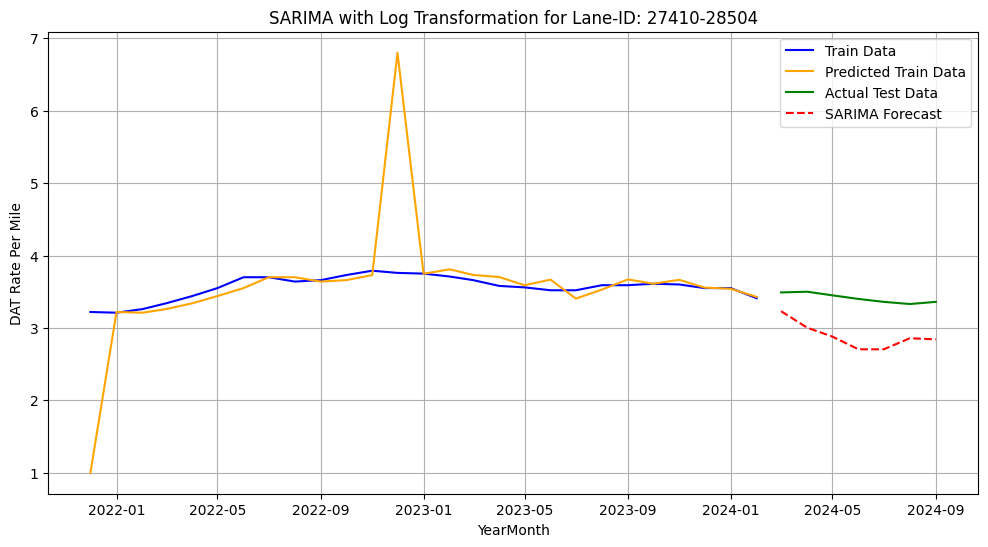

Lane-ID: 76501-78130 - MSE: 0.1198
Forecast Results for Lane-ID: 76501-78130
   YearMonth  Actual  Forecast     Error
0 2024-03-01    5.07  5.112602 -0.042602
1 2024-04-01    4.95  5.211130 -0.261130
2 2024-05-01    4.99  5.134364 -0.144364
3 2024-06-01    4.97  5.424468 -0.454468
4 2024-07-01    4.86  5.341125 -0.481125
5 2024-08-01    4.88  5.163915 -0.283915
6 2024-09-01    4.80  5.278601 -0.478601


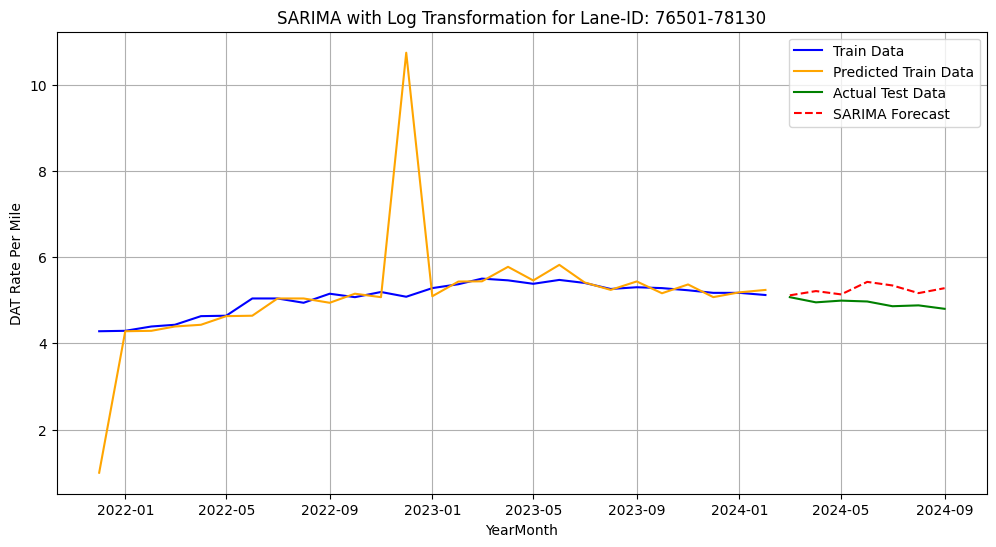

Lane-ID: 30014-14424 - MSE: 0.0297
Forecast Results for Lane-ID: 30014-14424
   YearMonth  Actual  Forecast     Error
0 2024-03-01    2.18  2.125534  0.054466
1 2024-04-01    2.18  2.155050  0.024950
2 2024-05-01    2.18  2.173186  0.006814
3 2024-06-01    2.14  2.270266 -0.130266
4 2024-07-01    2.08  2.298614 -0.218614
5 2024-08-01    2.02  2.289037 -0.269037
6 2024-09-01    2.02  2.279635 -0.259635


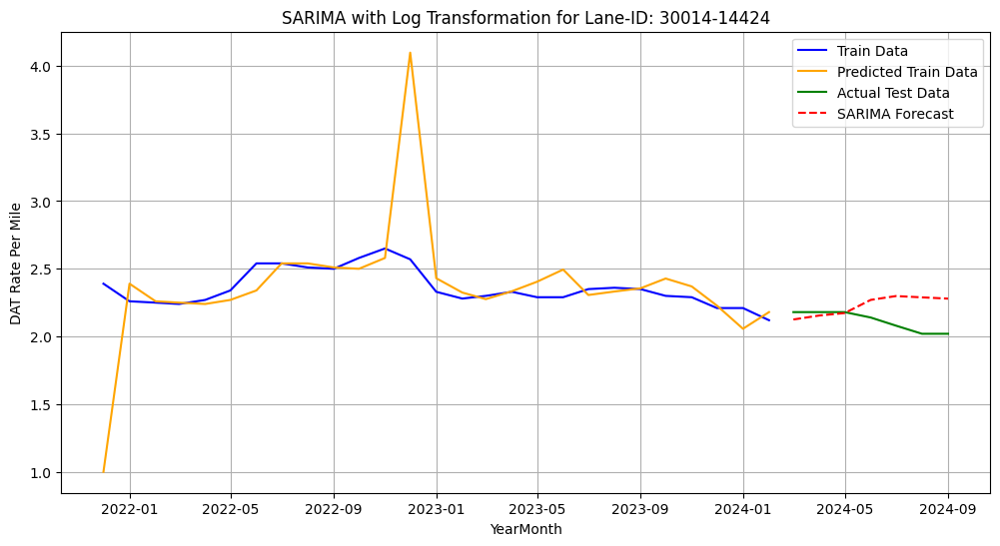

Lane-ID: 30014-32063 - MSE: 0.0052
Forecast Results for Lane-ID: 30014-32063
   YearMonth  Actual  Forecast     Error
0 2024-03-01    3.22  3.124324  0.095676
1 2024-04-01    3.16  3.169963 -0.009963
2 2024-05-01    3.13  3.173406 -0.043406
3 2024-06-01    3.13  3.135153 -0.005153
4 2024-07-01    3.13  3.077754  0.052246
5 2024-08-01    3.11  3.013625  0.096375
6 2024-09-01    3.10  2.984605  0.115395


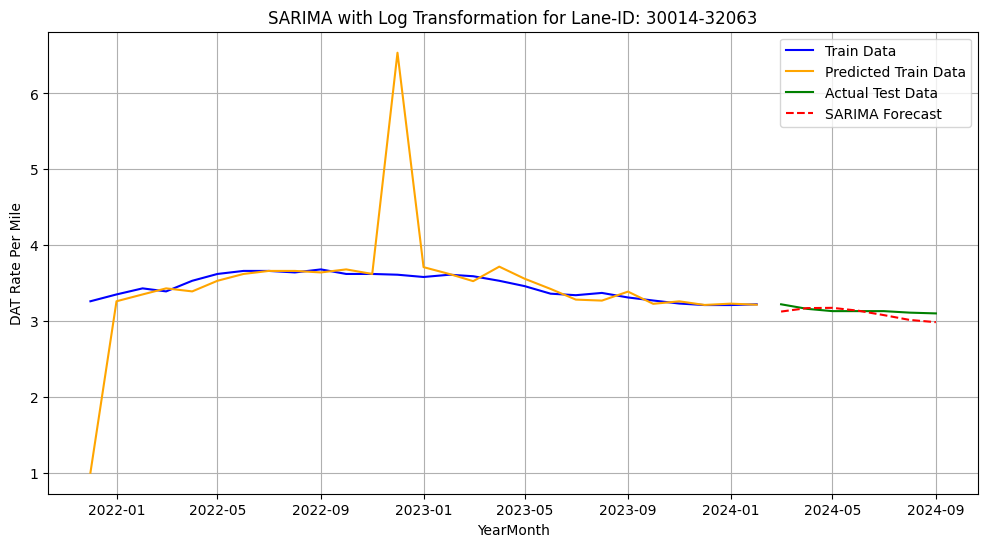

Lane-ID: 30014-60446 - MSE: 0.0292
Forecast Results for Lane-ID: 30014-60446
   YearMonth  Actual  Forecast     Error
0 2024-03-01    1.70  1.679987  0.020013
1 2024-04-01    1.66  1.676518 -0.016518
2 2024-05-01    1.64  1.762306 -0.122306
3 2024-06-01    1.64  1.848666 -0.208666
4 2024-07-01    1.64  1.838815 -0.198815
5 2024-08-01    1.62  1.856766 -0.236766
6 2024-09-01    1.63  1.853219 -0.223219


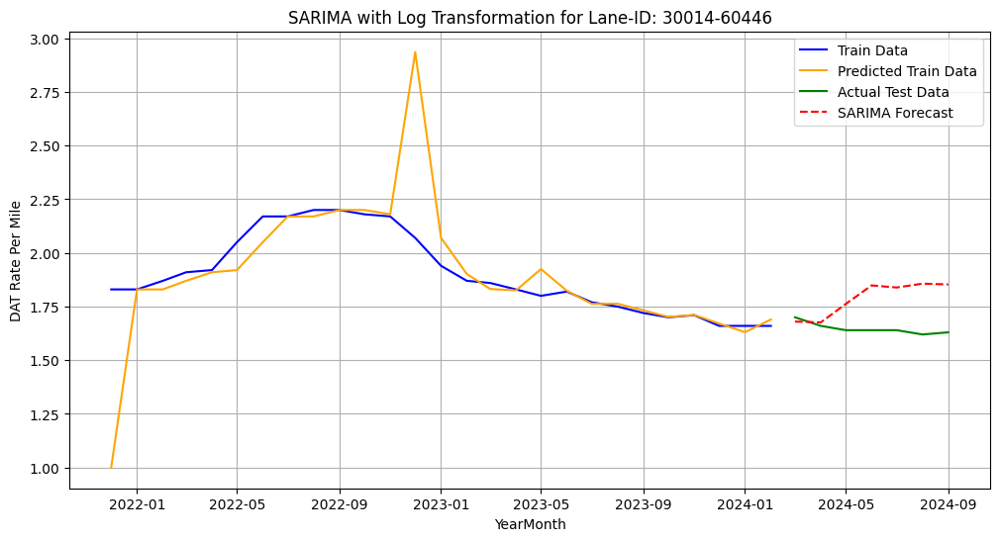

Lane-ID: 30014-60473 - MSE: 0.0129
Forecast Results for Lane-ID: 30014-60473
   YearMonth  Actual  Forecast     Error
0 2024-03-01    1.70  1.673296  0.026704
1 2024-04-01    1.67  1.673838 -0.003838
2 2024-05-01    1.64  1.722863 -0.082863
3 2024-06-01    1.64  1.786874 -0.146874
4 2024-07-01    1.65  1.773180 -0.123180
5 2024-08-01    1.62  1.782561 -0.162561
6 2024-09-01    1.63  1.769198 -0.139198


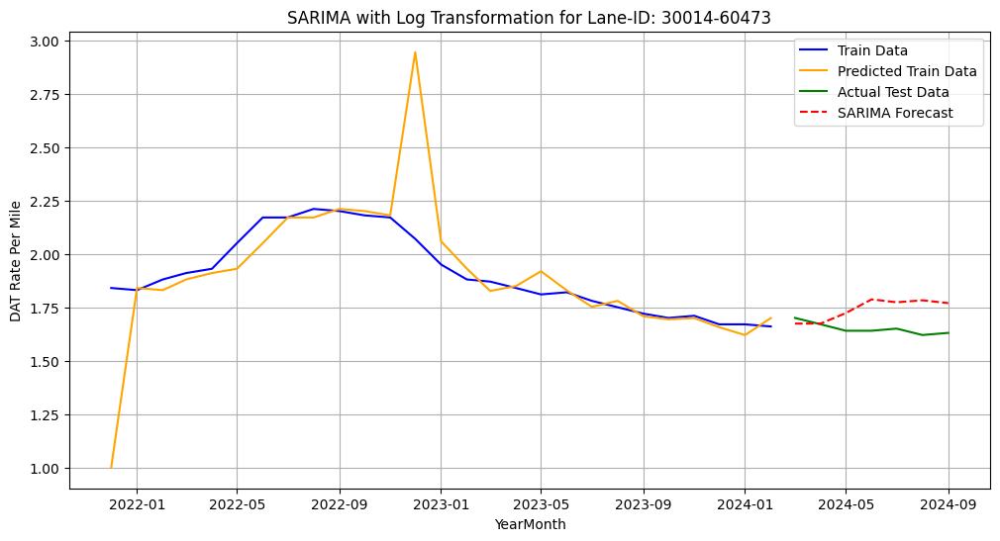

Lane-ID: 60446-14424 - MSE: 0.2877
Forecast Results for Lane-ID: 60446-14424
   YearMonth  Actual  Forecast     Error
0 2024-03-01    3.00  3.030070 -0.030070
1 2024-04-01    2.84  3.144897 -0.304897
2 2024-05-01    2.53  3.149595 -0.619595
3 2024-06-01    2.73  3.352786 -0.622786
4 2024-07-01    2.66  3.368087 -0.708087
5 2024-08-01    2.68  3.092264 -0.412264
6 2024-09-01    2.55  3.240736 -0.690736


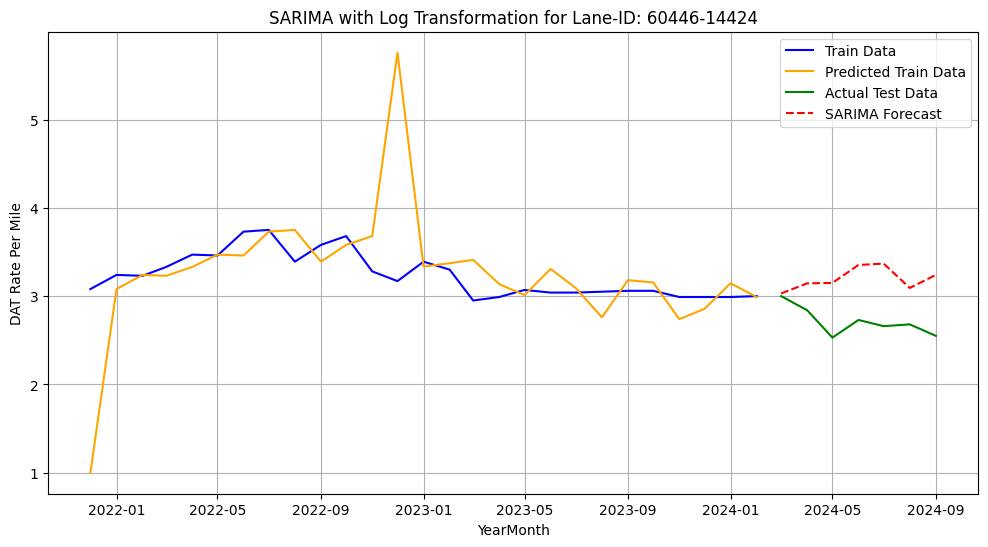

Lane-ID: 60446-30014 - MSE: 0.0528
Forecast Results for Lane-ID: 60446-30014
   YearMonth  Actual  Forecast     Error
0 2024-03-01    2.36  2.401494 -0.041494
1 2024-04-01    2.37  2.442967 -0.072967
2 2024-05-01    2.37  2.502282 -0.132282
3 2024-06-01    2.35  2.649734 -0.299734
4 2024-07-01    2.32  2.659781 -0.339781
5 2024-08-01    2.31  2.571505 -0.261505
6 2024-09-01    2.30  2.567371 -0.267371


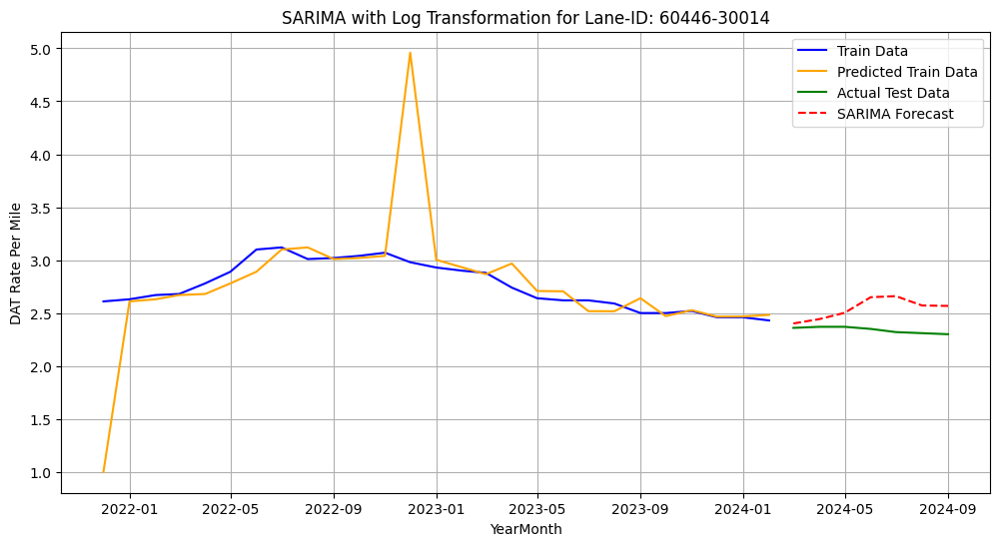

Lane-ID: 60446-76501 - MSE: 0.0148
Forecast Results for Lane-ID: 60446-76501
   YearMonth  Actual  Forecast     Error
0 2024-03-01    2.02  1.952160  0.067840
1 2024-04-01    2.03  2.019885  0.010115
2 2024-05-01    1.93  2.128532 -0.198532
3 2024-06-01    1.87  2.068999 -0.198999
4 2024-07-01    1.97  2.073723 -0.103723
5 2024-08-01    1.95  1.928568  0.021432
6 2024-09-01    2.00  1.906145  0.093855


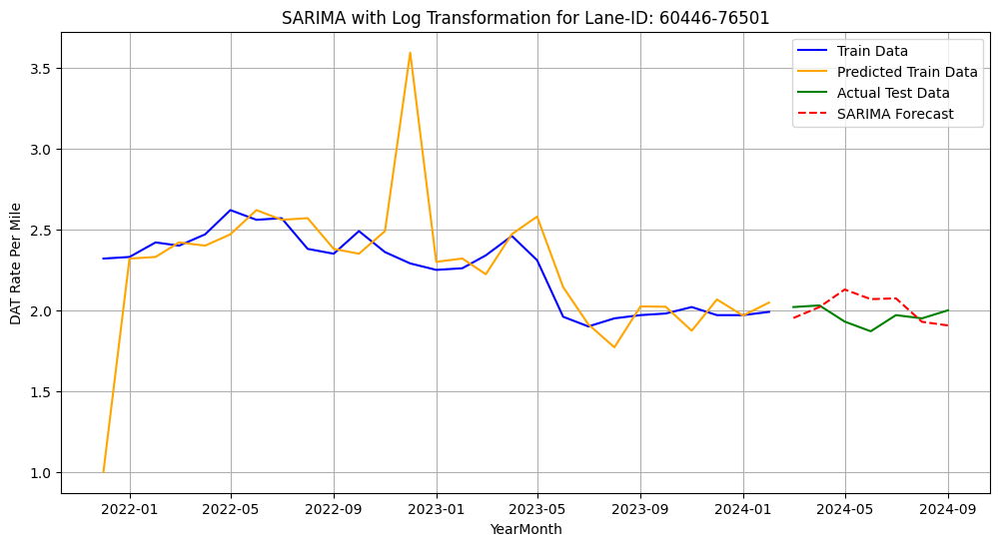

Lane-ID: 72104-18202 - MSE: 0.0072
Forecast Results for Lane-ID: 72104-18202
   YearMonth  Actual  Forecast     Error
0 2024-03-01    2.40  2.466955 -0.066955
1 2024-04-01    2.35  2.472022 -0.122022
2 2024-05-01    2.34  2.447727 -0.107727
3 2024-06-01    2.37  2.476425 -0.106425
4 2024-07-01    2.43  2.486071 -0.056071
5 2024-08-01    2.43  2.491919 -0.061919
6 2024-09-01    2.49  2.527739 -0.037739


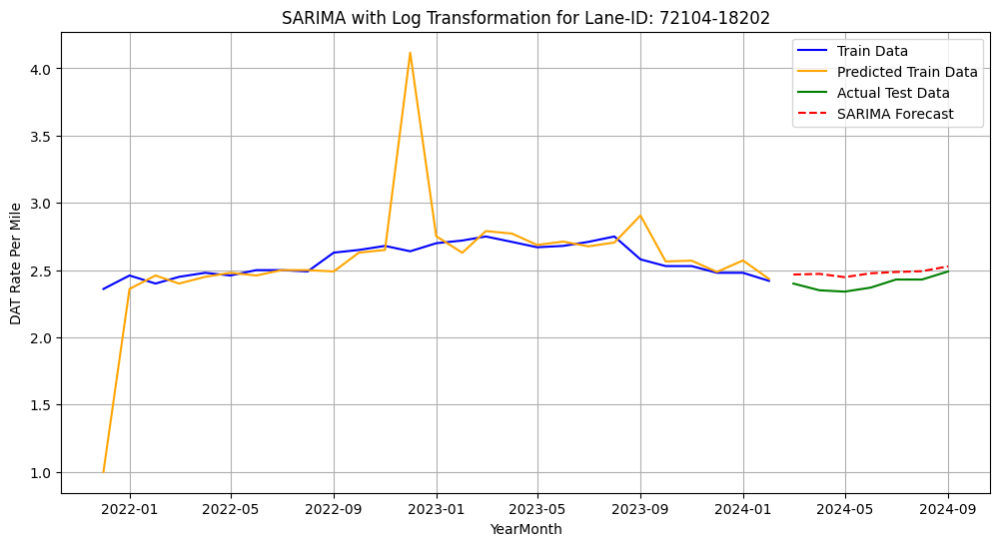

Lane-ID: 76501-60446 - MSE: 0.0829
Forecast Results for Lane-ID: 76501-60446
   YearMonth  Actual  Forecast     Error
0 2024-03-01    1.69  1.836929 -0.146929
1 2024-04-01    1.66  1.797352 -0.137352
2 2024-05-01    1.64  1.928806 -0.288806
3 2024-06-01    1.63  1.998698 -0.368698
4 2024-07-01    1.65  1.990842 -0.340842
5 2024-08-01    1.63  1.959632 -0.329632
6 2024-09-01    1.62  1.929251 -0.309251


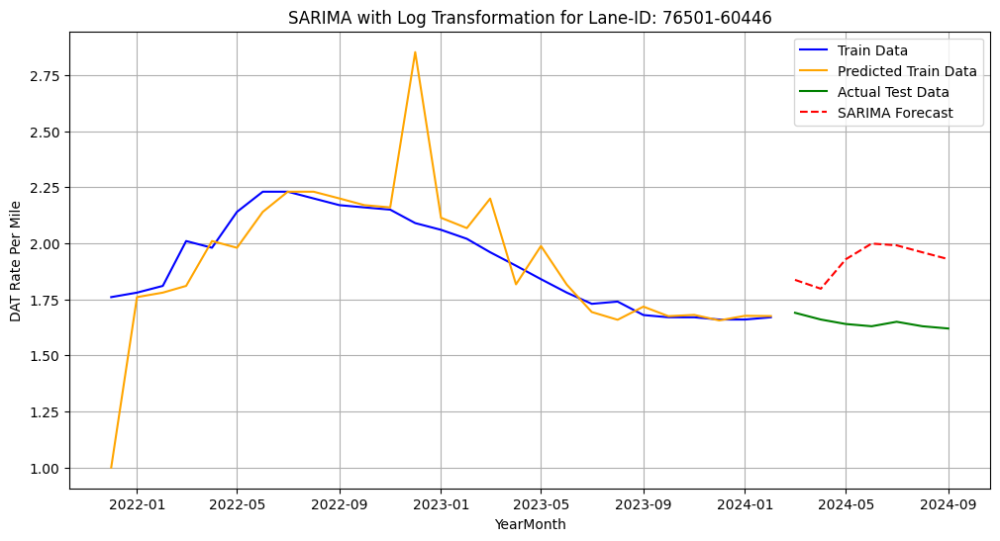

Lane-ID: 95206-92408 - MSE: 0.0157
Forecast Results for Lane-ID: 95206-92408
   YearMonth  Actual  Forecast     Error
0 2024-03-01    1.87  2.030875 -0.160875
1 2024-04-01    1.86  1.989760 -0.129760
2 2024-05-01    1.84  1.979425 -0.139425
3 2024-06-01    1.89  2.032535 -0.142535
4 2024-07-01    1.92  2.024042 -0.104042
5 2024-08-01    1.89  1.990932 -0.100932
6 2024-09-01    1.86  1.941956 -0.081956


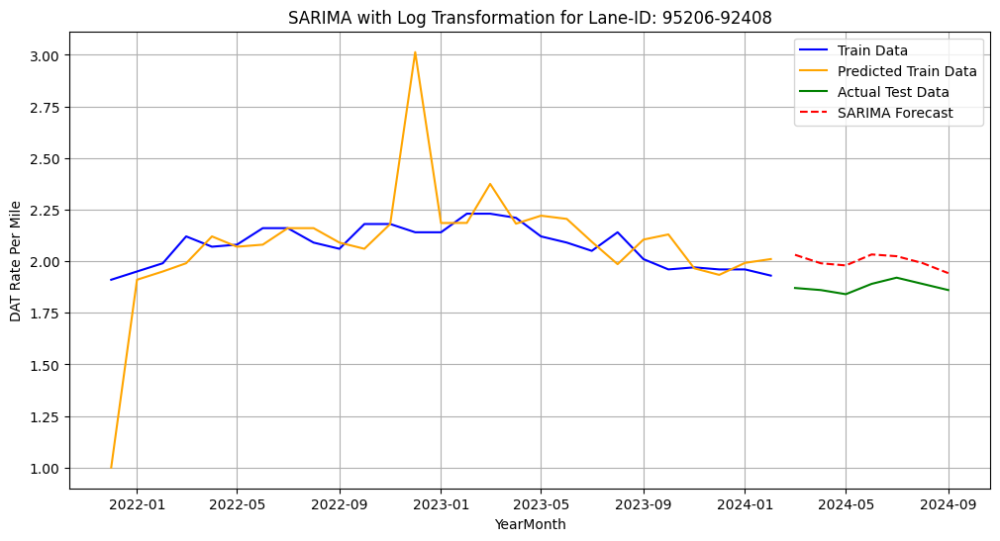

Lane-ID: 29842-30014 - MSE: 0.0286
Forecast Results for Lane-ID: 29842-30014
   YearMonth  Actual  Forecast     Error
0 2024-03-01    3.98  4.062237 -0.082237
1 2024-04-01    3.95  3.936313  0.013687
2 2024-05-01    4.01  3.904896  0.105104
3 2024-06-01    4.14  3.852555  0.287445
4 2024-07-01    4.16  4.001519  0.158481
5 2024-08-01    4.08  3.996896  0.083104
6 2024-09-01    4.10  3.840709  0.259291


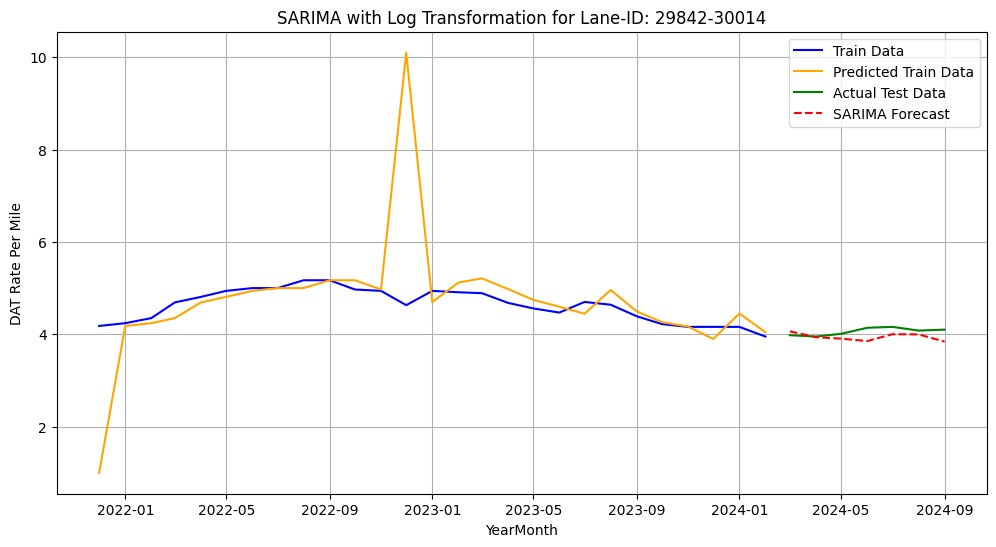

Lane-ID: 76501-66106 - MSE: 0.0146
Forecast Results for Lane-ID: 76501-66106
   YearMonth  Actual  Forecast     Error
0 2024-03-01    1.88  1.790087  0.089913
1 2024-04-01    1.85  1.714142  0.135858
2 2024-05-01    1.85  1.704276  0.145724
3 2024-06-01    1.85  1.849984  0.000016
4 2024-07-01    1.83  1.828060  0.001940
5 2024-08-01    1.83  1.978913 -0.148913
6 2024-09-01    1.80  1.980499 -0.180499


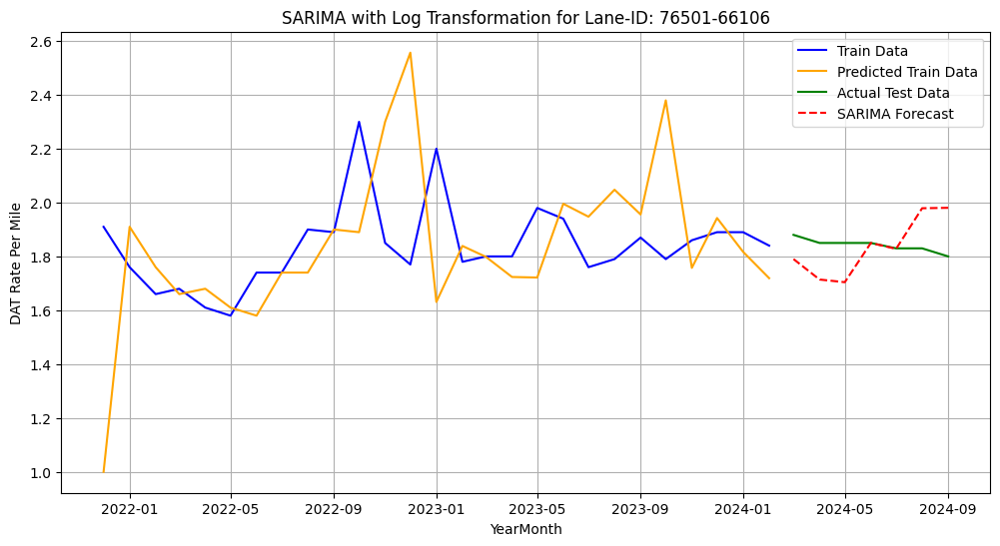

Lane-ID: 27410-31788 - MSE: 0.0402
Forecast Results for Lane-ID: 27410-31788
   YearMonth  Actual  Forecast     Error
0 2024-03-01    2.15  2.126350  0.023650
1 2024-04-01    2.07  2.167471 -0.097471
2 2024-05-01    2.02  2.236300 -0.216300
3 2024-06-01    2.02  2.281138 -0.261138
4 2024-07-01    2.05  2.280016 -0.230016
5 2024-08-01    1.99  2.202861 -0.212861
6 2024-09-01    1.96  2.201829 -0.241829


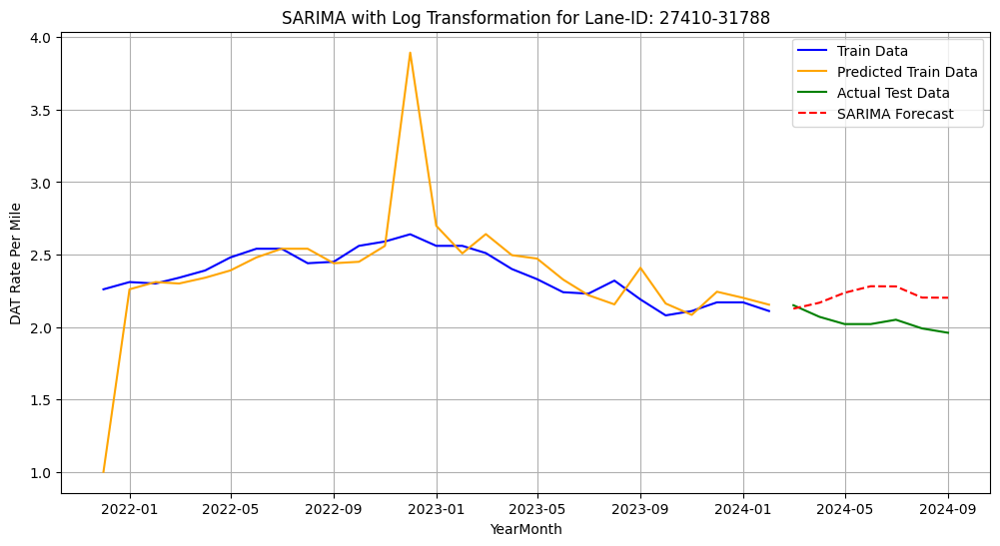

Lane-ID: 30014-92408 - MSE: 0.0290
Forecast Results for Lane-ID: 30014-92408
   YearMonth  Actual  Forecast     Error
0 2024-03-01    1.39  1.464551 -0.074551
1 2024-04-01    1.49  1.458158  0.031842
2 2024-05-01    1.47  1.425768  0.044232
3 2024-06-01    1.44  1.480793 -0.040793
4 2024-07-01    1.46  1.479340 -0.019340
5 2024-08-01    1.23  1.561262 -0.331262
6 2024-09-01    1.24  1.527606 -0.287606


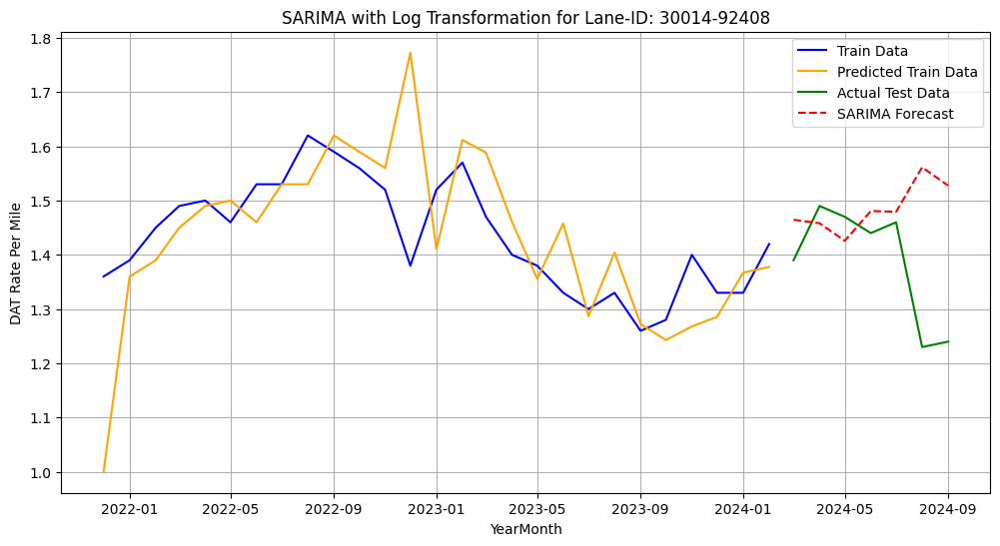

Lane-ID: 76501-92408 - MSE: 0.0215
Forecast Results for Lane-ID: 76501-92408
   YearMonth  Actual  Forecast     Error
0 2024-03-01    1.44  1.493061 -0.053061
1 2024-04-01    1.43  1.441400 -0.011400
2 2024-05-01    1.42  1.521554 -0.101554
3 2024-06-01    1.41  1.629041 -0.219041
4 2024-07-01    1.43  1.629603 -0.199603
5 2024-08-01    1.39  1.570713 -0.180713
6 2024-09-01    1.39  1.520612 -0.130612


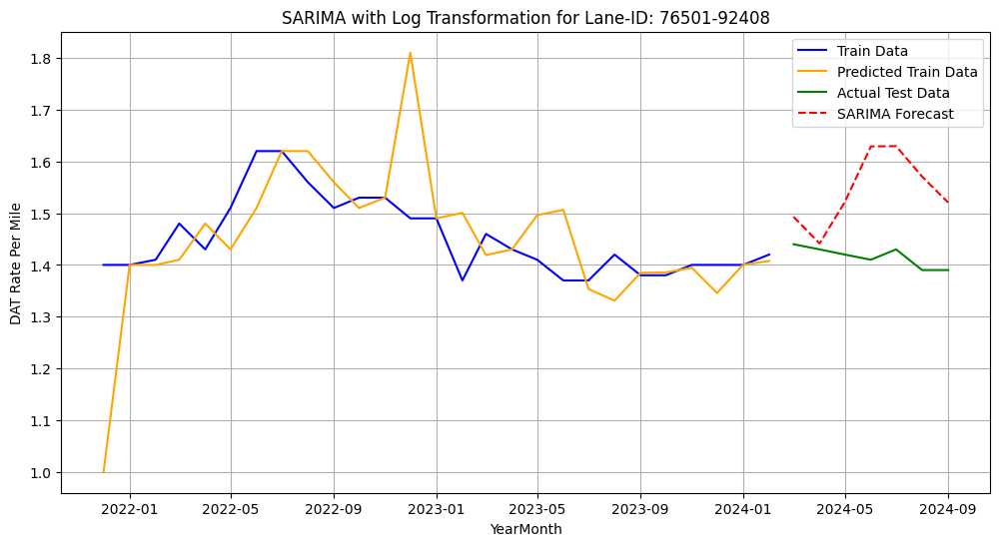

Lane-ID: 79603-92408 - MSE: 0.0231
Forecast Results for Lane-ID: 79603-92408
   YearMonth  Actual  Forecast     Error
0 2024-03-01    1.41  1.448020 -0.038020
1 2024-04-01    1.39  1.427536 -0.037536
2 2024-05-01    1.38  1.498592 -0.118592
3 2024-06-01    1.37  1.585285 -0.215285
4 2024-07-01    1.39  1.584100 -0.194100
5 2024-08-01    1.34  1.532221 -0.192221
6 2024-09-01    1.34  1.494142 -0.154142


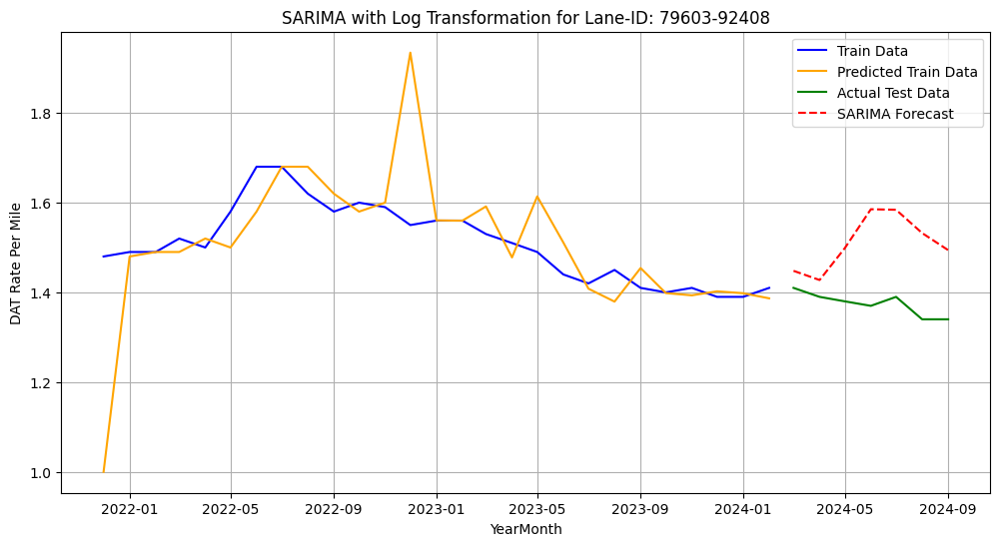

Lane-ID: 92408-85043 - MSE: 0.2552
Forecast Results for Lane-ID: 92408-85043
   YearMonth  Actual  Forecast     Error
0 2024-03-01    3.39  3.559242 -0.169242
1 2024-04-01    3.33  3.693094 -0.363094
2 2024-05-01    3.30  3.791819 -0.491819
3 2024-06-01    3.32  3.866677 -0.546677
4 2024-07-01    3.36  3.867213 -0.507213
5 2024-08-01    3.23  3.848478 -0.618478
6 2024-09-01    3.21  3.877464 -0.667464


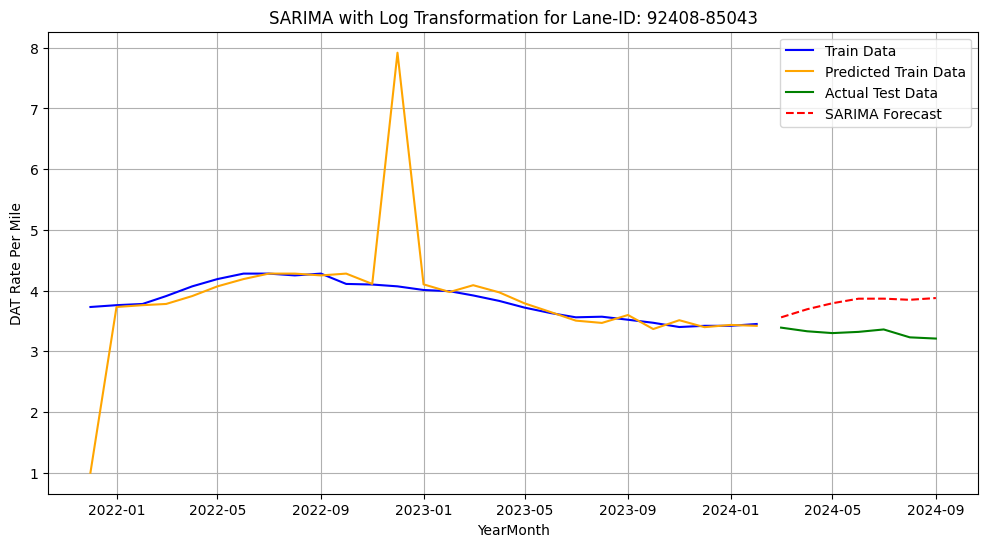

Lane-ID: 27410-45040 - MSE: 0.1318
Forecast Results for Lane-ID: 27410-45040
   YearMonth  Actual  Forecast     Error
0 2024-03-01    2.06  1.981326  0.078674
1 2024-04-01    1.99  1.776906  0.213094
2 2024-05-01    1.93  1.641140  0.288860
3 2024-06-01    1.89  1.466769  0.423231
4 2024-07-01    1.90  1.445385  0.454615
5 2024-08-01    1.88  1.473654  0.406346
6 2024-09-01    1.87  1.383506  0.486494


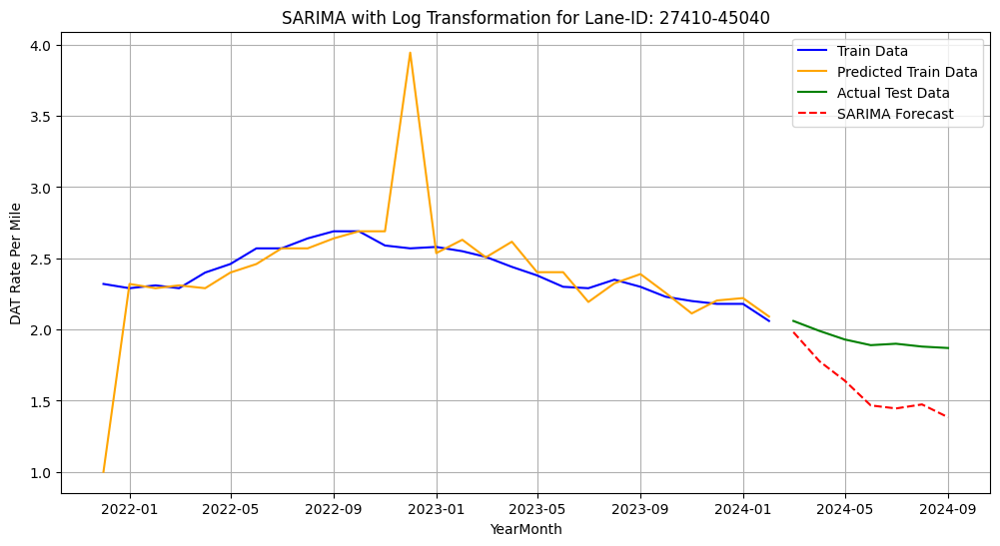

In [76]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.metrics import mean_squared_error

# Function to fit SARIMA with log transformation and visualize the results
def fit_sarima_log(df, lane_id):
    # Ensure 'YearMonth' is datetime and sort by it
    df['YearMonth'] = pd.to_datetime(df['YearMonth'])
    df = df.sort_values('YearMonth').reset_index(drop=True)

    # Split data into train (80%) and test (20%)
    train_size = int(len(df) * 0.8)
    train, test = df.iloc[:train_size], df.iloc[train_size:]

    # Extract the 'DAT Rate Per Mile' series
    train_data = train['DAT Rate Per Mile']
    test_data = test['DAT Rate Per Mile']

    # Apply log transformation to stabilize variance
    train_log = np.log(train_data)

    # Step 1: Fit SARIMA model on log-transformed data
    sarima_model = SARIMAX(train_log, order=(1, 1, 1), seasonal_order=(1, 1, 1, 12))
    sarima_result = sarima_model.fit(disp=False)

    # Step 2: In-sample prediction for train data (log scale)
    train_pred_log = sarima_result.fittedvalues

    # Step 3: Forecast for test period (log scale)
    forecast_log = sarima_result.forecast(steps=len(test_data))

    # Step 4: Reverse the log transformation (exponentiate predictions)
    train_pred = np.exp(train_pred_log)
    forecast = np.exp(forecast_log)

    # Calculate Mean Squared Error (MSE) on original scale
    mse = mean_squared_error(test_data, forecast)
    print(f"Lane-ID: {lane_id} - MSE: {mse:.4f}")

    # Create a DataFrame to display actual, forecast, and error terms
    results_df = pd.DataFrame({
        'YearMonth': test['YearMonth'].values,
        'Actual': test_data.values,
        'Forecast': forecast.values,
        'Error': test_data.values - forecast.values
    })

    # Print the DataFrame
    print(f"Forecast Results for Lane-ID: {lane_id}")
    print(results_df)

    # Plot results
    plt.figure(figsize=(12, 6))
    plt.plot(train['YearMonth'], train_data, label='Train Data', color='blue')
    plt.plot(train['YearMonth'], train_pred, label='Predicted Train Data',color='orange')
    plt.plot(test['YearMonth'], test_data, label='Actual Test Data', color='green')
    plt.plot(test['YearMonth'], forecast, label='SARIMA Forecast', color='red', linestyle='--')

    # Add plot details
    plt.xlabel('YearMonth')
    plt.ylabel('DAT Rate Per Mile')
    plt.title(f'SARIMA with Log Transformation for Lane-ID: {lane_id}')
    plt.legend()
    plt.grid(True)
    plt.show()

# Loop through each DataFrame in the top_10_dfs dictionary
for lane_id, df in top_10_dfs.items():
    fit_sarima_log(df, lane_id)



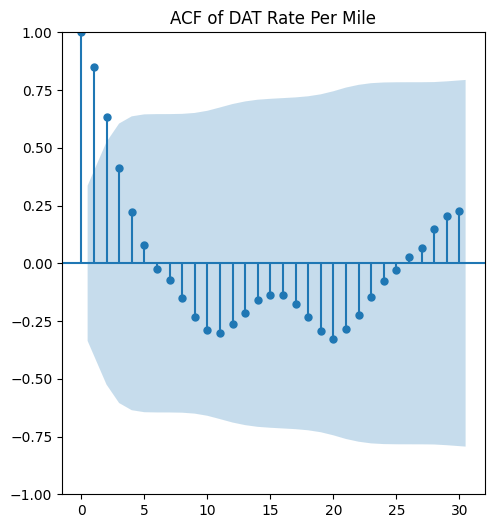

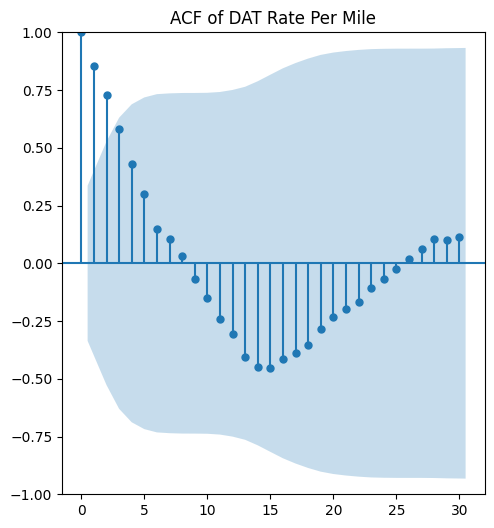

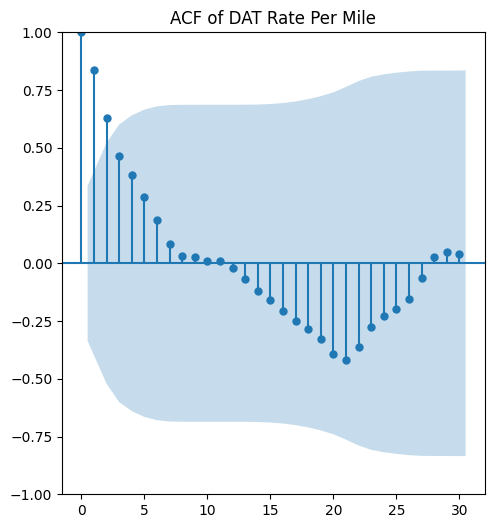

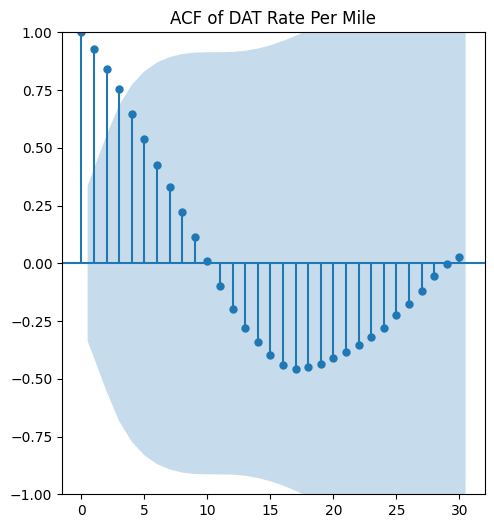

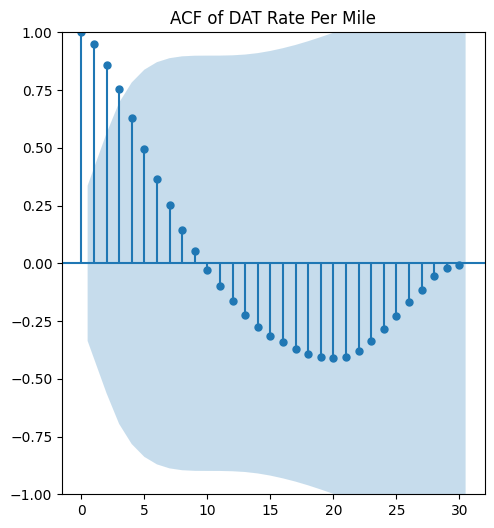

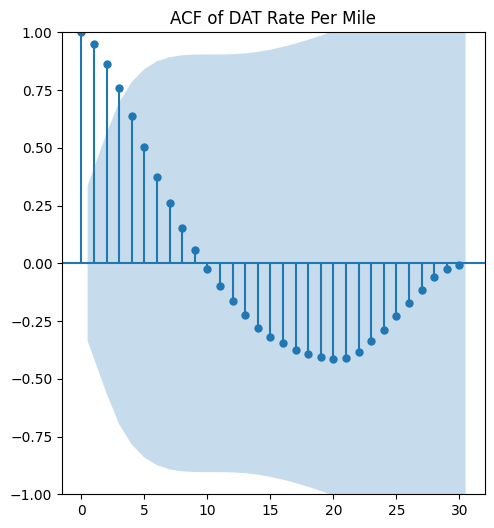

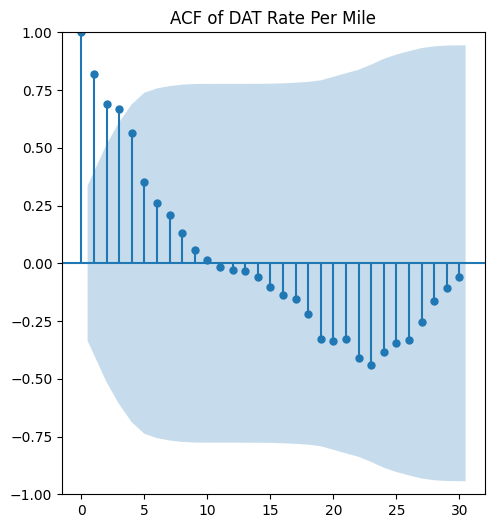

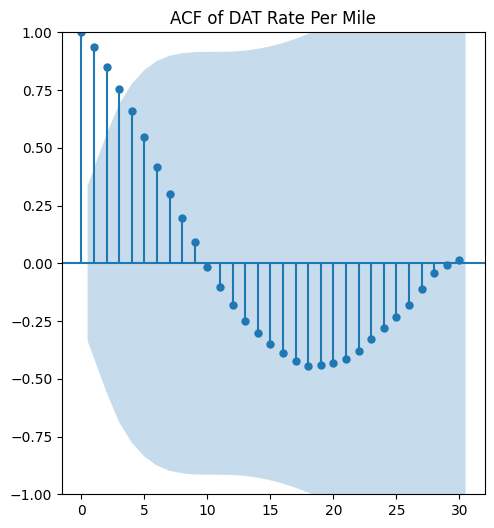

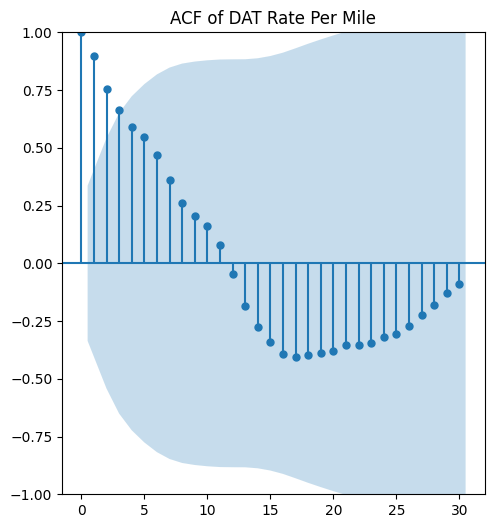

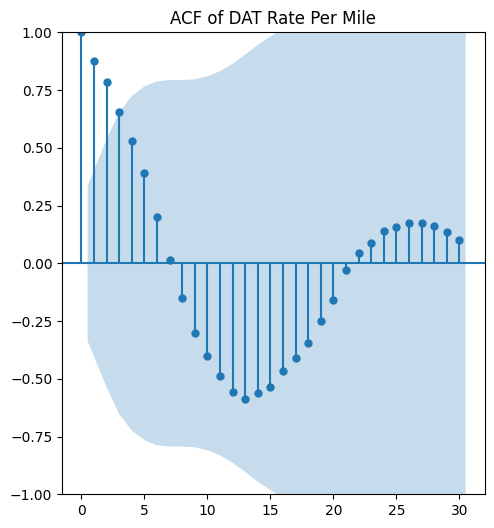

In [35]:
import pandas as pd
import matplotlib.pyplot as plt
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

def plot_acf_pacf(df, column_name, lags=20):
    """
    Plot ACF and PACF for the given time series column in the DataFrame.

    Parameters:
    - df: DataFrame containing the time series.
    - column_name: The column name for which to plot ACF and PACF.
    - lags: Number of lags to display in the plots.
    """
    # Ensure the 'YearMonth' column is in datetime format and sort by it
    df['YearMonth'] = pd.to_datetime(df['YearMonth'])
    df = df.sort_values('YearMonth').reset_index(drop=True)

    # Drop missing values
    df = df.dropna(subset=[column_name])

    # Extract the time series
    ts = df[column_name]

    # Plot ACF and PACF
    plt.figure(figsize=(12, 6))

    # ACF plot
    plt.subplot(1, 2, 1)
    plot_acf(ts, lags=lags, ax=plt.gca())
    plt.title(f'ACF of {column_name}')

# Example call for one lane
for lane_id, df in top_10_dfs.items():
    plot_acf_pacf(df, 'DAT Rate Per Mile', lags=30)



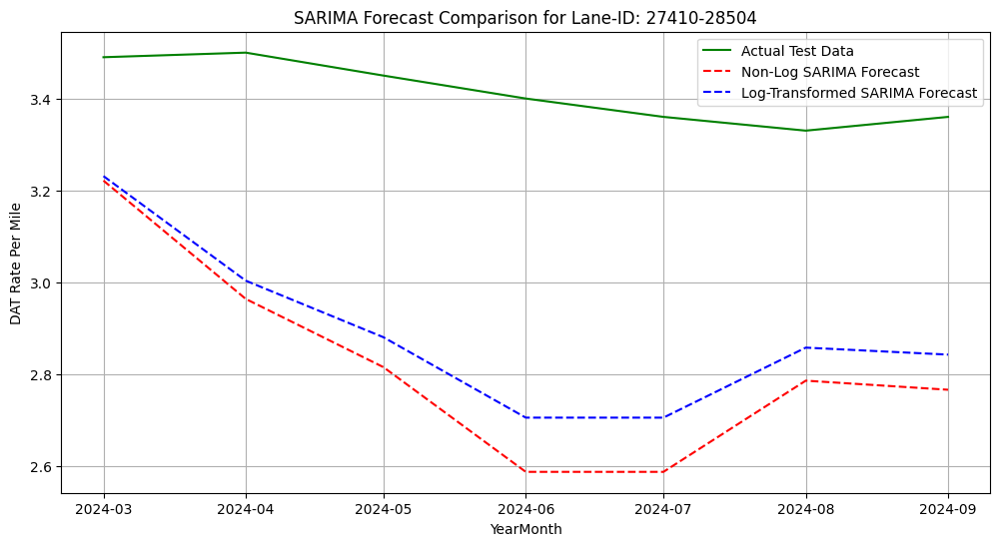

Metrics for Lane-ID: 27410-28504
                    Model       MSE      RMSE        AIC
0          Non-Log SARIMA  0.382059  0.618109 -27.759041
1  Log-Transformed SARIMA  0.292003  0.540373 -62.854116


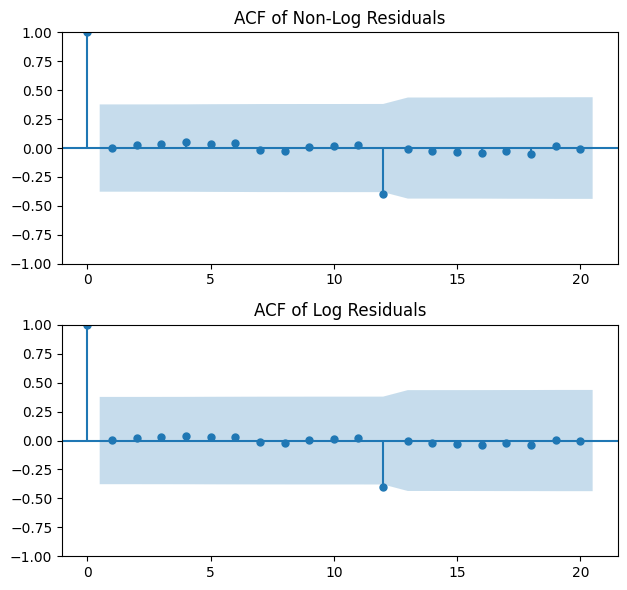

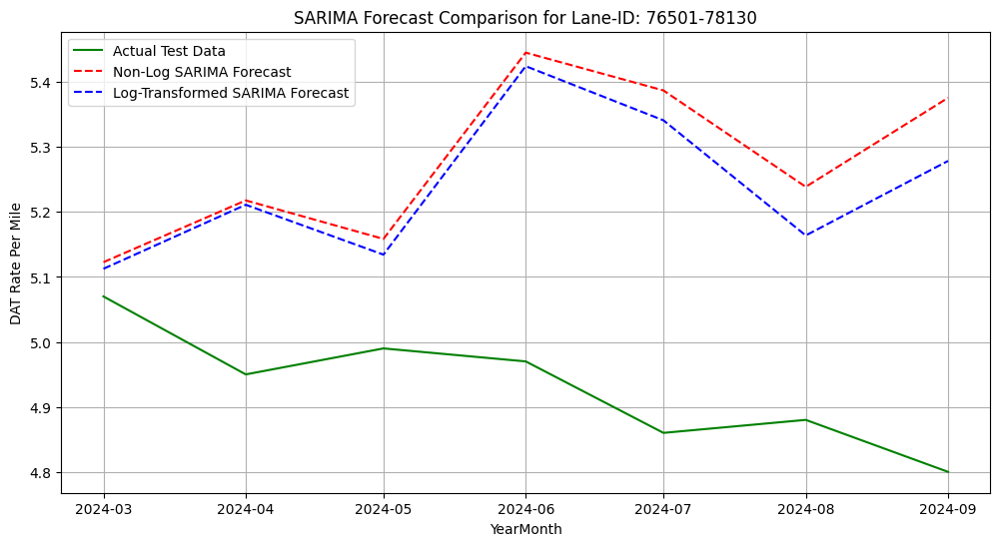

Metrics for Lane-ID: 76501-78130
                    Model       MSE      RMSE        AIC
0          Non-Log SARIMA  0.152413  0.390401  -6.114332
1  Log-Transformed SARIMA  0.119790  0.346108 -50.523867


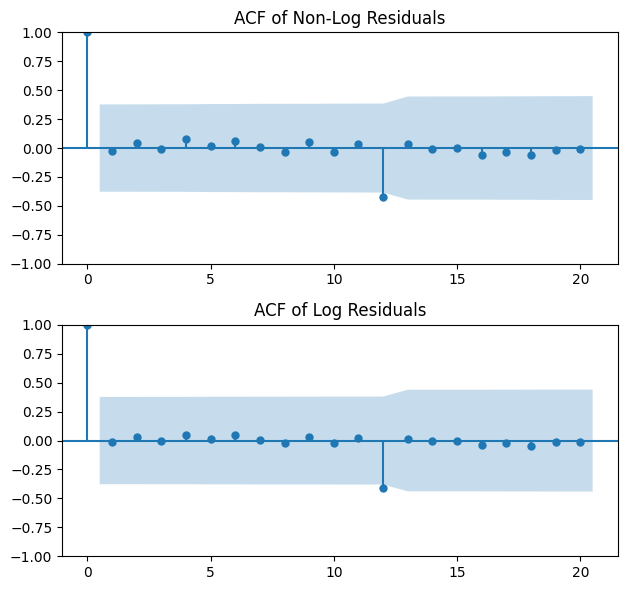

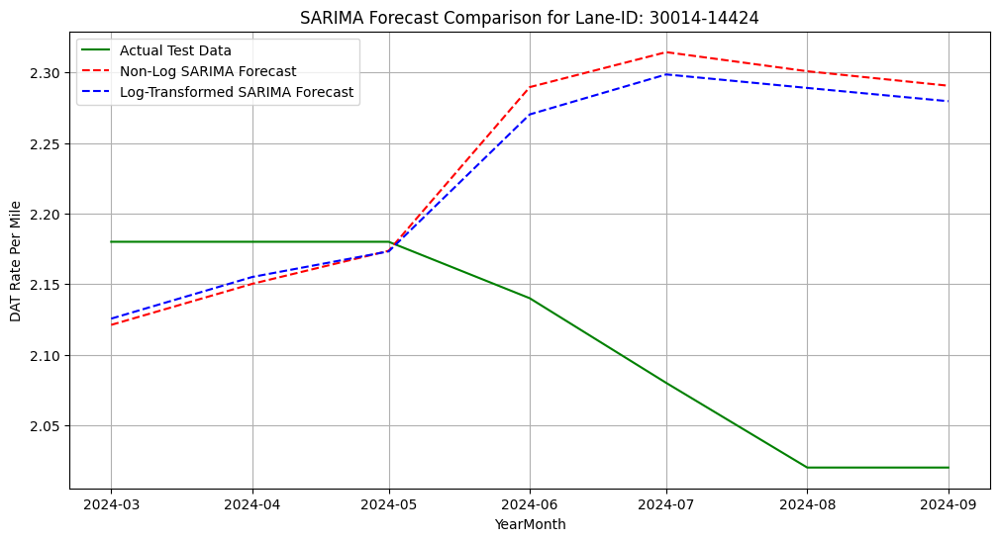

Metrics for Lane-ID: 30014-14424
                    Model       MSE      RMSE        AIC
0          Non-Log SARIMA  0.033408  0.182777 -14.941938
1  Log-Transformed SARIMA  0.029741  0.172456 -39.590807


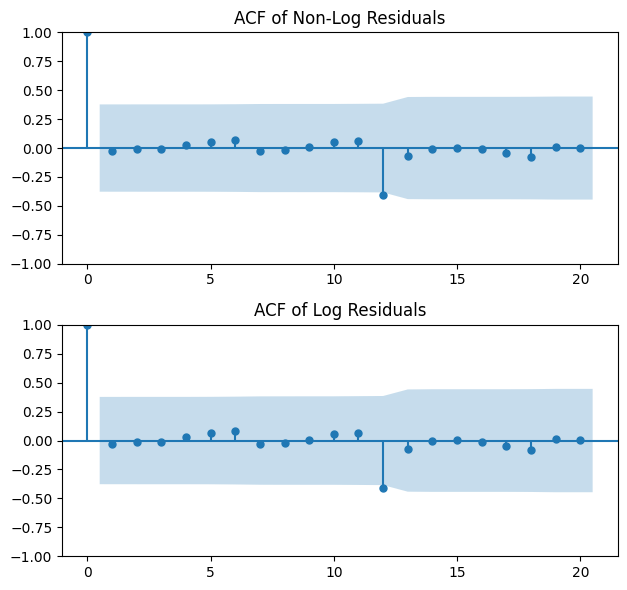

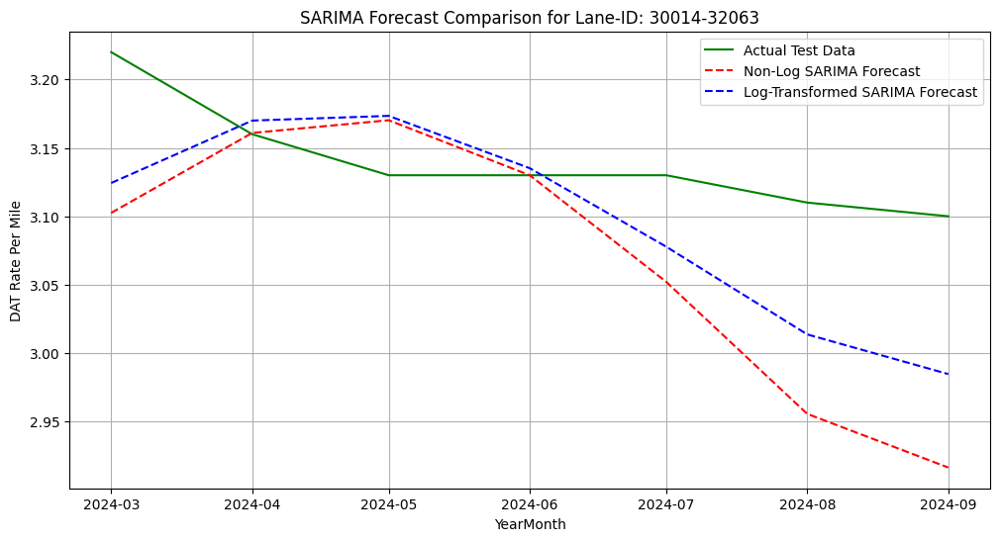

Metrics for Lane-ID: 30014-32063
                    Model       MSE      RMSE        AIC
0          Non-Log SARIMA  0.011303  0.106317 -24.236586
1  Log-Transformed SARIMA  0.005214  0.072208 -57.926027


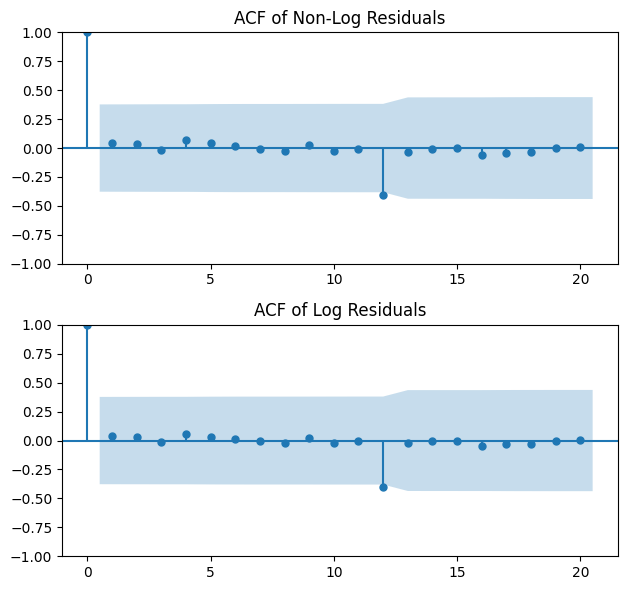

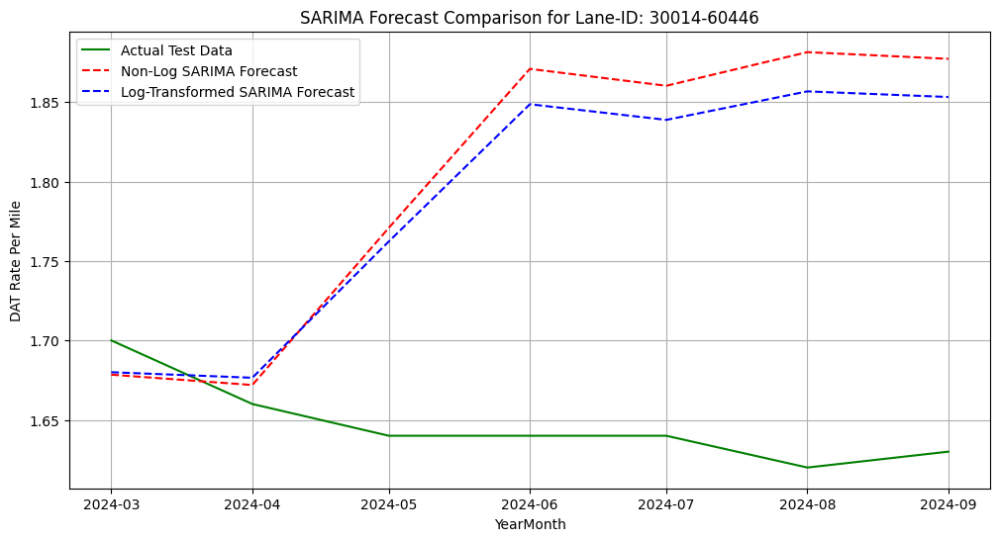

Metrics for Lane-ID: 30014-60446
                    Model       MSE      RMSE        AIC
0          Non-Log SARIMA  0.035582  0.188631 -35.637415
1  Log-Transformed SARIMA  0.029227  0.170958 -54.411707


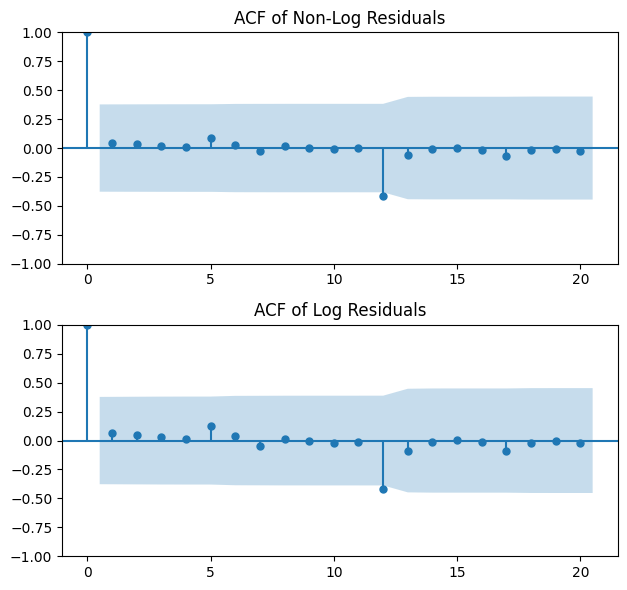

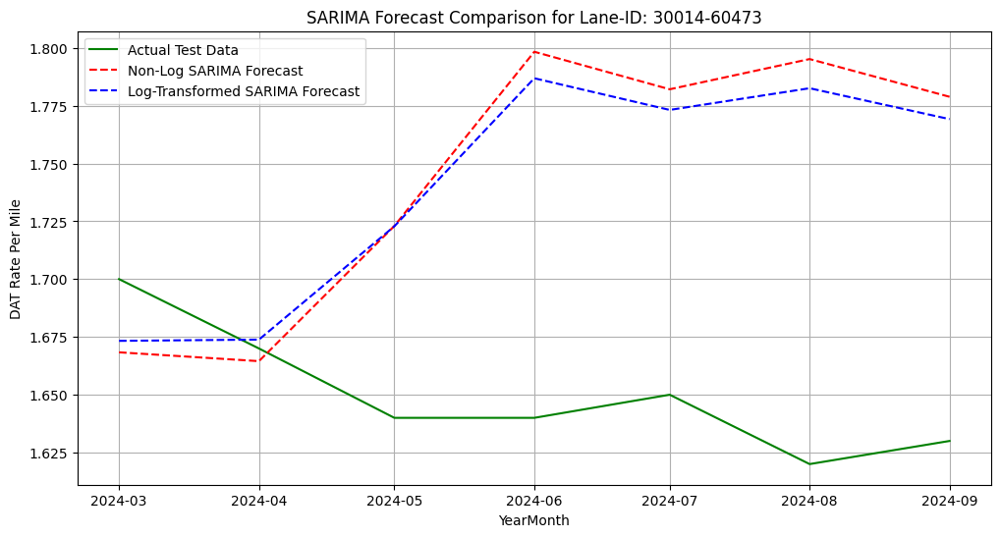

Metrics for Lane-ID: 30014-60473
                    Model       MSE      RMSE        AIC
0          Non-Log SARIMA  0.014756  0.121472 -34.271302
1  Log-Transformed SARIMA  0.012877  0.113478 -53.405095


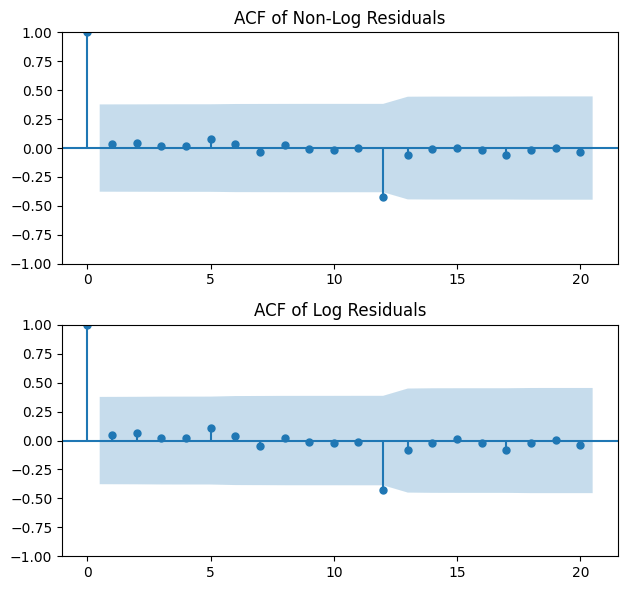

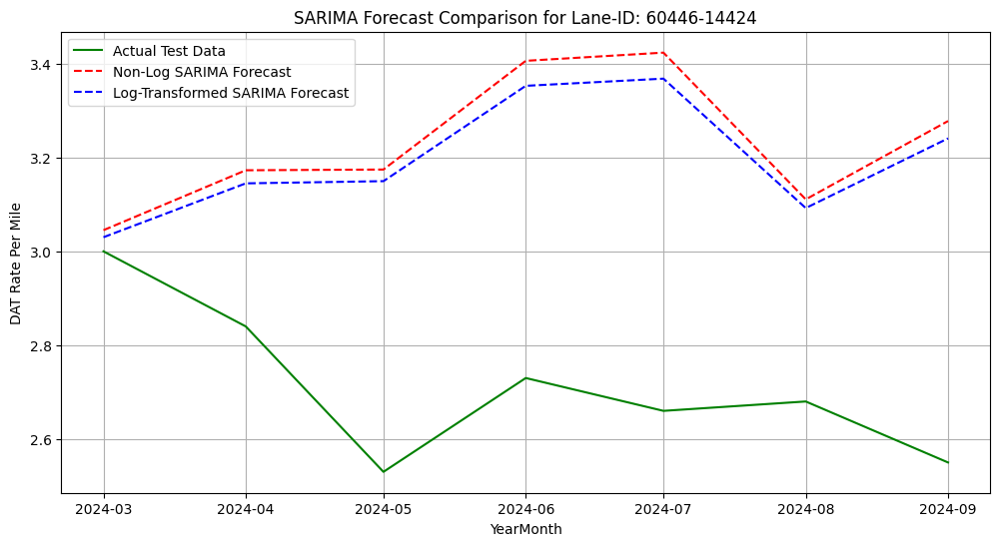

Metrics for Lane-ID: 60446-14424
                    Model       MSE      RMSE        AIC
0          Non-Log SARIMA  0.326178  0.571120   5.465770
1  Log-Transformed SARIMA  0.287727  0.536402 -28.413564


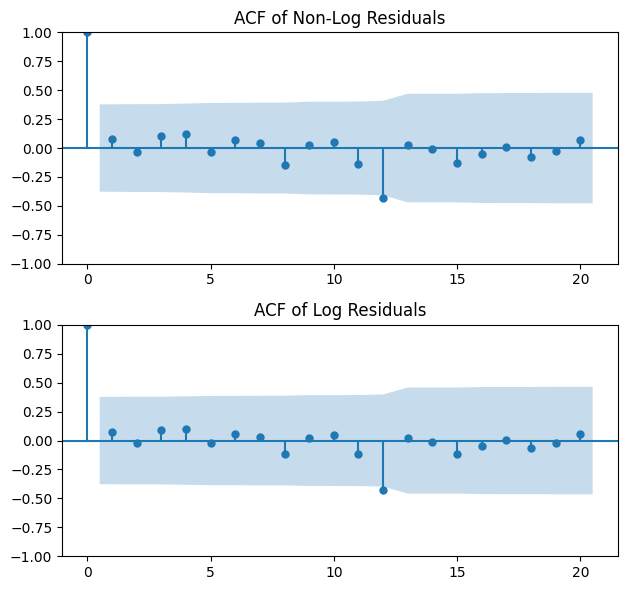

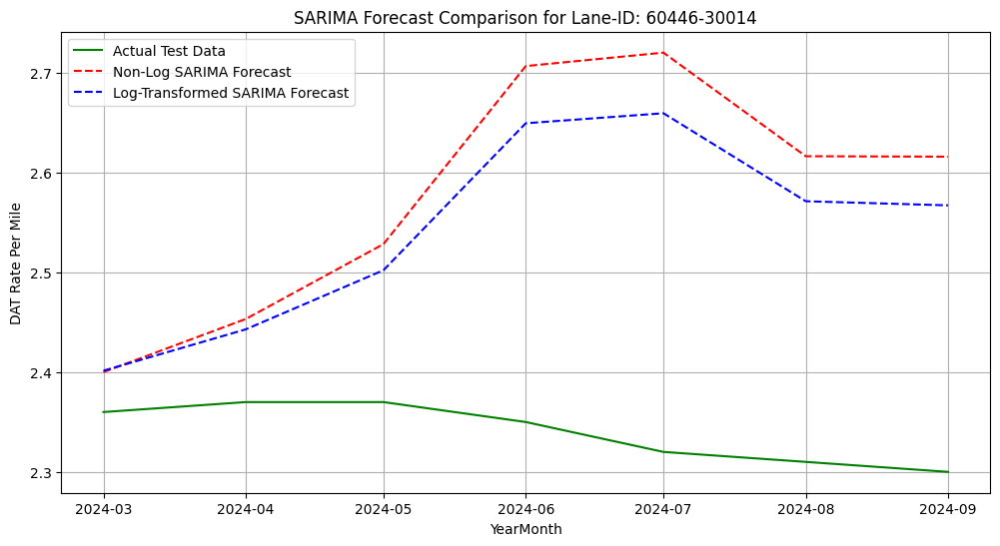

Metrics for Lane-ID: 60446-30014
                    Model       MSE      RMSE        AIC
0          Non-Log SARIMA  0.073670  0.271422 -18.475978
1  Log-Transformed SARIMA  0.052815  0.229816 -47.446452


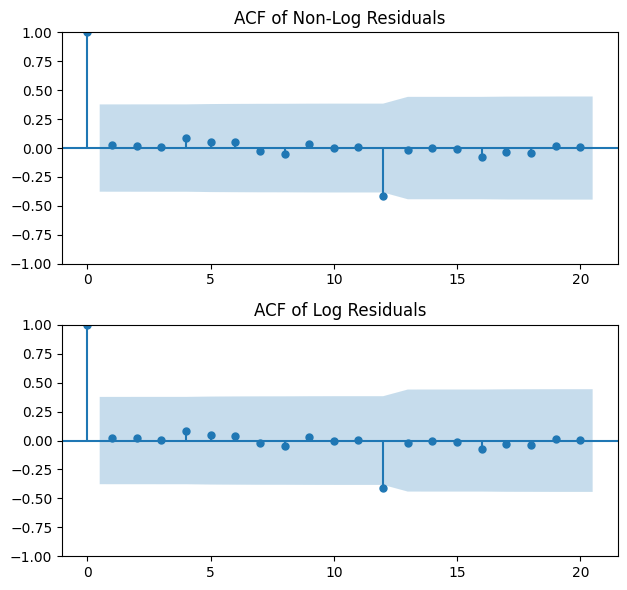

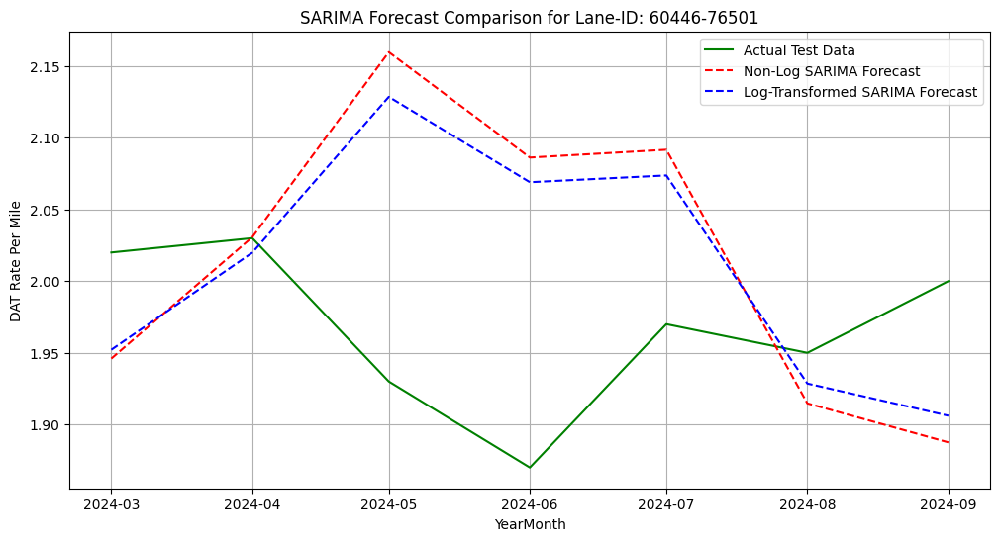

Metrics for Lane-ID: 60446-76501
                    Model       MSE      RMSE        AIC
0          Non-Log SARIMA  0.019098  0.138196  -9.295912
1  Log-Transformed SARIMA  0.014821  0.121741 -33.142661


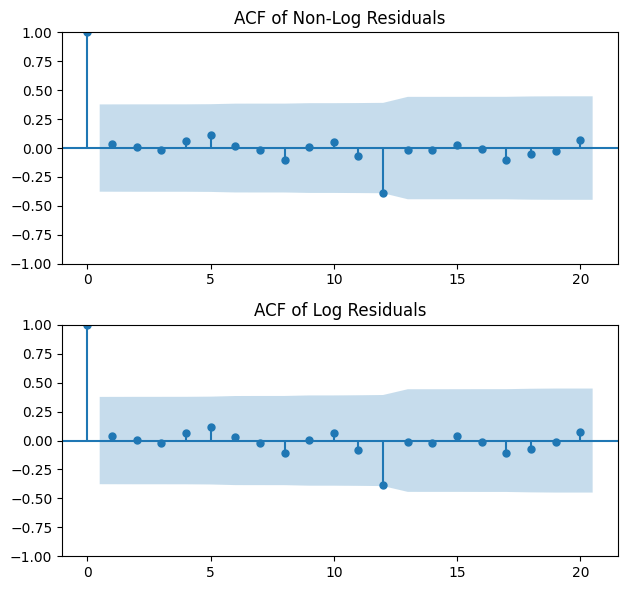

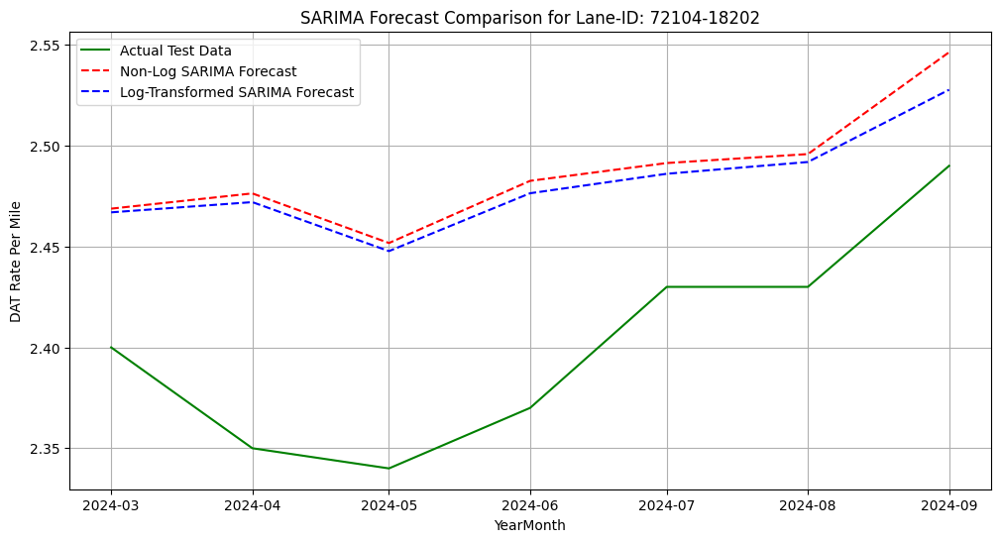

Metrics for Lane-ID: 72104-18202
                    Model       MSE      RMSE        AIC
0          Non-Log SARIMA  0.008162  0.090342 -16.686837
1  Log-Transformed SARIMA  0.007244  0.085110 -43.236650


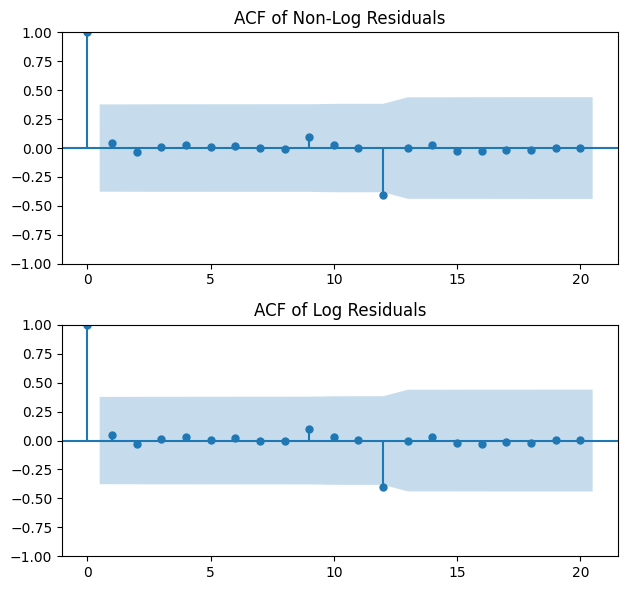

In [41]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.stats.stattools import jarque_bera
from sklearn.metrics import mean_squared_error
from scipy.stats import shapiro

def compare_sarima_models(df, lane_id):
    # Ensure 'YearMonth' is datetime and sort by it
    df['YearMonth'] = pd.to_datetime(df['YearMonth'])
    df = df.sort_values('YearMonth').reset_index(drop=True)

    # Split data into train (80%) and test (20%)
    train_size = int(len(df) * 0.8)
    train, test = df.iloc[:train_size], df.iloc[train_size:]

    # Extract the 'DAT Rate Per Mile' series
    train_data = train['DAT Rate Per Mile']
    test_data = test['DAT Rate Per Mile']

    ### 1. Non-Log SARIMA Model ###
    model_nonlog = SARIMAX(train_data, order=(1, 1, 1), seasonal_order=(1, 1, 1, 12))
    result_nonlog = model_nonlog.fit(disp=False)

    # Forecast for the test period
    forecast_nonlog = result_nonlog.forecast(steps=len(test_data))

    # Calculate MSE and RMSE
    mse_nonlog = mean_squared_error(test_data, forecast_nonlog)
    rmse_nonlog = np.sqrt(mse_nonlog)
    aic_nonlog = result_nonlog.aic

    ### 2. Log-Transformed SARIMA Model ###
    train_log = np.log(train_data)

    model_log = SARIMAX(train_log, order=(1, 1, 1), seasonal_order=(1, 1, 1, 12))
    result_log = model_log.fit(disp=False)

    # Forecast on log scale
    forecast_log = result_log.forecast(steps=len(test_data))
    forecast_log_exp = np.exp(forecast_log)  # Reverse the log transformation

    # Calculate MSE and RMSE
    mse_log = mean_squared_error(test_data, forecast_log_exp)
    rmse_log = np.sqrt(mse_log)
    aic_log = result_log.aic

    ### 3. Residual Diagnostics ###
    residuals_nonlog = result_nonlog.resid
    residuals_log = result_log.resid

    # Jarque-Bera test for normality of residuals
    jb_nonlog = jarque_bera(residuals_nonlog)
    jb_log = jarque_bera(residuals_log)

    ### 4. Plot Actual vs Forecasted ###
    plt.figure(figsize=(12, 6))

    # Plot actual test data
    plt.plot(test['YearMonth'], test_data, label='Actual Test Data', color='green')

    # Plot non-log SARIMA forecast
    plt.plot(test['YearMonth'], forecast_nonlog, label='Non-Log SARIMA Forecast', color='red', linestyle='--')

    # Plot log-transformed SARIMA forecast
    plt.plot(test['YearMonth'], forecast_log_exp, label='Log-Transformed SARIMA Forecast', color='blue', linestyle='--')

    plt.xlabel('YearMonth')
    plt.ylabel('DAT Rate Per Mile')
    plt.title(f'SARIMA Forecast Comparison for Lane-ID: {lane_id}')
    plt.legend()
    plt.grid(True)
    plt.show()

    ### 5. Print Metrics ###
    metrics = pd.DataFrame({
        'Model': ['Non-Log SARIMA', 'Log-Transformed SARIMA'],
        'MSE': [mse_nonlog, mse_log],
        'RMSE': [rmse_nonlog, rmse_log],
        'AIC': [aic_nonlog, aic_log],
    })

    print(f"Metrics for Lane-ID: {lane_id}")
    print(metrics)

    ### 6. Plot Residual Diagnostics ###
    plt.figure(figsize=(12, 6))

    # ACF and PACF for Non-Log Residuals
    plt.subplot(2, 2, 1)
    plot_acf(residuals_nonlog, lags=20, ax=plt.gca())
    plt.title('ACF of Non-Log Residuals')

    # ACF for Log Residuals
    plt.subplot(2, 2, 3)
    plot_acf(residuals_log, lags=20, ax=plt.gca())
    plt.title('ACF of Log Residuals')

    plt.tight_layout()
    plt.show()

# Example call for one lane
for lane_id, df in top_10_dfs.items():
    compare_sarima_models(df, lane_id)



In [77]:
import pmdarima as pm
import numpy as np
import pandas as pd
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score

def fit_sarima_log(df, lane_id):
    df['YearMonth'] = pd.to_datetime(df['YearMonth'])
    df = df.sort_values('YearMonth').reset_index(drop=True)

    # Split data into train (80%) and test (20%)
    train_size = int(len(df) * 0.8)
    train, test = df.iloc[:train_size], df.iloc[train_size:]

    train_data = train['DAT Rate Per Mile']
    test_data = test['DAT Rate Per Mile']

    # Apply log transformation to stabilize variance
    train_log = np.log(train_data)

    # Auto ARIMA model fitting
    auto_model = pm.auto_arima(train_log, seasonal=True, m=12, stepwise=True, trace=False)

    # In-sample prediction for train data (log scale)
    train_pred_log = auto_model.predict_in_sample()

    # Forecast for test period (log scale)
    forecast_log = auto_model.predict(n_periods=len(test_data))

    # Reverse the log transformation (exponentiate predictions)
    train_pred = np.exp(train_pred_log)
    forecast = np.exp(forecast_log)

    # Calculate Mean Squared Error (MSE)
    mse = mean_squared_error(test_data, forecast)

    # Create DataFrame to display actual, forecast, and error terms
    results_df = pd.DataFrame({
        'YearMonth': test['YearMonth'].values,
        'Actual': test_data.values,
        'Forecast': forecast.values,
        'Error': test_data.values - forecast.values
    })

    return {'results_df': results_df, 'mse': mse}

def regression_comparison(df, lane_id):
    df['YearMonth'] = pd.to_datetime(df['YearMonth'])
    df = df.sort_values('YearMonth').reset_index(drop=True)

    df = df.dropna(subset=['DAT Rate Per Mile', 'Dt Spot RPM'])
    df['Lag_Contract_Rate'] = df['DAT Rate Per Mile'].shift(1)
    df = df.dropna().reset_index(drop=True)

    X = df[['Lag_Contract_Rate', 'Dt Spot RPM']]
    y = df['DAT Rate Per Mile']

    train_size = int(len(df) * 0.8)
    X_train, X_test = X[:train_size], X[train_size:]
    y_train, y_test = y[:train_size], y[train_size:]

    # Model 1: Linear Regression
    model1 = LinearRegression()
    model1.fit(X_train, y_train)
    y_pred1 = model1.predict(X_test)

    mse1 = mean_squared_error(y_test, y_pred1)
    r2_1 = r2_score(y_test, y_pred1)

    # Model 2: Log-Log Linear Regression
    X_log = np.log(df[['Lag_Contract_Rate', 'Dt Spot RPM']])
    y_log = np.log(df['DAT Rate Per Mile'])
    X_train_log, X_test_log = X_log[:train_size], X_log[train_size:]
    y_train_log, y_test_log = y_log[:train_size], y_log[train_size:]

    model2 = LinearRegression()
    model2.fit(X_train_log, y_train_log)
    y_pred_log = model2.predict(X_test_log)

    y_pred2 = np.exp(y_pred_log)

    mse2 = mean_squared_error(y_test, y_pred2)
    r2_2 = r2_score(y_test, y_pred2)

    # Prepare results DataFrame
    results_df = pd.DataFrame({
        'YearMonth': df['YearMonth'][train_size:].reset_index(drop=True),
        'Actual Values': y_test.reset_index(drop=True),
        'Regression 1 Forecast': y_pred1,
        'Regression 1 Error': y_test.reset_index(drop=True) - y_pred1,
        'Regression 2 Forecast': y_pred2,
        'Regression 2 Error': y_test.reset_index(drop=True) - y_pred2
    })

    return {
        'MSE': [mse1, mse2],
        'R²': [r2_1, r2_2],
        'results_df': results_df
    }

# Initialize an empty list to store the results
combined_results = []

# Loop through each lane_id and DataFrame in top_10_dfs
for lane_id, df in top_10_dfs.items():
    # SARIMA Results using auto_arima
    sarima_result = fit_sarima_log(df, lane_id)  # This function now returns a dictionary
    regression_result = regression_comparison(df, lane_id)  # This function returns a dictionary

    # Extract MSE from SARIMA and regression
    sarima_mse = sarima_result['mse']
    reg_mse1 = regression_result['MSE'][0]
    reg_mse2 = regression_result['MSE'][1]

    # Extract R² from regression
    reg_r2_1 = regression_result['R²'][0]
    reg_r2_2 = regression_result['R²'][1]

    # Merge actual values and forecast data from SARIMA and Regression
    combined_df = pd.merge(sarima_result['results_df'], regression_result['results_df'], on='YearMonth', how='left')

    # Add MSE and R² columns to the combined DataFrame
    combined_df['SARIMA_MSE'] = sarima_mse
    combined_df['Reg_MSE_1'] = reg_mse1
    combined_df['Reg_MSE_2'] = reg_mse2
    combined_df['Reg_R2_1'] = reg_r2_1
    combined_df['Reg_R2_2'] = reg_r2_2

    # Add lane_id as a new column to the combined_df
    combined_df['Lane_ID'] = lane_id

    # Append the combined DataFrame to the list
    combined_results.append(combined_df)

# Concatenate all lane results into a final DataFrame
final_results_df = pd.concat(combined_results, ignore_index=True)

# Print the final combined DataFrame with lane_id
print(final_results_df[['Lane_ID', 'YearMonth', 'Actual', 'Forecast', 'Error', 'Regression 1 Forecast', 'Regression 1 Error',
                        'Regression 2 Forecast', 'Regression 2 Error', 'SARIMA_MSE', 'Reg_MSE_1', 'Reg_MSE_2',
                        'Reg_R2_1', 'Reg_R2_2']].head())


       Lane_ID  YearMonth  Actual  Forecast     Error  Regression 1 Forecast  \
0  27410-28504 2024-03-01    3.49  3.328965  0.161035               3.448137   
1  27410-28504 2024-04-01    3.50  3.297802  0.202198               3.527140   
2  27410-28504 2024-05-01    3.45  3.304921  0.145079               3.533479   
3  27410-28504 2024-06-01    3.40  3.338043  0.061957               3.490468   
4  27410-28504 2024-07-01    3.36  3.385409 -0.025409               3.442774   

   Regression 1 Error  Regression 2 Forecast  Regression 2 Error  SARIMA_MSE  \
0            0.041863               3.446006            0.043994    0.017018   
1           -0.027140               3.524839           -0.024839    0.017018   
2           -0.083479               3.531273           -0.081273    0.017018   
3           -0.090468               3.487691           -0.087691    0.017018   
4           -0.082774               3.440048           -0.080048    0.017018   

   Reg_MSE_1  Reg_MSE_2  Reg_R2_1  Reg

In [78]:
final_results_df.head()

,YearMonth,Actual,Forecast,Error,Actual Values,Regression 1 Forecast,Regression 1 Error,Regression 2 Forecast,Regression 2 Error,SARIMA_MSE,Reg_MSE_1,Reg_MSE_2,Reg_R2_1,Reg_R2_2,Lane_ID
0,2024-03-01,3.49,3.328965,0.161035,3.49,3.448137,0.041863,3.446006,0.043994,0.017018,0.00463,0.004337,-0.176692,-0.102219,27410-28504
1,2024-04-01,3.50,3.297802,0.202198,3.50,3.527140,-0.027140,3.524839,-0.024839,0.017018,0.00463,0.004337,-0.176692,-0.102219,27410-28504
2,2024-05-01,3.45,3.304921,0.145079,3.45,3.533479,-0.083479,3.531273,-0.081273,0.017018,0.00463,0.004337,-0.176692,-0.102219,27410-28504
3,2024-06-01,3.40,3.338043,0.061957,3.40,3.490468,-0.090468,3.487691,-0.087691,0.017018,0.00463,0.004337,-0.176692,-0.102219,27410-28504
4,2024-07-01,3.36,3.385409,-0.025409,3.36,3.442774,-0.082774,3.440048,-0.080048,0.017018,0.00463,0.004337,-0.176692,-0.102219,27410-28504


In [67]:
from google.colab import sheets
sheet = sheets.InteractiveSheet(df=final_results_df)

https://docs.google.com/spreadsheets/d/11nsfybdd2YXHBlyBvbP17N-e1FNmiioUC61-qD0fiUI#gid=0


In [79]:
# Calculate the absolute errors for SARIMA, Regression 1, and Regression 2
final_results_df['SARIMA_Abs_Error'] = final_results_df['Error'].abs()
final_results_df['Reg1_Abs_Error'] = final_results_df['Regression 1 Error'].abs()
final_results_df['Reg2_Abs_Error'] = final_results_df['Regression 2 Error'].abs()

# Create columns for the least absolute error and the corresponding model
final_results_df['Least_Abs_Error'] = final_results_df[['SARIMA_Abs_Error', 'Reg1_Abs_Error', 'Reg2_Abs_Error']].min(axis=1)
final_results_df['Best_Model'] = final_results_df.apply(
    lambda row: 'SARIMA' if row['Least_Abs_Error'] == row['SARIMA_Abs_Error'] else
                ('Regression 1' if row['Least_Abs_Error'] == row['Reg1_Abs_Error'] else 'Regression 2'),
    axis=1
)

# Drop the absolute error columns for clarity
final_results_df.drop(columns=['SARIMA_Abs_Error', 'Reg1_Abs_Error', 'Reg2_Abs_Error'], inplace=True)

# Print the final DataFrame with the least error and corresponding model, lane-wise
final_results_df_lane_wise = final_results_df[['Lane_ID', 'YearMonth', 'Actual', 'Forecast', 'Error', 'Regression 1 Forecast',
                                                'Regression 1 Error', 'Regression 2 Forecast', 'Regression 2 Error',
                                                'Least_Abs_Error', 'Best_Model']]

# Display the lane-wise results
final_results_df_lane_wise.head()


,Lane_ID,YearMonth,Actual,Forecast,Error,Regression 1 Forecast,Regression 1 Error,Regression 2 Forecast,Regression 2 Error,Least_Abs_Error,Best_Model
0,27410-28504,2024-03-01,3.49,3.328965,0.161035,3.448137,0.041863,3.446006,0.043994,0.041863,Regression 1
1,27410-28504,2024-04-01,3.50,3.297802,0.202198,3.527140,-0.027140,3.524839,-0.024839,0.024839,Regression 2
2,27410-28504,2024-05-01,3.45,3.304921,0.145079,3.533479,-0.083479,3.531273,-0.081273,0.081273,Regression 2
3,27410-28504,2024-06-01,3.40,3.338043,0.061957,3.490468,-0.090468,3.487691,-0.087691,0.061957,SARIMA
4,27410-28504,2024-07-01,3.36,3.385409,-0.025409,3.442774,-0.082774,3.440048,-0.080048,0.025409,SARIMA


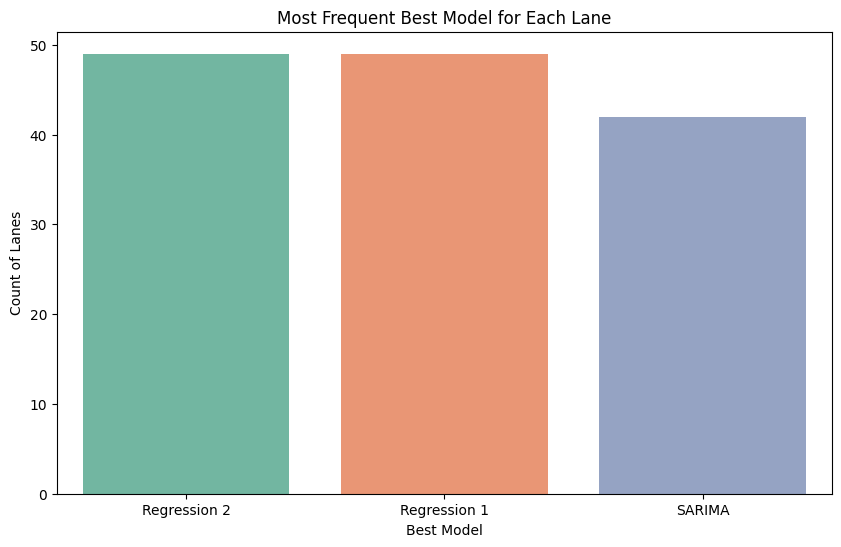

In [80]:
import matplotlib.pyplot as plt
import seaborn as sns

# Calculate the mode (most frequent best model) for each Lane_ID
best_model_mode = final_results_df_lane_wise.groupby('Lane_ID')['Best_Model'].agg(lambda x: x.mode()[0]).reset_index()

# Merge the mode results with the original DataFrame to get lane-wise best model
final_results_df_lane_wise = final_results_df_lane_wise.merge(best_model_mode, on='Lane_ID', how='left', suffixes=('', '_Mode'))

# Create a count plot for the most frequent best model across lanes
plt.figure(figsize=(10, 6))
sns.countplot(data=final_results_df_lane_wise, x='Best_Model_Mode', palette='Set2')
plt.title('Most Frequent Best Model for Each Lane')
plt.xlabel('Best Model')
plt.ylabel('Count of Lanes')
plt.show()


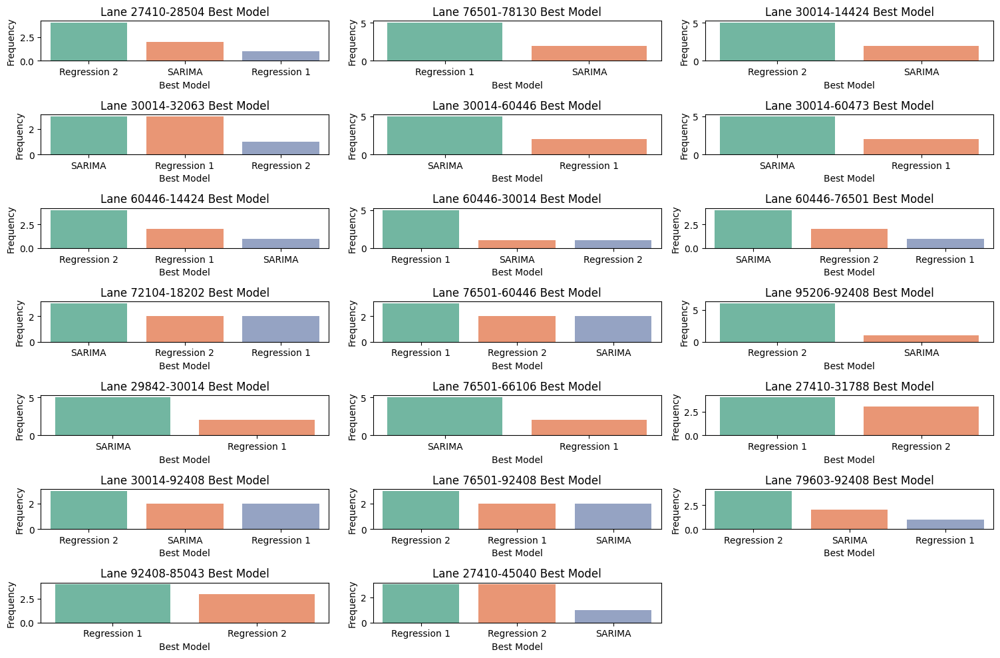

In [81]:
import matplotlib.pyplot as plt
import seaborn as sns

# Calculate the mode (most frequent best model) for each Lane_ID
best_model_mode = final_results_df_lane_wise.groupby('Lane_ID')['Best_Model'].agg(lambda x: x.mode()[0]).reset_index()

# Merge the mode results with the original DataFrame to get lane-wise best model
final_results_df_lane_wise = final_results_df_lane_wise.merge(best_model_mode, on='Lane_ID', how='left', suffixes=('', '_Mode'))

# Set up the figure for lane-wise plotting
plt.figure(figsize=(15, 10))

# Loop through each lane and plot the best model distribution for that lane
for lane_id in final_results_df_lane_wise['Lane_ID'].unique():
    lane_data = final_results_df_lane_wise[final_results_df_lane_wise['Lane_ID'] == lane_id]

    # Count the occurrences of each best model for the current lane
    model_counts = lane_data['Best_Model'].value_counts()

    # Plot the bar chart for the current lane
    plt.subplot(len(final_results_df_lane_wise['Lane_ID'].unique()) // 3 + 1, 3, list(final_results_df_lane_wise['Lane_ID'].unique()).index(lane_id) + 1)
    sns.barplot(x=model_counts.index, y=model_counts.values, palette='Set2')
    plt.title(f'Lane {lane_id} Best Model')
    plt.xlabel('Best Model')
    plt.ylabel('Frequency')

# Adjust layout to make sure the plots fit
plt.tight_layout()
plt.show()
